# Visualize nilearn GLM + 2nd level analysis: BI (task)

In [1]:
###RUN ONLY FOR WHOLE SAMPLE


import os
import re
import glob
from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from nilearn import image
from nilearn.image import load_img, math_img, threshold_img
from nilearn.plotting import (
    plot_stat_map, plot_glass_brain, plot_design_matrix,
    plot_anat, plot_img
)

# ---- Set these paths ----
OUTPUT_DIR = Path("/nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI") #for whole sample

# Optional: provide a template background; if None, nilearn will use MNI152 by default in some plots
BG_IMG = None  # e.g. "/path/to/MNI152_T1_2mm_brain.nii.gz"

# Subjects to QC (subset if you want)
SUBJECTS = None  # None = auto-detect all in OUTPUT_DIR, do whole sample

# Contrasts you wrote in the GLM script
#CONTRASTS = ["Liked", "Disliked", "Neutral", "Liked_gt_Disliked", "Liked_gt_Neutral", "Value"]
CONTRASTS = ["stim", "resp", "outcome", "Aligned", "Unaligned", "Aligned_gt_Unaligned", "Correct", "Incorrect",
             "Correct_gt_Incorrect", "CorrectAligned_gt_IncorrectAligned", "CorrectUnaligned_gt_IncorrectUnaligned",
             "CorrectAligned_gt_CorrectUnaligned", "IncorrectAligned_gt_IncorrectUnaligned"]


# Display defaults
DISPLAY_MODE = "ortho"
CUT_COORDS = (0, -20, 10)
Z_THRESHOLD = 3.1   # adjust
TOP_N_PEAKS = 10    # for peak table per map

# for anatomy
DERIVATIVES_ROOT = Path("/nfs/roberts/pi/pi_il77/Alex/foodvaluation/foodvaluation_BIDS/derivatives")

def subject_anat_bg(sub: str, ses: str = "1") -> Path | None:
    anat = (
        DERIVATIVES_ROOT
        / sub
        / f"ses-{ses}"
        / "anat"
        / f"{sub}_ses-{ses}_acq-mprage_space-MNI152NLin2009cAsym_res-2_desc-preproc_T1w.nii.gz"
    )
    return anat if anat.exists() else None


In [38]:
###RUN ONLY FOR DECOUPLED

import os
import re
import glob
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import image
from nilearn.image import load_img, math_img, threshold_img
from nilearn.plotting import (
    plot_stat_map, plot_glass_brain, plot_design_matrix,
    plot_anat, plot_img
)

# ---- Set these paths ----
OUTPUT_DIR = Path("/nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI")  # whole sample

# Optional: provide a template background; if None, nilearn will use MNI152 by default in some plots
BG_IMG = None

# -----------------------------
# SUBJECT HANDLING (fixes "subjects don't exist" later)
# Make SUBJECTS match your on-disk folder naming, e.g. sub-003
# -----------------------------
# Your decoupled subset as numeric IDs:
_SUBJECTS_NUMERIC = [
    "003", "005", "013", "020", "023", "025", "026", "029", "030",
    "101", "108", "117", "121", "201", "214", "215", "220",
    "008", "017", "022", "027", "112", "124", "212", "219"
]

# Convert to folder names that exist under OUTPUT_DIR.
# If OUTPUT_DIR contains sub-XXX folders, SUBJECTS becomes ["sub-003", ...].
# If it contains XXX folders, SUBJECTS stays ["003", ...].
if any((OUTPUT_DIR / f"sub-{s}").exists() for s in _SUBJECTS_NUMERIC):
    SUBJECTS = [f"sub-{s}" for s in _SUBJECTS_NUMERIC]
else:
    SUBJECTS = _SUBJECTS_NUMERIC

print("Using SUBJECTS (first 5):", SUBJECTS[:5])
print("N SUBJECTS:", len(SUBJECTS))

# Contrasts you wrote in the GLM script
CONTRASTS = [
    "stim", "resp", "outcome", "Aligned", "Unaligned", "Aligned_gt_Unaligned",
    "Correct", "Incorrect", "Correct_gt_Incorrect",
    "CorrectAligned_gt_IncorrectAligned", "CorrectUnaligned_gt_IncorrectUnaligned",
    "CorrectAligned_gt_CorrectUnaligned", "IncorrectAligned_gt_IncorrectUnaligned"
]

# Display defaults
DISPLAY_MODE = "ortho"
CUT_COORDS = (0, -20, 10)
Z_THRESHOLD = 3.1
TOP_N_PEAKS = 10

# for anatomy
DERIVATIVES_ROOT = Path("/nfs/roberts/pi/pi_il77/Alex/foodvaluation/foodvaluation_BIDS/derivatives")

def subject_anat_bg(sub: str, ses: str = "1") -> Path | None:
    # sub is expected to be like "sub-003" (if your derivatives are BIDS-like)
    anat = (
        DERIVATIVES_ROOT
        / sub
        / f"ses-{ses}"
        / "anat"
        / f"{sub}_ses-{ses}_acq-mprage_space-MNI152NLin2009cAsym_res-2_desc-preproc_T1w.nii.gz"
    )
    return anat if anat.exists() else None

Using SUBJECTS (first 5): ['sub-003', 'sub-005', 'sub-013', 'sub-020', 'sub-023']
N SUBJECTS: 25


In [2]:
def list_subjects(output_dir: Path):
    if not output_dir.exists():
        print(f"[Error] OUTPUT_DIR does not exist: {output_dir}")
        return []
    subs = sorted([p.name for p in output_dir.glob("sub-*") if p.is_dir()])
    if len(subs) == 0:
        print(f"[Error] Found 0 sub-* folders under: {output_dir}")
        print("        Check that OUTPUT_DIR points to the directory that contains sub-XXX folders.")
    return subs

def find_maps_for_subject(output_dir: Path, sub: str):
    if sub is None:
        raise ValueError("sub is None. SUBJECTS is empty; fix OUTPUT_DIR or set SUB_TO_CHECK manually (e.g., 'sub-002').")
    out = {}
    sub_dir = output_dir / sub
    for contrast in CONTRASTS:
        out.setdefault(contrast, {})
        for maptype in ["z", "t", "effect", "variance"]:
            p = sub_dir / f"{sub}_{contrast}_{maptype}.nii.gz"
            if p.exists():
                out[contrast][maptype] = p
    return out

def find_design_matrices(output_dir: Path, sub: str):
    """Return list of (label, csv_path, png_path) for design matrices."""
    sub_dir = output_dir / sub
    csvs = sorted(sub_dir.glob(f"{sub}_*_design_matrix.csv"))
    results = []
    for csv_path in csvs:
        # label is whatever is between sub_ and _design_matrix.csv
        label = csv_path.name.replace(f"{sub}_", "").replace("_design_matrix.csv", "")
        png_path = sub_dir / f"{sub}_{label}_design_matrix.png"
        results.append((label, csv_path, png_path if png_path.exists() else None))
    return results

if SUBJECTS is None:
    SUBJECTS = list_subjects(OUTPUT_DIR)

print(f"Found {len(SUBJECTS)} subject folders under:\n  {OUTPUT_DIR}")
print("First few:", SUBJECTS[:10])

Found 50 subject folders under:
  /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI
First few: ['sub-002', 'sub-003', 'sub-004', 'sub-005', 'sub-006', 'sub-007', 'sub-008', 'sub-010', 'sub-011', 'sub-012']


In [3]:
def load_design_matrix(csv_path: Path) -> pd.DataFrame:
    dm = pd.read_csv(csv_path, index_col=0)
    return dm

def design_qc(dm: pd.DataFrame):
    """Return simple QC diagnostics for a design matrix."""
    # Identify suspicious columns: near-constant, huge variance, etc.
    variances = dm.var(axis=0)
    near_zero = variances[variances < 1e-8].index.tolist()

    # Correlation matrix (excluding constant if present)
    corr = dm.corr()
    # Max absolute correlation off-diagonal
    max_abs_corr = (corr.where(~np.eye(corr.shape[0], dtype=bool)).abs().max().max()
                    if corr.shape[0] > 1 else np.nan)

    return {
        "n_timepoints": dm.shape[0],
        "n_regressors": dm.shape[1],
        "near_zero_var_cols": near_zero,
        "max_abs_corr_offdiag": max_abs_corr,
    }

def show_design(sub: str, label: str, csv_path: Path):
    dm = load_design_matrix(csv_path)
    qc = design_qc(dm)
    
    # define fig_w based on number of regressors (columns)
    fig_w = max(12, dm.shape[1] * 0.35)
    fig_h = 15

    fig, ax = plt.subplots(figsize=(fig_w, fig_h))
    plot_design_matrix(dm, ax=ax)
    
    ax.set_title(f"{sub} | {label}\n"
                 f"TP={qc['n_timepoints']}  Regr={qc['n_regressors']}  "
                 f"Max|r|={qc['max_abs_corr_offdiag']:.3f}  "
                 f"Near0Var={len(qc['near_zero_var_cols'])}")
    plt.tight_layout()
    plt.show()

    if qc["near_zero_var_cols"]:
        print("Near-zero variance columns (often OK for some confounds, but worth checking):")
        print(qc["near_zero_var_cols"][:50])


In [4]:
def img_basic_stats(img_path: Path):
    img = load_img(str(img_path))
    data = img.get_fdata()
    finite = np.isfinite(data)
    if finite.any():
        mn, mx = float(data[finite].min()), float(data[finite].max())
        mean, std = float(data[finite].mean()), float(data[finite].std())
    else:
        mn = mx = mean = std = np.nan
    return {
        "path": str(img_path),
        "shape": img.shape,
        "n_nan": int(np.size(data) - finite.sum()),
        "min": mn,
        "max": mx,
        "mean": mean,
        "std": std,
    }

def peak_table_from_z(z_img_path: Path, threshold=3.1, top_n=10):
    """
    Simple peak extraction without requiring masking/atlas:
    find top-N voxels by z value above threshold.
    """
    img = load_img(str(z_img_path))
    data = img.get_fdata()
    data = np.where(np.isfinite(data), data, -np.inf)
    mask = data > threshold
    if not np.any(mask):
        return pd.DataFrame(columns=["z", "i", "j", "k"])
    idx = np.argwhere(mask)
    vals = data[mask]
    order = np.argsort(vals)[::-1]
    idx = idx[order][:top_n]
    vals = vals[order][:top_n]
    return pd.DataFrame({"z": vals, "i": idx[:,0], "j": idx[:,1], "k": idx[:,2]})


In [5]:
# Replace plot_contrast_maps with this version (uses subject anat when available)
from IPython.display import display as ipy_display

def plot_contrast_maps(sub: str, contrast: str, maps: dict,
                       z_threshold=3.1, cut_coords=(0, -20, 10),
                       display_mode="ortho", bg_img=None, ses_for_anat="1"):
    if contrast not in maps or "z" not in maps[contrast]:
        print(f"[Missing] {sub} {contrast} z-map not found.")
        return

    z_path = maps[contrast]["z"]
    t_path = maps[contrast].get("t")
    eff_path = maps[contrast].get("effect")
    var_path = maps[contrast].get("variance")

    print(f"\n{sub} | {contrast}")
    print("Z map stats:", img_basic_stats(z_path))
    if t_path:   print("T map stats:", img_basic_stats(t_path))
    if eff_path: print("Effect map stats:", img_basic_stats(eff_path))
    if var_path: print("Variance map stats:", img_basic_stats(var_path))

    z_img = load_img(str(z_path))

    # Prefer subject-specific anat background for non-glassbrain plots
    subj_anat = subject_anat_bg(sub, ses=ses_for_anat)
    bg = subj_anat if subj_anat is not None else bg_img
    if subj_anat is None and bg_img is None:
        print("  [Note] No subject anat found and BG_IMG is None; background may look blank.")

    # Thresholded stat map (with anat background)
    plot_stat_map(
        z_img, bg_img=str(bg) if bg is not None else None,
        threshold=z_threshold, cut_coords=cut_coords, display_mode=display_mode,
        title=f"{sub} | {contrast} | z (thr={z_threshold})"
    )

    # Glass brain (background irrelevant)
    plot_glass_brain(
        z_img, threshold=z_threshold, display_mode="lyrz",
        title=f"{sub} | {contrast} | glass brain (thr={z_threshold})"
    )

    # Unthresholded stat map (with anat background)
    plot_stat_map(
        z_img, bg_img=str(bg) if bg is not None else None,
        threshold=None, cut_coords=cut_coords, display_mode=display_mode,
        title=f"{sub} | {contrast} | z (unthresholded)"
    )

    plt.show()

    peaks = peak_table_from_z(z_path, threshold=z_threshold, top_n=TOP_N_PEAKS)
    if len(peaks) == 0:
        print(f"No voxels above z>{z_threshold}.")
    else:
        print(f"Top peaks above z>{z_threshold}:")
        ipy_display(peaks)

In [6]:
# contrast maps: renaming!!!
from IPython.display import display as ipy_display

def contrast_display_name(name: str) -> str:
    """Human-friendly contrast label for plots only (does not affect file lookup)."""
    return (name
            .replace("_gt_", " > ")
            .replace("Unaligned", "Incongruent")
            .replace("Aligned", "Congruent"))

def plot_contrast_maps(sub: str, contrast: str, maps: dict,
                       z_threshold=3.1, cut_coords=(0, -20, 10),
                       display_mode="ortho", bg_img=None, ses_for_anat="1"):
    if contrast not in maps or "z" not in maps[contrast]:
        print(f"[Missing] {sub} {contrast_display_name(contrast)} z-map not found.")
        return

    z_path = maps[contrast]["z"]
    t_path = maps[contrast].get("t")
    eff_path = maps[contrast].get("effect")
    var_path = maps[contrast].get("variance")

    contrast_label = contrast_display_name(contrast)

    print(f"\n{sub} | {contrast_label}")
    print("Z map stats:", img_basic_stats(z_path))
    if t_path:   print("T map stats:", img_basic_stats(t_path))
    if eff_path: print("Effect map stats:", img_basic_stats(eff_path))
    if var_path: print("Variance map stats:", img_basic_stats(var_path))

    z_img = load_img(str(z_path))

    # Prefer subject-specific anat background for non-glassbrain plots
    subj_anat = subject_anat_bg(sub, ses=ses_for_anat)
    bg = subj_anat if subj_anat is not None else bg_img
    if subj_anat is None and bg_img is None:
        print("  [Note] No subject anat found and BG_IMG is None; background may look blank.")

    # Thresholded stat map (with anat background)
    plot_stat_map(
        z_img, bg_img=str(bg) if bg is not None else None,
        threshold=z_threshold, cut_coords=cut_coords, display_mode=display_mode,
        title=f"{sub} | {contrast_label} | z (thr={z_threshold})"
    )

    # Glass brain (background irrelevant)
    plot_glass_brain(
        z_img, threshold=z_threshold, display_mode="lyrz",
        title=f"{sub} | {contrast_label} | glass brain (thr={z_threshold})"
    )

    # Unthresholded stat map (with anat background)
    plot_stat_map(
        z_img, bg_img=str(bg) if bg is not None else None,
        threshold=None, cut_coords=cut_coords, display_mode=display_mode,
        title=f"{sub} | {contrast_label} | z (unthresholded)"
    )

    plt.show()

    peaks = peak_table_from_z(z_path, threshold=z_threshold, top_n=TOP_N_PEAKS)
    if len(peaks) == 0:
        print(f"No voxels above z>{z_threshold}.")
    else:
        print(f"Top peaks above z>{z_threshold}:")
        ipy_display(peaks)

In [7]:
## editing design matrix plot labels!

# Display-only renaming for plot titles (does NOT change the CSV on disk)
PLOT_RENAME = {
    "aligned_correctresp": "congruent_correctresp",
    "unaligned_correctresp": "incongruent_correctresp",
    "aligned_incorrectresp": "congruent_incorrectresp",
    "unaligned_incorrectresp": "incongruent_incorrectresp",
    "aligned_incorrectoutcome": "congruent_proboutcome",
    "unaligned_incorrectoutcome": "incongruent_proboutcome",
    "aligned_correctoutcome": "congruent_outcome",
    "unaligned_correctoutcome": "incongruent_outcome",
}

def show_design(sub: str, label: str, csv_path: Path):
    dm = load_design_matrix(csv_path)
    qc = design_qc(dm)

    # Make a plotting-only copy with renamed columns
    dm_plot = dm.rename(columns=PLOT_RENAME)

    # define fig_w based on number of regressors (columns)
    fig_w = max(12, dm_plot.shape[1] * 0.35)
    fig_h = 15

    fig, ax = plt.subplots(figsize=(fig_w, fig_h))
    plot_design_matrix(dm_plot, ax=ax)

    ax.set_title(f"{sub} | {label}\n"
                 f"TP={qc['n_timepoints']}  Regr={qc['n_regressors']}  "
                 f"Max|r|={qc['max_abs_corr_offdiag']:.3f}  "
                 f"Near0Var={len(qc['near_zero_var_cols'])}")
    plt.tight_layout()
    plt.show()

    if qc["near_zero_var_cols"]:
        print("Near-zero variance columns (often OK for some confounds, but worth checking):")
        print(qc["near_zero_var_cols"][:50])

# Design matrix example and single subject plots

SUB_TO_CHECK = sub-026
Design matrices found: 1


/tmp/ipykernel_3954961/2423096690.py:27: DeprecationWarning: The parameter "ax" will be removed in 0.13.0 release of Nilearn. Please use the parameter "axes" instead.
  plot_design_matrix(dm_plot, ax=ax)


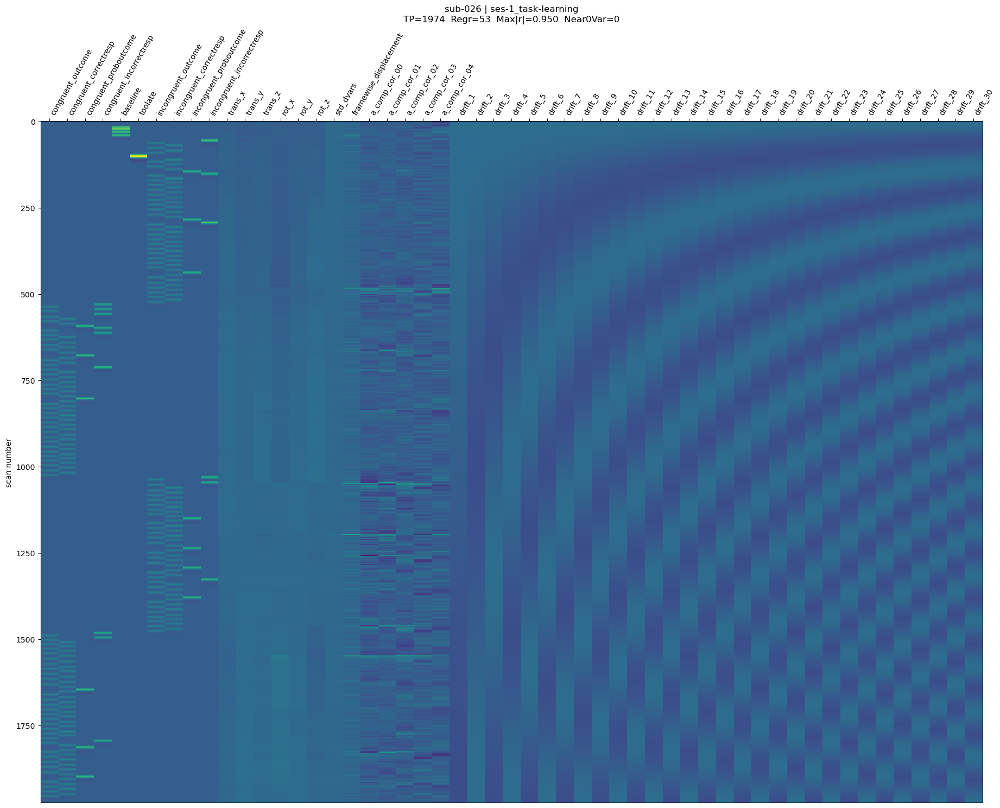

In [8]:
SUB_TO_CHECK = SUBJECTS[20] if SUBJECTS else None
print("SUB_TO_CHECK =", SUB_TO_CHECK)

maps = find_maps_for_subject(OUTPUT_DIR, SUB_TO_CHECK)

# Design matrices
dms = find_design_matrices(OUTPUT_DIR, SUB_TO_CHECK)
print(f"Design matrices found: {len(dms)}")
for label, csv_path, png_path in dms:
    show_design(SUB_TO_CHECK, label, csv_path)

# Contrast maps
#for c in CONTRASTS:
#    plot_contrast_maps(
#        SUB_TO_CHECK, c, maps,
#        z_threshold=Z_THRESHOLD, cut_coords=CUT_COORDS,
#        display_mode=DISPLAY_MODE, bg_img=BG_IMG,
#        ses_for_anat="1"
#    )


# Whole sample (check definitions above to run)

In [8]:
def qc_inventory(output_dir: Path, subjects: list):
    rows = []
    for sub in subjects:
        sub_dir = output_dir / sub
        maps = find_maps_for_subject(output_dir, sub)
        dm = find_design_matrices(output_dir, sub)
        for contrast in CONTRASTS:
            row = {
                "sub": sub,
                "contrast": contrast,
                "has_z": int("z" in maps.get(contrast, {})),
                "has_t": int("t" in maps.get(contrast, {})),
                "has_effect": int("effect" in maps.get(contrast, {})),
                "has_variance": int("variance" in maps.get(contrast, {})),
                "n_design_matrices": len(dm),
                "sub_dir_exists": int(sub_dir.exists()),
            }
            rows.append(row)
    return pd.DataFrame(rows)

inv = qc_inventory(OUTPUT_DIR, SUBJECTS)
inv.head()

print("\nMissing z-maps (by contrast):")
missing = inv[inv["has_z"] == 0].groupby("contrast")["sub"].count().sort_values(ascending=False)
print(missing)

print("\nSubjects with 0 design matrices saved:")
print(inv.groupby("sub")["n_design_matrices"].max().loc[lambda s: s==0])




Missing z-maps (by contrast):
Series([], Name: sub, dtype: int64)

Subjects with 0 design matrices saved:
Series([], Name: n_design_matrices, dtype: int64)


## Uncorrected, set p whole brain map

In [9]:
# --- Display-only contrast label utilities (run before 2nd-level plotting cell) ---

def contrast_display_name(name: str) -> str:
    """Human-friendly contrast label for plots only (does not affect file lookup)."""
    return (name
            .replace("_gt_", " > ")
            .replace("Unaligned", "Incongruent")
            .replace("Aligned", "Congruent"))

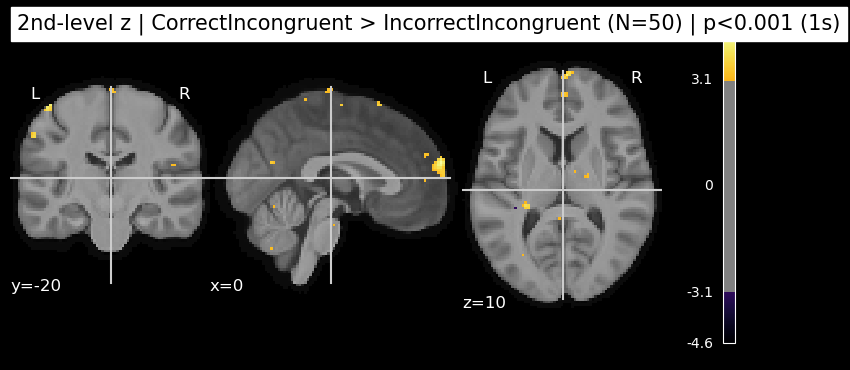

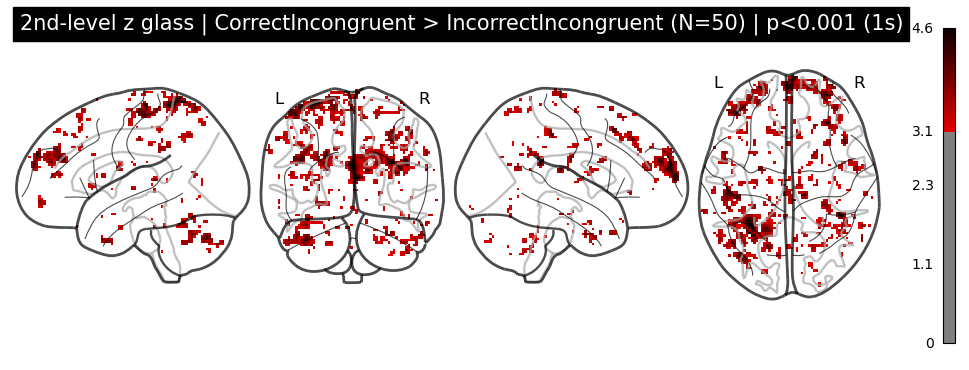

In [10]:
from pathlib import Path
import pandas as pd
from scipy.stats import norm

from nilearn.image import load_img
from nilearn.glm.second_level import SecondLevelModel
from nilearn.plotting import plot_stat_map, plot_glass_brain
import matplotlib.pyplot as plt

MEAN_ANAT = Path("/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/sub_average.nii.gz")
BG_IMG = str(MEAN_ANAT) if MEAN_ANAT.exists() else BG_IMG

def collect_existing_zmaps(output_dir: Path, subjects: list, contrast: str):
    paths = []
    for sub in subjects:
        p = output_dir / sub / f"{sub}_{contrast}_z.nii.gz"
        if p.exists():
            paths.append(str(p))
    return paths

def p_to_z(p, two_sided=True):
    return norm.isf(p / 2.0) if two_sided else norm.isf(p)

P_THR_MAIN  = 0.001
P_THR_GLASS = 0.001
TWO_SIDED = False

Z_THR_MAIN  = p_to_z(P_THR_MAIN,  two_sided=TWO_SIDED)
Z_THR_GLASS = p_to_z(P_THR_GLASS, two_sided=TWO_SIDED)

# --- choose what to run ---
# Option A: run ONE contrast
SELECT_CONTRASTS = ["CorrectUnaligned_gt_IncorrectUnaligned"]   # CorrectUnaligned_gt_IncorrectUnaligned

# Option B: run a subset
# SELECT_CONTRASTS = ["contrast1", "contrast2"]

# Option C: run all (current behavior)
# SELECT_CONTRASTS = CONTRASTS
# --------------------------

for contrast in SELECT_CONTRASTS:
    label = contrast_display_name(contrast)

    paths = collect_existing_zmaps(OUTPUT_DIR, SUBJECTS, contrast)
    if not paths:
        print(f"No z-maps found for contrast={label}")
        continue

    imgs = [load_img(p) for p in paths]
    design_matrix = pd.DataFrame({"intercept": [1] * len(imgs)})

    slm = SecondLevelModel(smoothing_fwhm=None).fit(imgs, design_matrix=design_matrix)
    z_map = slm.compute_contrast(second_level_contrast="intercept", output_type="z_score")

    plot_stat_map(
        z_map, bg_img=BG_IMG, cmap="inferno", threshold=Z_THR_MAIN,
        cut_coords=CUT_COORDS, display_mode=DISPLAY_MODE,
        title=f"2nd-level z | {label} (N={len(imgs)}) | p<{P_THR_MAIN} ({'2s' if TWO_SIDED else '1s'})"
    )
    plot_glass_brain(
        z_map, threshold=Z_THR_GLASS, display_mode="lyrz",
        title=f"2nd-level z glass | {label} (N={len(imgs)}) | p<{P_THR_GLASS} ({'2s' if TWO_SIDED else '1s'})"
    )
    plt.show()

    # Keep filenames based on the original contrast key (unchanged reference naming)
    z_map.to_filename(str(OUTPUT_DIR / f"secondlevel_{contrast}_z.nii.gz"))

## FDR corrected 2nd-level map
Group-level statistical maps thresholded using a cluster-forming voxel-wise threshold of p < 0.01 (uncorrected), and surviving clusters were assessed for significance using cluster-level (topological) FDR correction at q < 0.05, with a minimum cluster extent of 10 voxels. 


Contrast: <function label at 0x14e71496b530> | N=50
Forming threshold (one-sided): voxel p<0.01 => z>2.326
Num + clusters at forming threshold: 559
Largest 10 + cluster sizes: [ 210  228  302  309  330  379  417  822 2712 2940]
Num + clusters with k>=10: 129
Voxels + above forming threshold: 13738
Voxels - below -forming threshold: 252
Cluster-level FDR (per tail): q<0.05
Min cluster extent: k>=10 voxels
Surviving voxels (+): 0
Surviving voxels (-): 0
Surviving voxels (combined): 0


/tmp/ipykernel_537572/3226138267.py:178: UserWarning: empty mask
  plot_stat_map(
/tmp/ipykernel_537572/3226138267.py:185: UserWarning: empty mask
  plot_glass_brain(


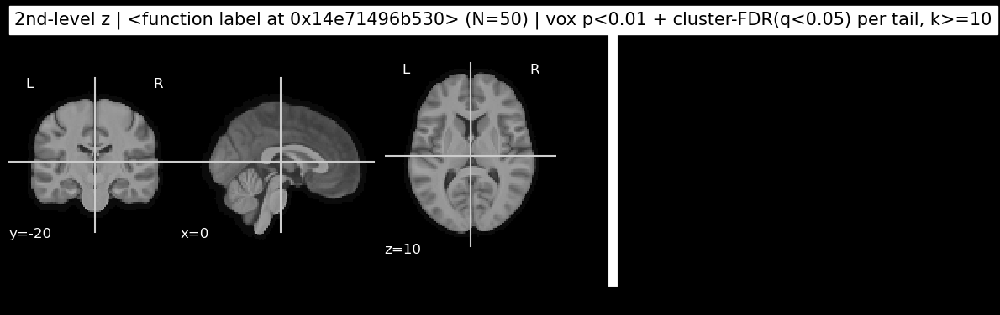

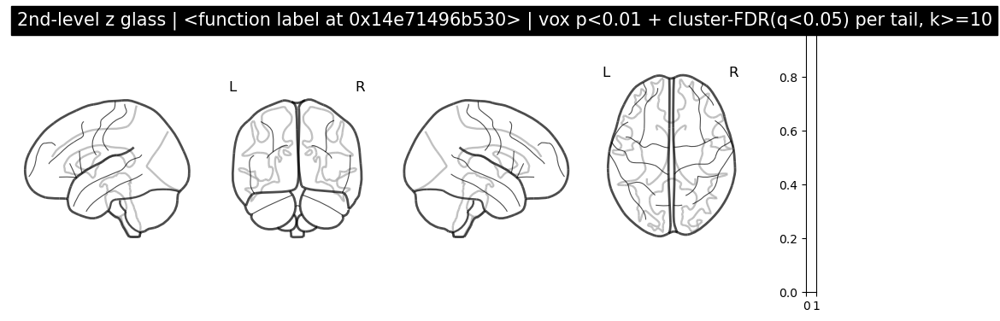

[OK] Wrote: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/secondlevel_CorrectUnaligned_gt_IncorrectUnaligned_z_pos_voxP0.01_clusterFDRq0.05_k10.nii.gz
[OK] Wrote: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/secondlevel_CorrectUnaligned_gt_IncorrectUnaligned_z_neg_voxP0.01_clusterFDRq0.05_k10.nii.gz
[OK] Wrote: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/secondlevel_CorrectUnaligned_gt_IncorrectUnaligned_z_posneg_voxP0.01_clusterFDRq0.05_k10.nii.gz


In [19]:
# This script runs a one-sample (intercept-only) second-level model across subjects’ first-level z-maps
# for each selected contrast, producing a group z-statistic image. It then performs cluster inference
# separately for positive and negative effects using a one-sided voxelwise cluster-forming threshold
# p<0.01 (z>2.326), applies cluster-level FDR (q<0.05) within each tail, and finally removes clusters
# smaller than 10 voxels before plotting and saving the thresholded maps.
#
# Assumes you already ran the separate “run once” cell that defines:
#   contrast_display_name(name: str) -> str
# (used here for plot/print labels only; filenames and data keys remain unchanged)

from pathlib import Path
import numpy as np
import pandas as pd
from scipy.stats import norm

from nilearn.image import load_img, new_img_like
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm import cluster_level_inference
from nilearn.plotting import plot_stat_map, plot_glass_brain
import matplotlib.pyplot as plt

# -----------------------
# Settings
# -----------------------
MEAN_ANAT = Path("/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/sub_average.nii.gz")
BG_IMG = str(MEAN_ANAT) if MEAN_ANAT.exists() else BG_IMG  # keep your fallback behavior

# Inference settings
P_CLUSTER_FORMING = 0.01   # voxelwise, uncorrected (cluster-forming), one-sided
Q_CLUSTER_FDR = 0.05       # cluster-level FDR (applied separately within positive and negative tails)
MIN_CLUSTER_EXTENT = 10    # voxels

# Contrasts to run (must match your filenames: {sub}_{contrast}_z.nii.gz)
SELECT_CONTRASTS = ["CorrectUnaligned_gt_IncorrectUnaligned"]

# -----------------------
# Helpers
# -----------------------
def collect_existing_zmaps(output_dir: Path, subjects: list, contrast: str) -> list[str]:
    paths = []
    for sub in subjects:
        p = output_dir / sub / f"{sub}_{contrast}_z.nii.gz"
        if p.exists():
            paths.append(str(p))
    return paths

def p_to_z_one_sided(p: float) -> float:
    # one-sided: p=0.01 -> z=2.326...
    return float(norm.isf(p))

def apply_min_cluster_extent(thresholded_img, min_k: int, connectivity: int = 1):
    """
    Keep only clusters with size >= min_k voxels in a thresholded statistical image.
    Clusters are defined on |data|>0, but positive and negative clusters are filtered separately
    so signs are preserved.

    connectivity: 1 (faces) or 2 (faces+edges) or 3 (faces+edges+corners) in 3D.
    """
    from scipy.ndimage import label, generate_binary_structure

    data = np.asarray(thresholded_img.get_fdata())
    out = np.zeros_like(data)

    if not np.any(data):
        return new_img_like(thresholded_img, out)

    struct = generate_binary_structure(3, connectivity)

    # positive clusters
    pos = data > 0
    if np.any(pos):
        lab, n = label(pos, structure=struct)
        if n > 0:
            sizes = np.bincount(lab.ravel())
            keep_labels = np.where(sizes >= min_k)[0]
            keep_labels = keep_labels[keep_labels != 0]
            if keep_labels.size:
                keep = np.isin(lab, keep_labels)
                out[keep] = data[keep]

    # negative clusters
    neg = data < 0
    if np.any(neg):
        lab, n = label(neg, structure=struct)
        if n > 0:
            sizes = np.bincount(lab.ravel())
            keep_labels = np.where(sizes >= min_k)[0]
            keep_labels = keep_labels[keep_labels != 0]
            if keep_labels.size:
                keep = np.isin(lab, keep_labels)
                out[keep] = data[keep]

    return new_img_like(thresholded_img, out)

# -----------------------
# Main
# -----------------------
z_thr_forming = p_to_z_one_sided(P_CLUSTER_FORMING)

for contrast in SELECT_CONTRASTS:
    # Display-only label (does NOT affect file lookup/saving)
    label = contrast_display_name(contrast)

    paths = collect_existing_zmaps(OUTPUT_DIR, SUBJECTS, contrast)
    if not paths:
        print(f"No z-maps found for contrast={label}")
        continue

    imgs = [load_img(p) for p in paths]
    design_matrix = pd.DataFrame({"intercept": [1] * len(imgs)})

    slm = SecondLevelModel(smoothing_fwhm=None).fit(imgs, design_matrix=design_matrix)
    z_map = slm.compute_contrast(second_level_contrast="intercept", output_type="z_score")

    zdat = np.asarray(z_map.get_fdata())

    # -----------------------
    # Diagnostics at forming threshold (positive tail)
    # -----------------------
    from scipy.ndimage import label, generate_binary_structure

    supra = (zdat > z_thr_forming)
    struct = generate_binary_structure(3, 1)
    lab, n_clust = label(supra, structure=struct)
    sizes = np.bincount(lab.ravel())[1:]

    print(f"\nContrast: {label} | N={len(imgs)}")
    print(f"Forming threshold (one-sided): voxel p<{P_CLUSTER_FORMING} => z>{z_thr_forming:.3f}")
    print("Num + clusters at forming threshold:", int(n_clust))
    print("Largest 10 + cluster sizes:", np.sort(sizes)[-10:] if sizes.size else sizes)
    print("Num + clusters with k>=10:", int(np.sum(sizes >= 10)))
    print("Voxels + above forming threshold:", int(np.count_nonzero(zdat > z_thr_forming)))
    print("Voxels - below -forming threshold:", int(np.count_nonzero(zdat < -z_thr_forming)))

    # -----------------------
    # Positive tail: cluster-FDR on + clusters
    # -----------------------
    z_map_pos = new_img_like(z_map, np.where(zdat > 0, zdat, 0.0))

    pos_fdr_img = cluster_level_inference(
        stat_img=z_map_pos,
        threshold=z_thr_forming,
        alpha=Q_CLUSTER_FDR
    )
    pos_fdr_k_img = apply_min_cluster_extent(pos_fdr_img, MIN_CLUSTER_EXTENT)

    # -----------------------
    # Negative tail: flip sign, do positive-tail inference, flip back
    # -----------------------
    z_map_negflip = new_img_like(z_map, np.where(zdat < 0, -zdat, 0.0))

    negflip_fdr_img = cluster_level_inference(
        stat_img=z_map_negflip,
        threshold=z_thr_forming,
        alpha=Q_CLUSTER_FDR
    )
    negflip_fdr_k_img = apply_min_cluster_extent(negflip_fdr_img, MIN_CLUSTER_EXTENT)

    neg_fdr_k_img = new_img_like(z_map, -np.asarray(negflip_fdr_k_img.get_fdata()))

    # Combine (positive + negative) into one signed map
    combined_data = np.asarray(pos_fdr_k_img.get_fdata()) + np.asarray(neg_fdr_k_img.get_fdata())
    combined_img = new_img_like(z_map, combined_data)

    n_pos = int(np.count_nonzero(np.asarray(pos_fdr_k_img.get_fdata()) != 0))
    n_neg = int(np.count_nonzero(np.asarray(neg_fdr_k_img.get_fdata()) != 0))
    n_combined = int(np.count_nonzero(np.asarray(combined_img.get_fdata()) != 0))

    print(f"Cluster-level FDR (per tail): q<{Q_CLUSTER_FDR}")
    print(f"Min cluster extent: k>={MIN_CLUSTER_EXTENT} voxels")
    print(f"Surviving voxels (+): {n_pos}")
    print(f"Surviving voxels (-): {n_neg}")
    print(f"Surviving voxels (combined): {n_combined}")

    # -----------------------
    # Plots
    # -----------------------
    plot_stat_map(
        combined_img, bg_img=BG_IMG, cmap="cold_hot",
        threshold=0,
        cut_coords=CUT_COORDS, display_mode=DISPLAY_MODE,
        title=(f"2nd-level z | {label} (N={len(imgs)}) | "
               f"vox p<{P_CLUSTER_FORMING} + cluster-FDR(q<{Q_CLUSTER_FDR}) per tail, k>={MIN_CLUSTER_EXTENT}")
    )
    plot_glass_brain(
        combined_img, threshold=0, display_mode="lyrz",
        title=(f"2nd-level z glass | {label} | "
               f"vox p<{P_CLUSTER_FORMING} + cluster-FDR(q<{Q_CLUSTER_FDR}) per tail, k>={MIN_CLUSTER_EXTENT}")
    )
    plt.show()

    # -----------------------
    # Save outputs (keep original contrast key in filenames)
    # -----------------------
    out_pos = OUTPUT_DIR / f"secondlevel_{contrast}_z_pos_voxP{P_CLUSTER_FORMING}_clusterFDRq{Q_CLUSTER_FDR}_k{MIN_CLUSTER_EXTENT}.nii.gz"
    out_neg = OUTPUT_DIR / f"secondlevel_{contrast}_z_neg_voxP{P_CLUSTER_FORMING}_clusterFDRq{Q_CLUSTER_FDR}_k{MIN_CLUSTER_EXTENT}.nii.gz"
    out_comb = OUTPUT_DIR / f"secondlevel_{contrast}_z_posneg_voxP{P_CLUSTER_FORMING}_clusterFDRq{Q_CLUSTER_FDR}_k{MIN_CLUSTER_EXTENT}.nii.gz"

    pos_fdr_k_img.to_filename(str(out_pos))
    neg_fdr_k_img.to_filename(str(out_neg))
    combined_img.to_filename(str(out_comb))

    print(f"[OK] Wrote: {out_pos}")
    print(f"[OK] Wrote: {out_neg}")
    print(f"[OK] Wrote: {out_comb}")

### Concetate into 4D image

In [34]:
import os
from pathlib import Path
import numpy as np
import nibabel as nib
from nilearn.image import load_img, concat_imgs
from nilearn import plotting

# -----------------------------
# Build a 4D image by concatenating 1st-level "Value" contrast maps (one per subject)
# so you can extract ROI means per subject with your NiftiMasker code.
# -----------------------------

# Set these to match your filenames
firstlevel_dir = Path(OUTPUT_DIR)
contrast_name = "CorrectAligned"                                      
# Example expected file per subject:
#   <firstlevel_dir>/<sub>/<sub>_Value_con.nii.gz
# or adjust pattern below to match your pipeline.

def collect_firstlevel_contrasts(firstlevel_dir: Path, subjects: list, contrast: str):
    paths = []
    missing = []
    for sub in subjects:
        p = firstlevel_dir / sub / f"{sub}_{contrast}_effect.nii.gz"
        if p.exists():
            paths.append(str(p))
        else:
            missing.append(str(p))
    return paths, missing

# Collect subject maps
con_paths, missing = collect_firstlevel_contrasts(firstlevel_dir, SUBJECTS, contrast_name)

print(f"Found {len(con_paths)} subject maps for {contrast_name}")
if missing:
    print("Missing (showing up to 10):")
    for m in missing[:10]:
        print("  ", m)

if len(con_paths) == 0:
    raise RuntimeError("No first-level contrast maps found; fix firstlevel_dir/pattern/contrast_name.")

# Concatenate into a single 4D image: (X, Y, Z, Nsubjects)
con_imgs_4d = concat_imgs(con_paths)

# Save the 4D image for downstream ROI extraction/plotting
out_4d_path = Path(OUTPUT_DIR) / f"none_glm_{contrast_name}_all_sub_4d.nii.gz"
out_4d_path.parent.mkdir(parents=True, exist_ok=True)
con_imgs_4d.to_filename(str(out_4d_path))
print(f"Saved 4D concatenated image to: {out_4d_path}")


# Now point your extraction code at:
functional_img_path = str(out_4d_path)
print("Use this as functional_img_path:", functional_img_path)

Found 50 subject maps for CorrectAligned
Saved 4D concatenated image to: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/none_glm_CorrectAligned_all_sub_4d.nii.gz
Use this as functional_img_path: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/none_glm_CorrectAligned_all_sub_4d.nii.gz


### Back to ROI!

/tmp/ipykernel_1274833/4010350254.py:4: DeprecationWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  from nilearn import input_data, plotting


Mean ROI Signal across all subjects: 0.06 ± 0.07


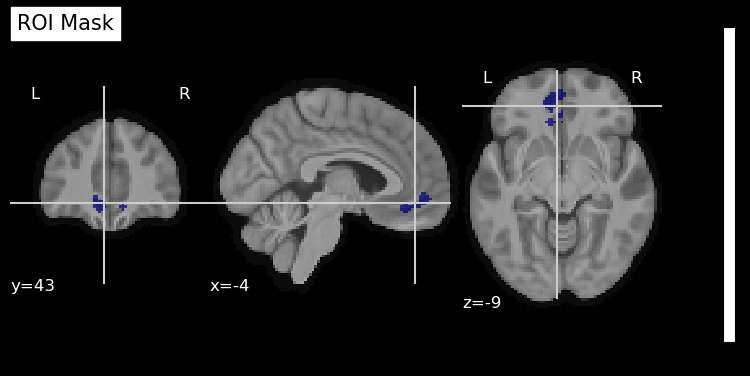

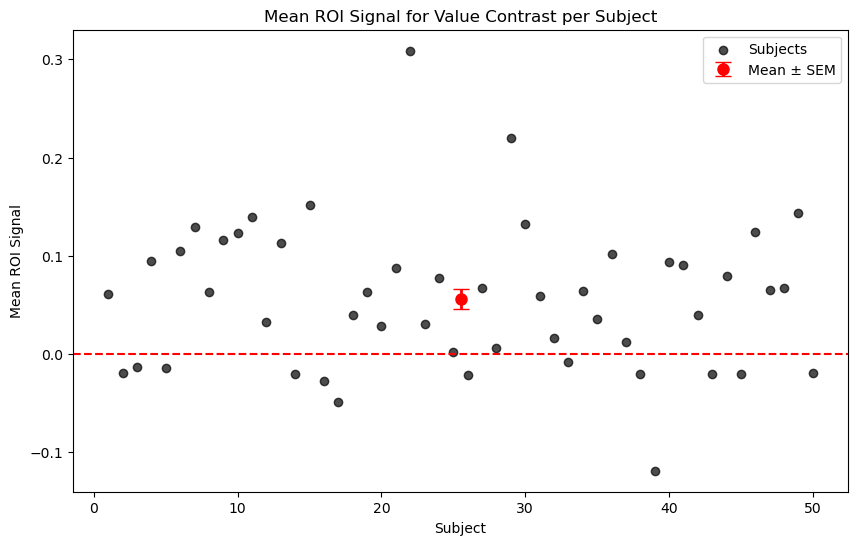

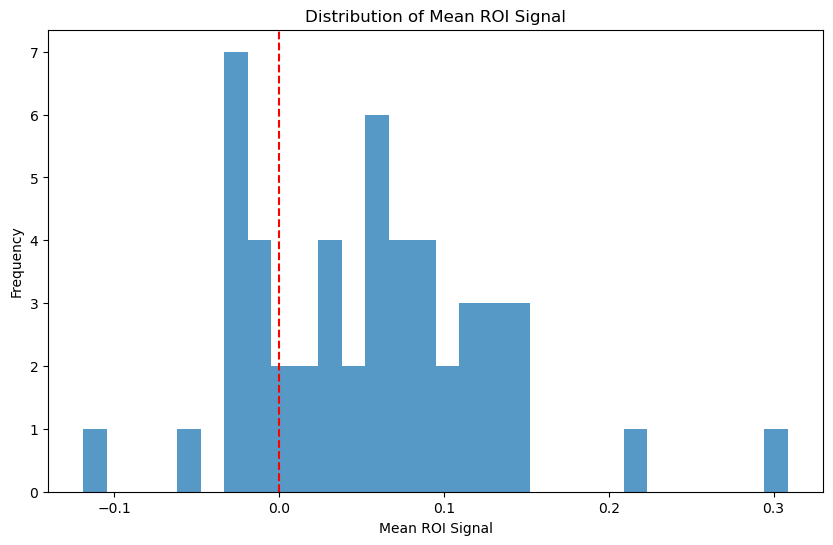

In [13]:
import os
import numpy as np
import nibabel as nib
from nilearn import input_data, plotting
from scipy import stats
import matplotlib.pyplot as plt

# Define paths
functional_img_path = os.path.join(OUTPUT_DIR, 'none_glm_CorrectUnaligned_gt_IncorrectUnaligned_all_sub_4d.nii.gz')
roi_mask_path = os.path.join(OUTPUT_DIR, 'ROI', 'roi_10_uncorrected.nii.gz')

# Load the functional and ROI mask images
functional_img = nib.load(functional_img_path)
roi_mask_img = nib.load(roi_mask_path)

# Visualize the ROI on top of anatomical mean image (for verification)
plotting.plot_roi(roi_mask_img, MEAN_ANAT, title='ROI Mask')

# Initialize the NiftiMasker for ROI mask
nifti_masker = input_data.NiftiMasker(mask_img=roi_mask_img)
nifti_masker.fit()

# Extract the time series within the ROI (for each subject in the 4D image)
time_series = nifti_masker.transform(functional_img)

# time_series is of shape (n_subjects, n_voxels)
# Compute mean signal within the ROI for each subject
mean_signal_per_subject = time_series.mean(axis=1)

# Calculate the mean and standard deviation of the mean ROI signal across all subjects
mean_signal = np.mean(mean_signal_per_subject)
std_signal = np.std(mean_signal_per_subject)

# Print the mean and standard deviation
print(f"Mean ROI Signal across all subjects: {mean_signal:.2f} ± {std_signal:.2f}")

# Plotting individual subject points without connecting lines,
# plus group mean and error bar
plt.figure(figsize=(10, 6))

x_subjects = np.arange(1, len(mean_signal_per_subject) + 1)

# Individual subject points
plt.scatter(
    x_subjects,
    mean_signal_per_subject,
    color='black',
    alpha=0.7,
    label='Subjects'
)

# Mean and SEM
group_mean = np.mean(mean_signal_per_subject)
group_sem = stats.sem(mean_signal_per_subject)

# Plot mean as a red point with vertical error bar
plt.errorbar(
    x=np.mean(x_subjects),
    y=group_mean,
    yerr=group_sem,
    fmt='o',
    color='red',
    ecolor='red',
    elinewidth=2,
    capsize=6,
    markersize=8,
    label='Mean ± SEM'
)

plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Subject')
plt.ylabel('Mean ROI Signal')
plt.title('Mean ROI Signal for Value Contrast per Subject')
plt.legend()
plt.show()

# Plot distribution of the mean signal per subject
plt.figure(figsize=(10, 6))
plt.hist(mean_signal_per_subject, bins=30, alpha=0.75)
plt.axvline(x=0, color='r', linestyle='--')
plt.xlabel('Mean ROI Signal')
plt.ylabel('Frequency')
plt.title('Distribution of Mean ROI Signal')
plt.show()

### Neurosynth overlap

Loading images...
  ROI   shape : (97, 115, 97)  | voxel size: (np.float32(2.0), np.float32(2.0), np.float32(2.0))
  Atlas shape : (91, 109, 91) | voxel size: (np.float32(2.0), np.float32(2.0), np.float32(2.0))
Shapes / affines differ — resampling ROI to atlas space.
  Resampling ROI to atlas space...

ROI–Atlas Overlap Report
ROI file   : /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_parametric/ROI/roi_41_uncorrected.nii.gz
Atlas file : /nfs/roberts/pi/pi_il77/shared/Neurosynth Parcellation_0.nii.gz
Total ROI voxels       : 463
Overlapping ROI voxels : 463

File value   Region name                                  Voxels   % of ROI
---------------------------------------------------------------------------
33           vmPFC                                           446     96.33%
3            DMPFC                                            17      3.67%

Report saved → /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_parametric/ROI/roi_41_atlas_overlap_report.

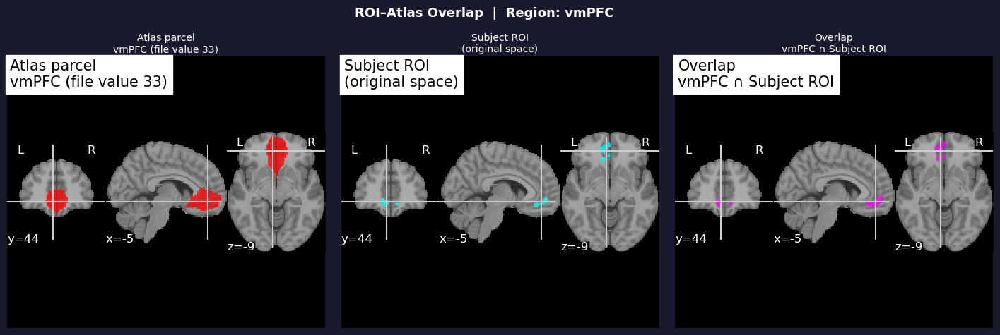

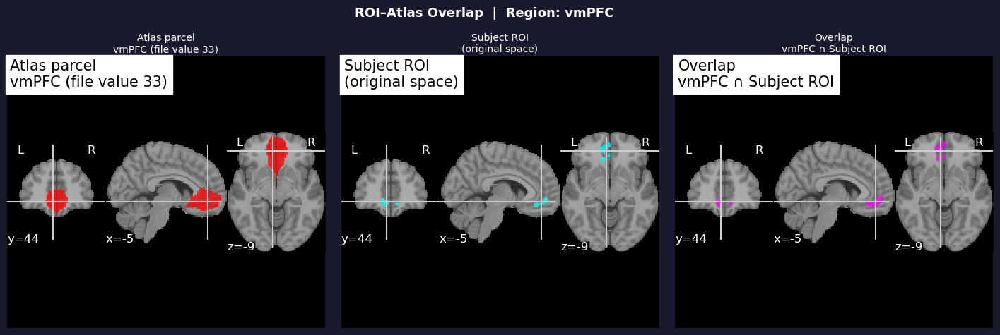

In [15]:
"""
ROI-Atlas Overlap Script v2
============================
Finds overlap between a subject ROI and the Neurosynth parcellation atlas,
identifies the named region, saves a labeled overlap NIfTI, and plots
the subject ROI alongside the full atlas parcel side by side.

Dependencies: nibabel, numpy, nilearn
Install: pip install nibabel numpy nilearn
"""

import os
import numpy as np
import nibabel as nib
from nilearn.image import resample_to_img
from nilearn import plotting

# ── Paths ─────────────────────────────────────────────────────────────────────
ROI_PATH = os.path.join(OUTPUT_DIR, 'ROI', 'roi_41_uncorrected.nii.gz')

ATLAS_PATH = "/nfs/roberts/pi/pi_il77/shared/Neurosynth Parcellation_0.nii.gz"

# Anatomical background for plots (set to None to use MNI152 template)
ANAT_PATH = None  # e.g. "/path/to/mean_epi.nii.gz"

OUT_DIR    = os.path.dirname(ROI_PATH)
OUT_NII    = os.path.join(OUT_DIR, 'roi_41_atlas_overlap.nii.gz')
OUT_REPORT = os.path.join(OUT_DIR, 'roi_41_atlas_overlap_report.txt')
OUT_PLOT   = os.path.join(OUT_DIR, 'roi_41_atlas_overlap_plot.png')

# ── Neurosynth parcellation label mapping ─────────────────────────────────────
# Keys are the raw file values (label_id + 1 in the 0-based convention).
REGION_LABELS = {
    1:  "Anterior MPFC",
    2:  "Fusiform/Parahippocampus",
    3:  "DMPFC",
    4:  "Sensorimotor/Postcentral Gyrus",
    5:  "V1",
    6:  "TPJ Posterior SMG/Angular Gyrus",
    7:  "PCC/Precuneus",
    8:  "Thalamus",
    9:  "SMA",
    10: "Precentral Gyrus",
    11: "Cerebellum (VI)",
    12: "Temporal Occipital Fusiform",
    13: "Amygdala",
    14: "Superior Temporal Gyrus",
    15: "White Matter",
    16: "TPJ Anterior SMG/Parietal Operculum",
    17: "Mid Insula",
    18: "Putamen",
    19: "Dorsal Anterior Insula",
    20: "PCC/Superior LOC",
    21: "Lateral Occipital/Temporal Occipital (V2)",
    23: "dACC",
    24: "Anterior Fronto-Parietal (DLPFC, dACC)",
    25: "Intracalcarine Cortex",
    26: "Anterior VLPFC",
    28: "Left IFG",
    29: "Hippocampus",
    30: "Dorsal Caudate",
    31: "Unknown",
    33: "vmPFC",
    35: "NAcc",
    36: "Primary Auditory",
    38: "Ventral Anterior Insula",
    40: "Superior LOC",
    43: "Cerebellum (Crus)",
    45: "DLPFC",
    46: "Right IFG/VLPFC",
    47: "Inferior LOC",
    50: "STS",
}

# ── Helpers ───────────────────────────────────────────────────────────────────

def get_region_name(file_value):
    """Return human-readable label for a raw atlas file value."""
    return REGION_LABELS.get(int(file_value), f"Region_{int(file_value)}")


def resample_roi_to_atlas(roi_img, atlas_img):
    """Resample ROI to atlas space using nearest-neighbour interpolation."""
    print("  Resampling ROI to atlas space...")
    return resample_to_img(
        roi_img, atlas_img,
        interpolation='nearest',
        force_resample=True,
        copy_header=True,
    )


def make_atlas_parcel_mask(atlas_img, file_value):
    """Return a binary NIfTI of a single atlas parcel (by raw file value)."""
    data = np.round(atlas_img.get_fdata()).astype(np.int32)
    mask = (data == int(file_value)).astype(np.int8)
    return nib.Nifti1Image(mask, atlas_img.affine, atlas_img.header)


def get_roi_centroid_mni(roi_img):
    """Return the MNI centroid of a binary (non-zero) ROI image."""
    data = roi_img.get_fdata()
    voxels = np.argwhere(data != 0)
    if voxels.size == 0:
        return None
    centroid_vox = voxels.mean(axis=0)
    return nib.affines.apply_affine(roi_img.affine, centroid_vox)


def plot_side_by_side(roi_img, parcel_img, subject_roi_img,
                      region_name, file_value, cut_coords, anat):
    """
    Three-panel figure:
      Left  — full atlas parcel
      Centre — subject ROI (in atlas space)
      Right  — overlap (parcel mask * subject ROI)
    """
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec

    # Build overlap mask: voxels that are in BOTH the parcel and the subject ROI
    parcel_data  = parcel_img.get_fdata()
    subject_data = roi_img.get_fdata()   # already in atlas space
    overlap_data = ((parcel_data > 0) & (subject_data != 0)).astype(np.int8)
    overlap_img  = nib.Nifti1Image(overlap_data, parcel_img.affine)

    fig = plt.figure(figsize=(18, 5))
    fig.patch.set_facecolor('#1a1a2e')
    gs  = gridspec.GridSpec(1, 3, figure=fig, wspace=0.05)

    panels = [
        (gs[0], parcel_img,   f"Atlas parcel\n{region_name} (file value {file_value})", "autumn"),
        (gs[1], subject_roi_img, "Subject ROI\n(original space)",                       "cool"),
        (gs[2], overlap_img,  f"Overlap\n{region_name} ∩ Subject ROI",                  "spring"),
    ]

    for spec, img, title, cmap in panels:
        ax = fig.add_subplot(spec)
        display = plotting.plot_roi(
            img,
            bg_img=anat,
            display_mode='ortho',
            cut_coords=cut_coords,
            cmap=cmap,
            alpha=0.75,
            title=title,
            axes=ax,
            colorbar=False,
        )
        # Style the title
        ax.set_title(title, color='white', fontsize=10, pad=4)

    plt.suptitle(
        f"ROI–Atlas Overlap  |  Region: {region_name}",
        color='white', fontsize=13, fontweight='bold', y=1.02
    )
    return fig


# ── Main ──────────────────────────────────────────────────────────────────────

def main():
    print("Loading images...")
    roi_img   = nib.load(ROI_PATH)
    atlas_img = nib.load(ATLAS_PATH)

    print(f"  ROI   shape : {roi_img.shape}  | voxel size: {roi_img.header.get_zooms()}")
    print(f"  Atlas shape : {atlas_img.shape} | voxel size: {atlas_img.header.get_zooms()}")

    # Keep the original subject ROI for plotting in its own space
    subject_roi_img = roi_img

    # ── Align to atlas space ──────────────────────────────────────────────────
    if roi_img.shape != atlas_img.shape or not np.allclose(
            roi_img.affine, atlas_img.affine, atol=1e-3):
        print("Shapes / affines differ — resampling ROI to atlas space.")
        roi_img_r = resample_roi_to_atlas(roi_img, atlas_img)
        roi_data  = roi_img_r.get_fdata()
    else:
        print("Shapes match — no resampling needed.")
        roi_img_r = roi_img
        roi_data  = roi_img.get_fdata()

    # Use rounded integer atlas data to avoid float comparison issues
    atlas_data = np.round(atlas_img.get_fdata()).astype(np.int32)

    # ── Find overlapping atlas regions ───────────────────────────────────────
    roi_mask            = roi_data != 0
    overlap_atlas_vals  = atlas_data[roi_mask]
    overlap_atlas_vals  = overlap_atlas_vals[overlap_atlas_vals != 0]

    if overlap_atlas_vals.size == 0:
        print("\n⚠  No overlap found between the ROI and any atlas region.")
        return

    unique_regions, counts = np.unique(overlap_atlas_vals, return_counts=True)

    # ── Report ────────────────────────────────────────────────────────────────
    total_roi_vox = int(roi_mask.sum())
    lines = []
    lines.append("=" * 65)
    lines.append("ROI–Atlas Overlap Report")
    lines.append("=" * 65)
    lines.append(f"ROI file   : {ROI_PATH}")
    lines.append(f"Atlas file : {ATLAS_PATH}")
    lines.append(f"Total ROI voxels       : {total_roi_vox}")
    lines.append(f"Overlapping ROI voxels : {int(overlap_atlas_vals.size)}")
    lines.append("")
    lines.append(f"{'File value':<12} {'Region name':<42} {'Voxels':>8}  {'% of ROI':>9}")
    lines.append("-" * 75)

    for fv, cnt in sorted(zip(unique_regions, counts), key=lambda x: -x[1]):
        name = get_region_name(fv)
        pct  = 100.0 * cnt / total_roi_vox
        lines.append(f"{int(fv):<12} {name:<42} {int(cnt):>8}  {pct:>8.2f}%")

    lines.append("=" * 65)
    report_text = "\n".join(lines)
    print("\n" + report_text)

    with open(OUT_REPORT, 'w') as f:
        f.write(report_text + "\n")
    print(f"\nReport saved → {OUT_REPORT}")

    # ── Save overlap NIfTI ────────────────────────────────────────────────────
    overlap_vol = np.zeros(atlas_data.shape, dtype=np.int32)
    overlap_vol[roi_mask] = atlas_data[roi_mask]

    region_summary = ", ".join(get_region_name(fv) for fv in unique_regions)
    overlap_img    = nib.Nifti1Image(overlap_vol, atlas_img.affine, atlas_img.header)
    overlap_img.header['descrip'] = f"Overlap: {region_summary}"[:79].encode()

    nib.save(overlap_img, OUT_NII)
    print(f"Overlap NIfTI saved → {OUT_NII}")
    print(f"  Regions: {region_summary}")

    # ── Visualisation ─────────────────────────────────────────────────────────
    # Use the centroid of the subject ROI as the cut-coord anchor
    centroid = get_roi_centroid_mni(subject_roi_img)
    if centroid is None:
        centroid = (0, 0, 0)
    cut_coords = tuple(centroid.round(0).astype(int))
    print(f"\nPlotting with cut_coords (MNI): {cut_coords}")

    # Background: use provided anat, or fall back to MNI152 template
    if ANAT_PATH and os.path.isfile(ANAT_PATH):
        anat = nib.load(ANAT_PATH)
    else:
        from nilearn.datasets import load_mni152_template
        anat = load_mni152_template(resolution=2)

    # Dominant overlapping parcel (most voxels)
    dominant_fv   = unique_regions[np.argmax(counts)]
    dominant_name = get_region_name(dominant_fv)
    parcel_img    = make_atlas_parcel_mask(atlas_img, dominant_fv)

    fig = plot_side_by_side(
        roi_img_r,         # subject ROI in atlas space (for overlap calc)
        parcel_img,        # full atlas parcel
        subject_roi_img,   # original subject ROI (for middle panel)
        dominant_name,
        int(dominant_fv),
        cut_coords,
        anat,
    )

    fig.savefig(OUT_PLOT, dpi=150, bbox_inches='tight',
                facecolor='#1a1a2e')
    print(f"Plot saved → {OUT_PLOT}")

    # Also display inline if running in a notebook
    try:
        get_ipython  # noqa: F821
        from IPython.display import display
        display(fig)
    except NameError:
        import matplotlib.pyplot as plt
        plt.show()


if __name__ == "__main__":
    main()

### Making Spherical ROI of X mm radius given above findings

Number of voxels in spherical ROI mask: 231
T-statistic: 3.683072034499267
P-value: 0.0005748085355987661


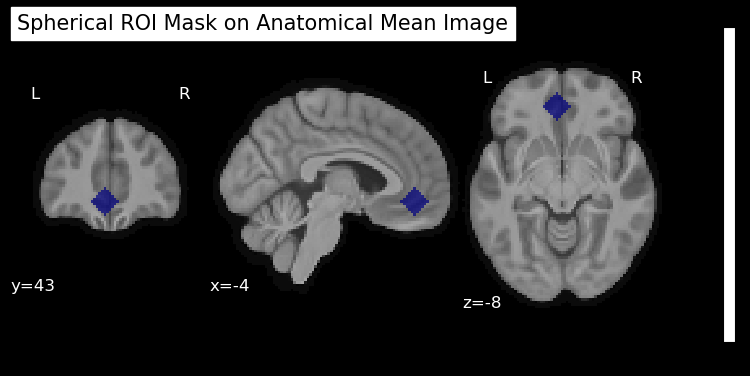

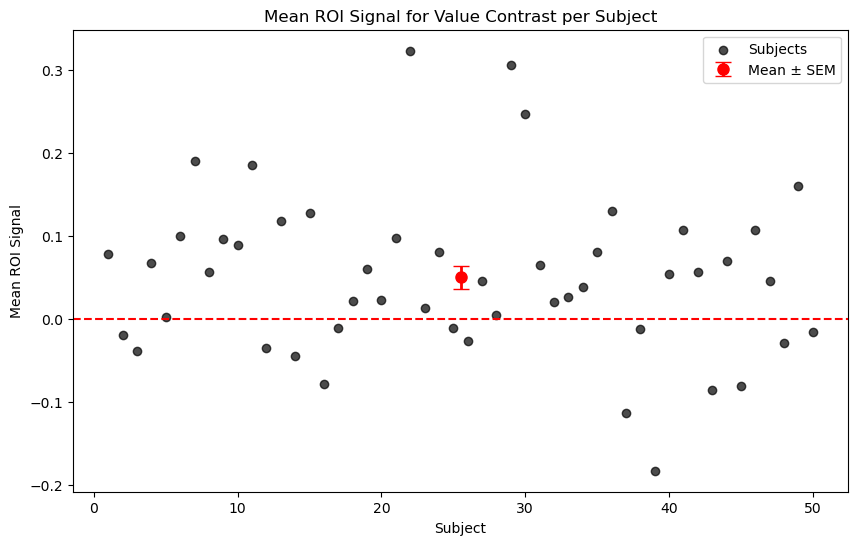

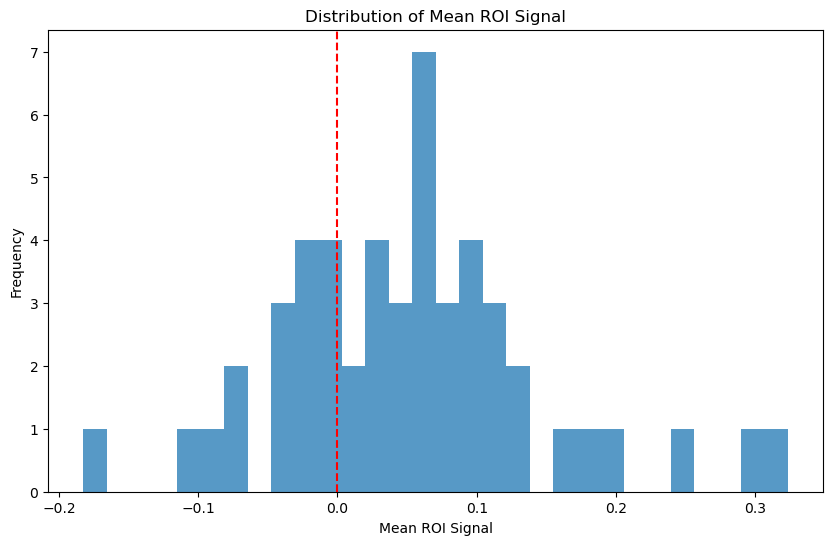

Saved ROI mask to: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_parametric/ROI/sphere_r5mm_x-4_y43_z-9_mask.nii.gz


In [26]:
import os
import numpy as np
import nibabel as nib
from nilearn import input_data, plotting, image, masking
from nilearn.image import math_img
from scipy.ndimage import binary_dilation, generate_binary_structure
from scipy import stats
import matplotlib.pyplot as plt

# Define paths
functional_img_path = os.path.join(OUTPUT_DIR, 'none_glm_CorrectUnaligned_gt_IncorrectUnaligned_all_sub_4d.nii.gz')
anat_img = load_img(str(MEAN_ANAT))

# Load the functional image
functional_img = nib.load(functional_img_path)

# Define the coordinates and radius for the spherical ROI
coords = (-4, 43, -9)  # (x, y, z) MNI coordinates in mm (from ROI 41!!)
radius = 5  # Radius for the sphere in mm

# Create a binary structure for 3D binary dilation
binary_structure = generate_binary_structure(3, 1)

# Function to create spherical mask
def create_spherical_mask(coords, radius, reference_img):
    center_voxel = np.round(nib.affines.apply_affine(np.linalg.inv(reference_img.affine), coords)).astype(int)
    mask_data = np.zeros(reference_img.shape, dtype=bool)
    mask_data[tuple(center_voxel)] = True
    dilated_mask = binary_dilation(mask_data, structure=binary_structure, iterations=radius)
    return nib.Nifti1Image(dilated_mask.astype(np.int32), affine=reference_img.affine)

# Create the spherical ROI mask
spherical_roi_mask = create_spherical_mask(coords, radius, anat_img)
print(f'Number of voxels in spherical ROI mask: {np.sum(spherical_roi_mask.get_fdata() > 0)}')

# Visualize the spherical ROI on the anatomical mean image
plotting.plot_roi(spherical_roi_mask, anat_img, title='Spherical ROI Mask on Anatomical Mean Image', display_mode='ortho', draw_cross=False)

# Initialize the NiftiMasker for the spherical ROI mask
nifti_masker = input_data.NiftiMasker(mask_img=spherical_roi_mask)
nifti_masker.fit()

# Extract the time series within the ROI (for each subject in the 4D image)
time_series = nifti_masker.transform(functional_img)

# time_series is of shape (n_subjects, n_voxels)
# Compute mean signal within the ROI for each subject
mean_signal_per_subject = time_series.mean(axis=1)

# Assuming that the 4D image represents a contrast (Liked > Disliked)

# Here, we will perform a one-sample t-test on the contrast values (against the null hypothesis that the contrast is zero).

# Perform one-sample t-test
t_statistic, p_value = stats.ttest_1samp(mean_signal_per_subject, 0)

# Print results
print(f'T-statistic: {t_statistic}')
print(f'P-value: {p_value}')

# Plotting individual subject points without connecting lines,
# plus group mean and error bar
plt.figure(figsize=(10, 6))

x_subjects = np.arange(1, len(mean_signal_per_subject) + 1)

# Individual subject points
plt.scatter(
    x_subjects,
    mean_signal_per_subject,
    color='black',
    alpha=0.7,
    label='Subjects'
)

# Mean and SEM
group_mean = np.mean(mean_signal_per_subject)
group_sem = stats.sem(mean_signal_per_subject)

# Plot mean as a red point with vertical error bar
plt.errorbar(
    x=np.mean(x_subjects),
    y=group_mean,
    yerr=group_sem,
    fmt='o',
    color='red',
    ecolor='red',
    elinewidth=2,
    capsize=6,
    markersize=8,
    label='Mean ± SEM'
)

plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Subject')
plt.ylabel('Mean ROI Signal')
plt.title('Mean ROI Signal for Value Contrast per Subject')
plt.legend()
plt.show()

# Plot distribution of the mean signal per subject
plt.figure(figsize=(10, 6))
plt.hist(mean_signal_per_subject, bins=30, alpha=0.75)
plt.axvline(x=0, color='r', linestyle='--')
plt.xlabel('Mean ROI Signal')
plt.ylabel('Frequency')
plt.title('Distribution of Mean ROI Signal')
plt.show()

# --- save ROI mask ---
roi_out_dir = os.path.join(OUTPUT_DIR, "ROI")
os.makedirs(roi_out_dir, exist_ok=True)

roi_mask_path = os.path.join(
    roi_out_dir,
    f"sphere_r{radius}mm_x{coords[0]}_y{coords[1]}_z{coords[2]}_mask.nii.gz"
)

nib.save(spherical_roi_mask, roi_mask_path)
print(f"Saved ROI mask to: {roi_mask_path}")

## From atlas

In [11]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import plotting, image

atlas_path = "/nfs/roberts/pi/pi_il77/shared/Neurosynth Parcellation_0.nii.gz"

# Load the image
img = nib.load(atlas_path)
print(f"Shape: {img.shape}")
print(f"Affine:\n{img.affine}")
data = img.get_fdata()
print(f"Unique parcels: {len(np.unique(data))} (including background 0)")
print(f"Parcel range: {int(data.min())} - {int(data.max())}")

Shape: (91, 109, 91)
Affine:
[[  -2.    0.    0.   90.]
 [   0.    2.    0. -126.]
 [   0.    0.    2.  -72.]
 [   0.    0.    0.    1.]]
Unique parcels: 51 (including background 0)
Parcel range: 0 - 49


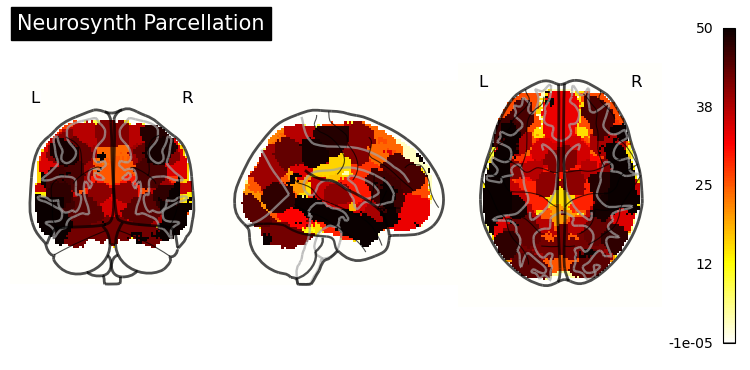

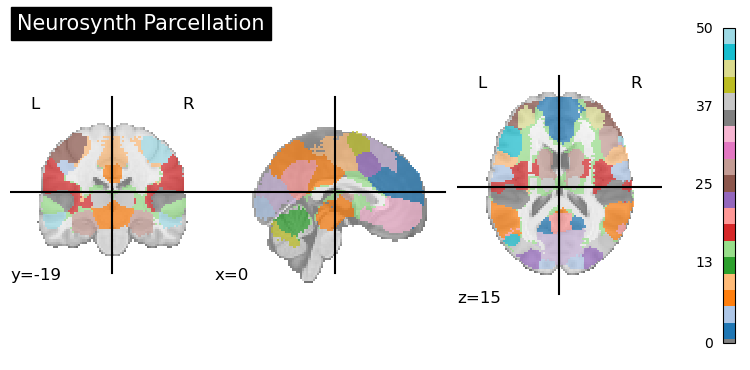

/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/numpy/_core/fromnumeric.py:867: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



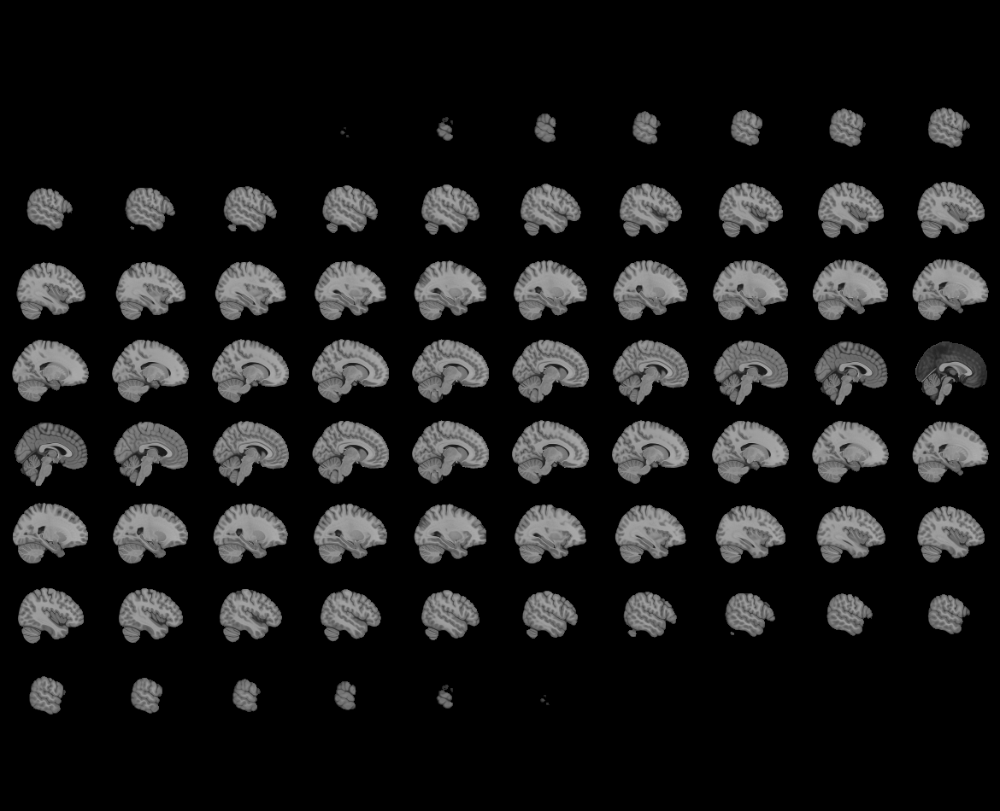
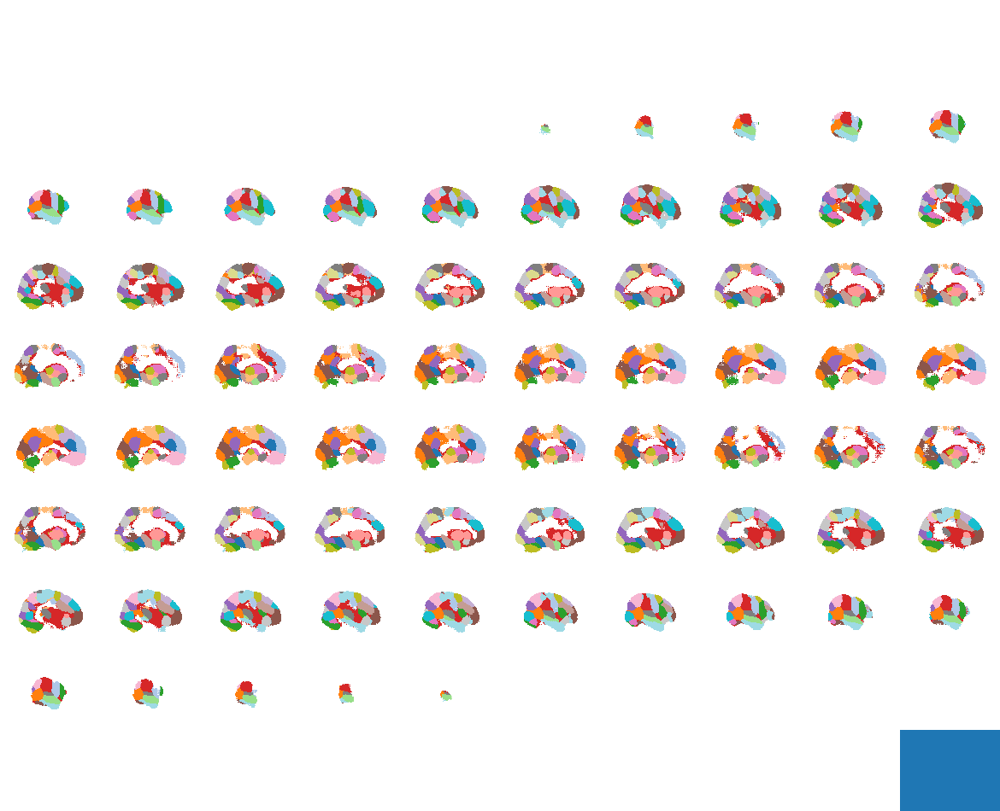

In [12]:
from nilearn import plotting

# Glass brain overview
plotting.plot_glass_brain(atlas_path, title="Neurosynth Parcellation", colorbar=True)
plt.show()

# Ortho slices (axial/coronal/sagittal)
plotting.plot_roi(atlas_path, title="Neurosynth Parcellation", colorbar=True,
                  cmap="tab20", alpha=0.7)
plt.show()

# Just use `view` directly as the last line of the cell — no .open_in_browser()
from nilearn import plotting

view = plotting.view_img(atlas_path, cmap="tab20", symmetric_cmap=False,
                         title="Neurosynth Parcellation")
view  # renders the interactive viewer inline in the notebook cell

In [13]:
# Corrected: file_value = your_label_id + 1
region_labels = {
    1:  "Anterior MPFC",
    2:  "Fusiform/Parahippocampus",
    3:  "DMPFC",
    4:  "Sensorimotor/Postcentral Gyrus",
    5:  "V1",
    6:  "TPJ Posterior SMG/Angular Gyrus",
    7:  "PCC/Precuneus",
    8:  "Thalamus",
    9:  "SMA",
    10: "Precentral Gyrus",
    11: "Cerebellum (VI)",
    12: "Temporal Occipital Fusiform",
    13: "Amygdala",
    14: "Superior Temporal Gyrus",
    15: "White Matter",
    16: "TPJ Anterior SMG/Parietal Operculum",
    17: "Mid Insula",
    18: "Putamen",
    19: "Dorsal Anterior Insula",
    20: "PCC/Superior LOC",
    21: "Lateral Occipital/Temporal Occipital (V2)",
    23: "dACC",
    24: "Anterior Fronto-Parietal (DLPFC, dACC)",
    25: "Intracalcarine Cortex",
    26: "Anterior VLPFC",
    28: "Left IFG",
    29: "Hippocampus",
    30: "Dorsal Caudate",
    31: "Unknown",
    33: "vmPFC",
    35: "NAcc",
    36: "Primary Auditory",
    38: "Ventral Anterior Insula",
    40: "Superior LOC",
    43: "Cerebellum (Crus)",
    45: "DLPFC",
    46: "Right IFG/VLPFC",
    47: "Inferior LOC",
    50: "STS"
}

# Updated frontal regions (file values)
frontal_regions = {
    1:  "Anterior MPFC",
    3:  "DMPFC",
    9:  "SMA",
    10: "Precentral Gyrus",
    23: "dACC",
    24: "Anterior Fronto-Parietal (DLPFC, dACC)",
    26: "Anterior VLPFC",
    28: "Left IFG",
    33: "vmPFC",
    45: "DLPFC",
    46: "Right IFG/VLPFC",
}

Region: Left IFG | file_value=28 | voxels=2217


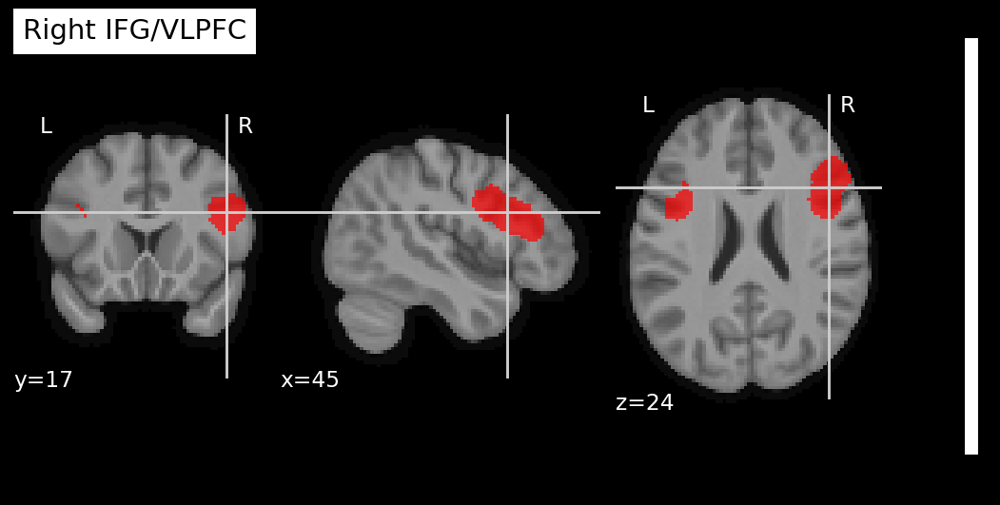

In [25]:
# Mask function
anat_img = load_img(str(MEAN_ANAT))

def make_parcel_mask(atlas_path, label_id):
    """label_id = your original 0-based label number"""
    img = nib.load(atlas_path)
    data = np.round(img.get_fdata()).astype(int)
    file_value = label_id + 1  # offset correction
    mask = (data == file_value).astype(np.int8)
    print(f"Region: {region_labels.get(file_value, 'Unknown')} | file_value={file_value} | voxels={mask.sum()}")
    return nib.Nifti1Image(mask, affine=img.affine)

# ID area
mask_img = make_parcel_mask(atlas_path, 27)  # idk why but codes are -1 off, so: your label 32 -> file value 33
#plotting.plot_roi(mask_img, bg_img=anat_img, title="DLPFC", cmap="autumn", alpha=0.7) #44
#plotting.plot_roi(mask_img, bg_img=anat_img, title="DMPFC", cmap="autumn", alpha=0.7) #2
#plotting.plot_roi(mask_img, bg_img=anat_img, title="Anterior VLPFC", cmap="autumn", alpha=0.7) #25
#plotting.plot_roi(mask_img, bg_img=anat_img, title="Anterior Fronto-Parietal (DLPFC, dACC)", cmap="autumn", alpha=0.7) #23
plotting.plot_roi(mask_img, bg_img=anat_img, title="Right IFG/VLPFC", cmap="autumn", alpha=0.7) #27 -- switched with left from above!! not sure why!!
#plotting.plot_roi(mask_img, bg_img=anat_img, title="Left IFG", cmap="autumn", alpha=0.7) #45 -- switched with rIFG/VLPFC!!

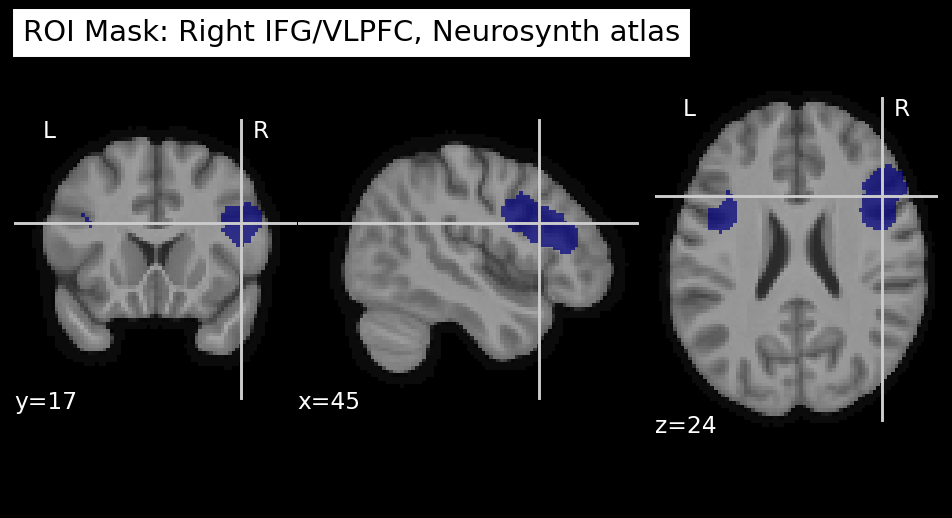

/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images

=== Violin: One-sample t-test vs 0 ===
Contrast key: CorrectUnaligned_gt_IncorrectUnaligned
Contrast label: CorrectIncongruent > IncorrectIncongruent
ROI: Right IFG/VLPFC, Neurosynth atlas
N = 50
Mean = 0.004310 | SD = 0.174253 | SEM = 0.024643
t(49) = 0.174916, p = 0.861866
Cohen's d = 0.024737
95% CI(mean) = [-0.045212, 0.053832]


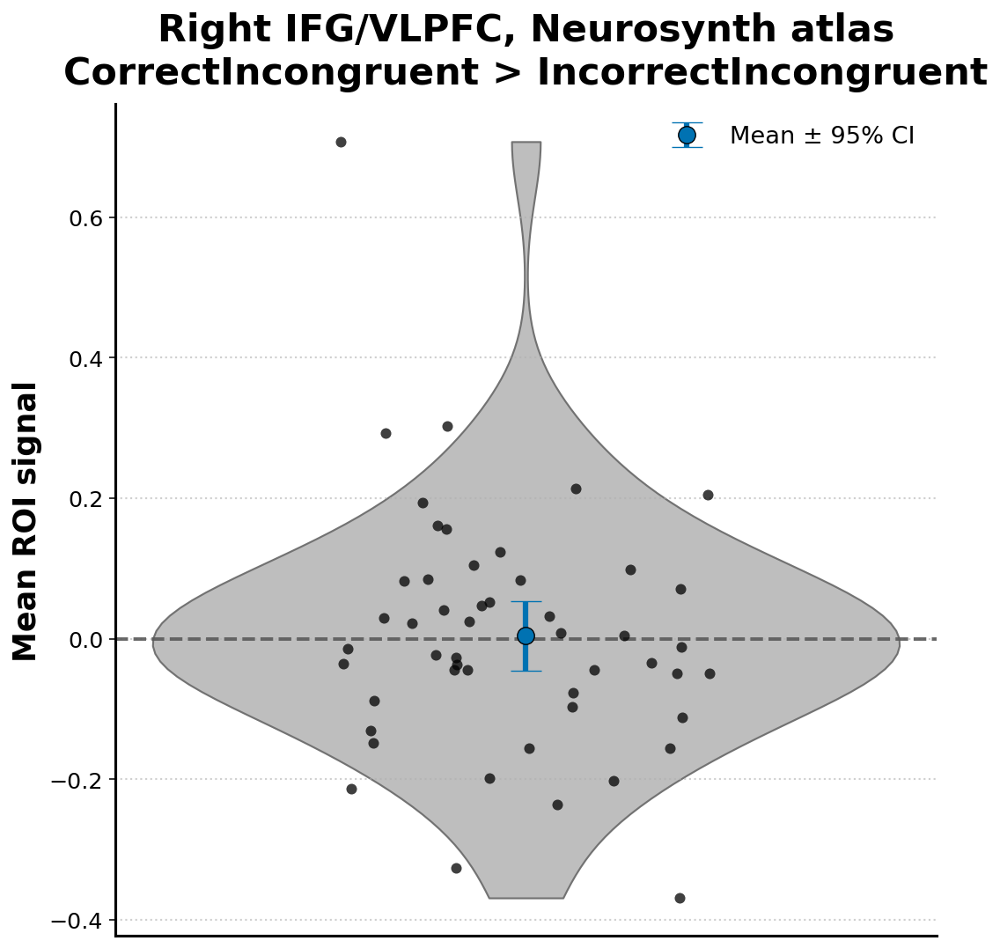

[OK] Saved violin: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Right_IFGVLPFC_Neurosynth_atlas_CorrectIncongruent_gt_IncorrectIncongruent_ViolinPoints_MeanCI.jpeg


/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
[INFO] CorrectUnaligned: 50 subjects, 2217 voxels


/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
[INFO] IncorrectUnaligned: 50 subjects, 2217 voxels


/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
[INFO] CorrectAligned: 50 subjects, 2217 voxels


/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
[INFO] IncorrectAligned: 50 subjects, 2217 voxels

=== Paired t-test (Incongruent) ===
CorrectUnaligned vs IncorrectUnaligned
N = 50
Mean(CorrectUnaligned) = 0.063163
Mean(IncorrectUnaligned) = 0.058852
Mean diff (CorrectUnaligned - IncorrectUnaligned) = 0.004311
95% CI(diff) = [-0.045212, 0.053833]
t(49) = 0.174926, p = 0.861859
d_z = 0.024738

=== Paired t-test (Congruent) ===
CorrectAligned vs IncorrectAligned
N = 50
Mean(CorrectAligned) = 0.038334
Mean(IncorrectAligned) = 0.042034
Mean diff (CorrectAligned - IncorrectAligned) = -0.003700
95% CI(diff) = [-0.078402, 0.071002]
t(49) = -0.099525, p = 0.921127
d_z = -0.014075


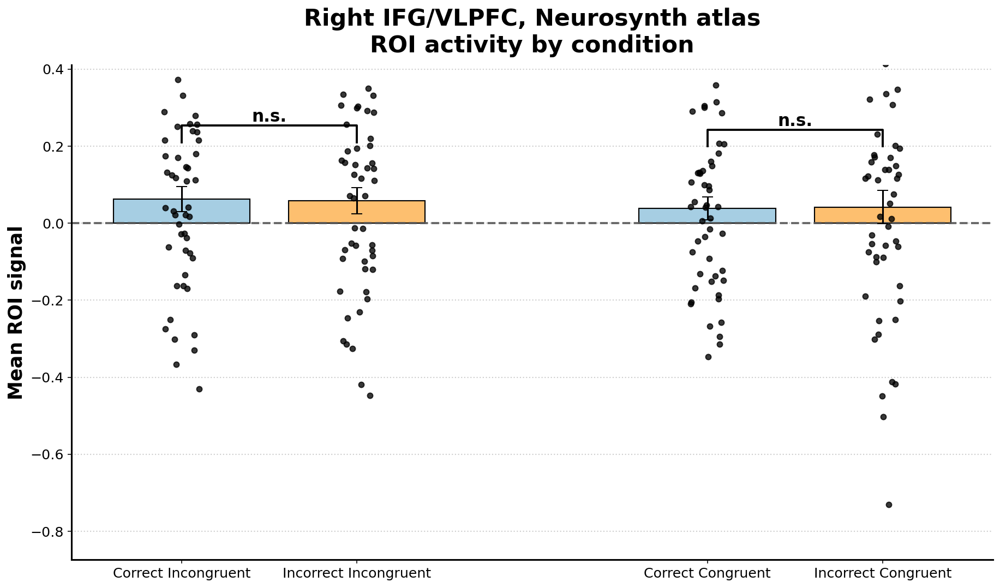

[OK] Saved 2x2 bars: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Right_IFGVLPFC_Neurosynth_atlas_Combined_2x2BarsPoints_SigStars_DisplayLabels.jpeg


In [26]:
import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
import seaborn as sns
import matplotlib.pyplot as plt

from nilearn import plotting
from nilearn.maskers import NiftiMasker
from scipy import stats


# ============================================================
# Helpers
# ============================================================
def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def condition_display_name(name: str) -> str:
    # Match your earlier nomenclature:
    # CorrectAligned -> Correct Congruent
    # CorrectUnaligned -> Correct Incongruent
    s = name.replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")
    s = "".join((" " + c if c.isupper() and i > 0 and (not s[i-1].isupper()) else c)
                for i, c in enumerate(s))
    return " ".join(s.split())

def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return mean, (mean - half, mean + half)

def mean_ci_paired(diff, confidence=0.95):
    diff = np.asarray(diff, dtype=float)
    diff = diff[~np.isnan(diff)]
    n = diff.size
    m = float(np.mean(diff))
    sem = float(stats.sem(diff))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return m, (m - half, m + half)

def cohens_d_onesample(x, mu0=0.0):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    return float((np.mean(x) - mu0) / np.std(x, ddof=1))

def p_to_stars(p: float) -> str:
    if p < 1e-4:
        return "****"
    if p < 1e-3:
        return "***"
    if p < 1e-2:
        return "**"
    if p < 5e-2:
        return "*"
    return "n.s."

def add_sig_bracket(ax, x1, x2, y, h, text, lw=2.0, color="black", fontsize=16, fontweight="bold"):
    ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=lw, c=color, clip_on=False)
    ax.text((x1 + x2) / 2, y + h, text, ha="center", va="bottom",
            color=color, fontsize=fontsize, fontweight=fontweight)

def extract_condition_means(masker, img_paths: dict):
    means = {}
    for key, path in img_paths.items():
        img = nib.load(path)
        roi_data = masker.transform(img)  # n_subjects x n_voxels
        means[key] = np.asarray(roi_data.mean(axis=1)).ravel().astype(float)
        print(f"[INFO] {key}: {roi_data.shape[0]} subjects, {roi_data.shape[1]} voxels")
    return means

def paired_test(means_dict, condA, condB, label):
    a = means_dict[condA].astype(float)
    b = means_dict[condB].astype(float)

    n = min(len(a), len(b))
    a = a[:n]
    b = b[:n]

    mask = (~np.isnan(a)) & (~np.isnan(b))
    a = a[mask]
    b = b[mask]
    n = a.size
    df = n - 1

    diff = a - b
    t_stat, p_val = stats.ttest_rel(a, b, nan_policy="omit")
    t_stat = float(t_stat)
    p_val = float(p_val)

    sd_diff = float(np.std(diff, ddof=1))
    dz = float(np.mean(diff) / sd_diff) if sd_diff != 0 else np.nan
    mean_diff, (ci_lo, ci_hi) = mean_ci_paired(diff, confidence=0.95)

    print(f"\n=== Paired t-test ({label}) ===")
    print(f"{condA} vs {condB}")
    print(f"N = {n}")
    print(f"Mean({condA}) = {float(np.mean(a)):.6f}")
    print(f"Mean({condB}) = {float(np.mean(b)):.6f}")
    print(f"Mean diff ({condA} - {condB}) = {mean_diff:.6f}")
    print(f"95% CI(diff) = [{ci_lo:.6f}, {ci_hi:.6f}]")
    print(f"t({df}) = {t_stat:.6f}, p = {p_val:.6g}")
    print(f"d_z = {dz:.6f}")

    return {"condA": condA, "condB": condB, "n": n, "df": df, "t": t_stat, "p": p_val, "dz": dz}


# ============================================================
# Style (bigger/bolder, easier to read)
# ============================================================
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 22,
    "axes.titleweight": "bold",
    "axes.labelsize": 18,
    "axes.labelweight": "bold",
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 14,
    "axes.linewidth": 1.6,
})

MEAN_COLOR = "#0072B2"
ZERO_COLOR = "0.35"
VIOLIN_COLOR = "#BEBEBE"

COND_COLORS = {
    "CorrectUnaligned":   "#A6CEE3",
    "IncorrectUnaligned": "#FDBF6F",
    "CorrectAligned":     "#A6CEE3",
    "IncorrectAligned":   "#FDBF6F",
}


# ============================================================
# User settings (assumes OUTPUT_DIR, mask_img, anat_img exist)
# ============================================================
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

roi_label = "Right IFG/VLPFC, Neurosynth atlas"
roi_slug = safe_filename(roi_label)

contrast_key_a = "CorrectUnaligned_gt_IncorrectUnaligned"
try:
    contrast_label_a = contrast_display_name(contrast_key_a)
except NameError:
    contrast_label_a = contrast_key_a.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")
contrast_slug_a = safe_filename(contrast_label_a)

functional_img_path_a = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_key_a}_all_sub_4d.nii.gz")

img_paths_incong = {
    "CorrectUnaligned": os.path.join(str(OUTPUT_DIR), "none_glm_CorrectUnaligned_all_sub_4d.nii.gz"),
    "IncorrectUnaligned": os.path.join(str(OUTPUT_DIR), "none_glm_IncorrectUnaligned_all_sub_4d.nii.gz"),
}
img_paths_cong = {
    "CorrectAligned": os.path.join(str(OUTPUT_DIR), "none_glm_CorrectAligned_all_sub_4d.nii.gz"),
    "IncorrectAligned": os.path.join(str(OUTPUT_DIR), "none_glm_IncorrectAligned_all_sub_4d.nii.gz"),
}


# ============================================================
# Masker (same behavior as your prior scripts)
# ============================================================
roi_mask_img = mask_img
masker = NiftiMasker(mask_img=roi_mask_img, standardize=False)
masker.fit()


# ============================================================
# 1) ROI MASK OVERLAY: SHOW in output + SAVE sagittal-only
#    - show the figure in notebook output
# ============================================================
# Show in notebook output (3-view crosshair)
roi_display_ortho = plotting.plot_roi(
    roi_mask_img,
    bg_img=anat_img,
    title=f"ROI Mask: {roi_label}",
    colorbar=False,
    draw_cross=True,
)
plotting.show() 

# ============================================================
# Violin data: extract ROI mean per subject from contrast 4D
# ============================================================
functional_img_a = nib.load(functional_img_path_a)
roi_vox_a = masker.transform(functional_img_a)
x = np.asarray(roi_vox_a.mean(axis=1)).ravel().astype(float)
x = x[~np.isnan(x)]

n_a = x.size
df_a = n_a - 1
group_mean_a = float(np.mean(x))
group_sd_a = float(np.std(x, ddof=1))
group_sem_a = float(stats.sem(x))
t_stat_a, p_val_a = stats.ttest_1samp(x, 0.0, nan_policy="omit")
t_stat_a = float(t_stat_a)
p_val_a = float(p_val_a)
d_a = cohens_d_onesample(x, mu0=0.0)
_, (ci_lo_a, ci_hi_a) = mean_ci_t(x, confidence=0.95)

print("\n=== Violin: One-sample t-test vs 0 ===")
print(f"Contrast key: {contrast_key_a}")
print(f"Contrast label: {contrast_label_a}")
print(f"ROI: {roi_label}")
print(f"N = {n_a}")
print(f"Mean = {group_mean_a:.6f} | SD = {group_sd_a:.6f} | SEM = {group_sem_a:.6f}")
print(f"t({df_a}) = {t_stat_a:.6f}, p = {p_val_a:.6g}")
print(f"Cohen's d = {d_a:.6f}")
print(f"95% CI(mean) = [{ci_lo_a:.6f}, {ci_hi_a:.6f}]")


# ============================================================
# 2) VIOLIN FIGURE (with individual subject points)
# ============================================================
figV, axV = plt.subplots(figsize=(7.8, 7.8))

sns.violinplot(
    y=x,
    ax=axV,
    color=VIOLIN_COLOR,
    inner=None,
    cut=0,
    linewidth=1.1
)

sns.stripplot(
    y=x,
    ax=axV,
    color="black",
    alpha=0.75,
    jitter=0.20,
    size=6.2,
    zorder=4
)

axV.errorbar(
    x=0,
    y=group_mean_a,
    yerr=np.array([[group_mean_a - ci_lo_a], [ci_hi_a - group_mean_a]]),
    fmt="o",
    color=MEAN_COLOR,
    ecolor=MEAN_COLOR,
    elinewidth=3.2,
    capsize=9,
    markersize=10,
    markeredgecolor="black",
    markeredgewidth=0.7,
    zorder=5,
    label="Mean ± 95% CI"
)

axV.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=2.0, alpha=0.9)
axV.set_xticks([])
axV.set_xlabel("")
axV.set_ylabel("Mean ROI signal")
axV.set_title(f"{roi_label}\n{contrast_label_a}", pad=12)

axV.spines["top"].set_visible(False)
axV.spines["right"].set_visible(False)
axV.grid(True, axis="y", linestyle=":", linewidth=1.1, alpha=0.6)
axV.legend(frameon=False, loc="upper right")

plt.tight_layout()
violin_out = os.path.join(FIG_DIR, f"{roi_slug}_{contrast_slug_a}_ViolinPoints_MeanCI.jpeg")
figV.savefig(violin_out, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved violin: {violin_out}")


# ============================================================
# 3) 2x2 BARPLOT FIGURE (combined; gap; points; display labels)
# ============================================================
means_incong = extract_condition_means(masker, img_paths_incong)
means_cong = extract_condition_means(masker, img_paths_cong)

res_incong = paired_test(means_incong, "CorrectUnaligned", "IncorrectUnaligned", label="Incongruent")
res_cong = paired_test(means_cong, "CorrectAligned", "IncorrectAligned", label="Congruent")

def make_long(means_dict, condA, condB, block):
    a = means_dict[condA].astype(float)
    b = means_dict[condB].astype(float)
    n = min(len(a), len(b))
    a = a[:n]
    b = b[:n]
    mask = (~np.isnan(a)) & (~np.isnan(b))
    a = a[mask]
    b = b[mask]
    n = a.size
    df = pd.DataFrame({"Subject": np.arange(1, n + 1), condA: a, condB: b})
    df_long = df.melt(id_vars="Subject", value_vars=[condA, condB],
                      var_name="Condition", value_name="Mean ROI Signal")
    df_long["Block"] = block
    df_long["ConditionLabel"] = df_long["Condition"].map(condition_display_name)
    return df_long

dfB = pd.concat([
    make_long(means_incong, "CorrectUnaligned", "IncorrectUnaligned", "Incongruent"),
    make_long(means_cong, "CorrectAligned", "IncorrectAligned", "Congruent"),
], ignore_index=True)

xpos = {
    "CorrectUnaligned": 0.0,
    "IncorrectUnaligned": 1.0,
    "CorrectAligned": 3.0,
    "IncorrectAligned": 4.0,
}
dfB["xpos"] = dfB["Condition"].map(xpos)

g = (
    dfB.groupby("Condition")["Mean ROI Signal"]
       .agg(["mean", "count", "std"])
       .reset_index()
)
g["se"] = g["std"] / np.sqrt(g["count"])
g["xpos"] = g["Condition"].map(xpos)

figB, axB = plt.subplots(figsize=(13.2, 7.8))

bar_width = 0.78
for _, row in g.iterrows():
    cond = row["Condition"]
    axB.bar(
        row["xpos"], row["mean"],
        width=bar_width,
        color=COND_COLORS.get(cond, "0.8"),
        edgecolor="black",
        linewidth=1.1,
        zorder=2
    )
    axB.errorbar(
        row["xpos"], row["mean"],
        yerr=row["se"],
        color="black",
        linewidth=1.6,
        capsize=5,
        zorder=3
    )

rng = np.random.default_rng(0)
jitter = 0.10
axB.scatter(
    dfB["xpos"].to_numpy() + rng.uniform(-jitter, jitter, size=len(dfB)),
    dfB["Mean ROI Signal"].to_numpy(),
    color="black",
    alpha=0.78,
    s=26,
    zorder=4
)

axB.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=2.0, alpha=0.9)
axB.set_ylabel("Mean ROI signal")
axB.set_xlabel("")
axB.set_title(f"{roi_label}\nROI activity by condition", pad=12)

tick_order = ["CorrectUnaligned", "IncorrectUnaligned", "CorrectAligned", "IncorrectAligned"]
axB.set_xticks([xpos[k] for k in tick_order])
axB.set_xticklabels([condition_display_name(k) for k in tick_order], rotation=0)

axB.spines["top"].set_visible(False)
axB.spines["right"].set_visible(False)
axB.grid(True, axis="y", linestyle=":", linewidth=1.1, alpha=0.6)

# Significance brackets
yvals = dfB["Mean ROI Signal"].to_numpy()
ymin, ymax = np.nanmin(yvals), np.nanmax(yvals)
yr = (ymax - ymin) if (ymax > ymin) else 1.0

def top_for_pair(cond1, cond2):
    y1 = g.loc[g["Condition"] == cond1, "mean"].values[0]
    y2 = g.loc[g["Condition"] == cond2, "mean"].values[0]
    se1 = g.loc[g["Condition"] == cond1, "se"].values[0]
    se2 = g.loc[g["Condition"] == cond2, "se"].values[0]
    return max(y1 + se1, y2 + se2)

x1i, x2i = xpos["CorrectUnaligned"], xpos["IncorrectUnaligned"]
yi = top_for_pair("CorrectUnaligned", "IncorrectUnaligned") + 0.08 * yr
add_sig_bracket(axB, x1i, x2i, y=yi, h=0.03 * yr, text=p_to_stars(res_incong["p"]))

x1c, x2c = xpos["CorrectAligned"], xpos["IncorrectAligned"]
yc = top_for_pair("CorrectAligned", "IncorrectAligned") + 0.08 * yr
add_sig_bracket(axB, x1c, x2c, y=yc, h=0.03 * yr, text=p_to_stars(res_cong["p"]))

axB.set_ylim(bottom=min(0, ymin - 0.1 * yr), top=max(yi, yc) + 0.14 * yr)

plt.tight_layout()
bar_out = os.path.join(FIG_DIR, f"{roi_slug}_Combined_2x2BarsPoints_SigStars_DisplayLabels.jpeg")
figB.savefig(bar_out, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved 2x2 bars: {bar_out}")

### older figures: one by one

/tmp/ipykernel_397481/3542871191.py:5: DeprecationWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  from nilearn import input_data, plotting


[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/DLPFC_Neurosynth_atlas_ROIMaskOverlay.jpeg


/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
Contrast (key): CorrectUnaligned_gt_IncorrectUnaligned
Contrast (label): CorrectIncongruent > IncorrectIncongruent
ROI: DLPFC, Neurosynth atlas
N subjects: 50
Mean ROI signal: 0.0877 (SD=0.1674, SEM=0.0237)
One-sample t-test vs 0: t(49) = 3.702, p = 0.0005421
Effect size (Cohen's d): d = 0.524
95% CI for mean: [0.0401, 0.1352]


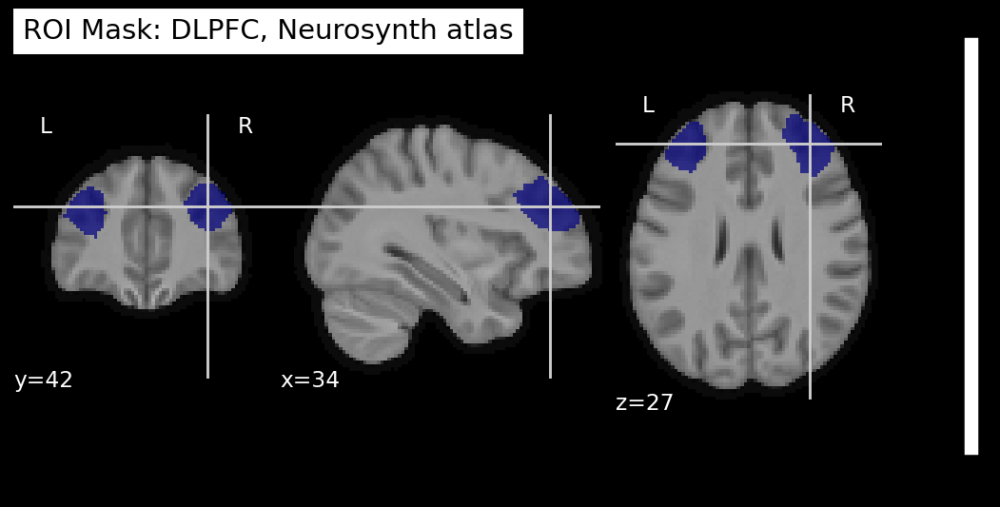

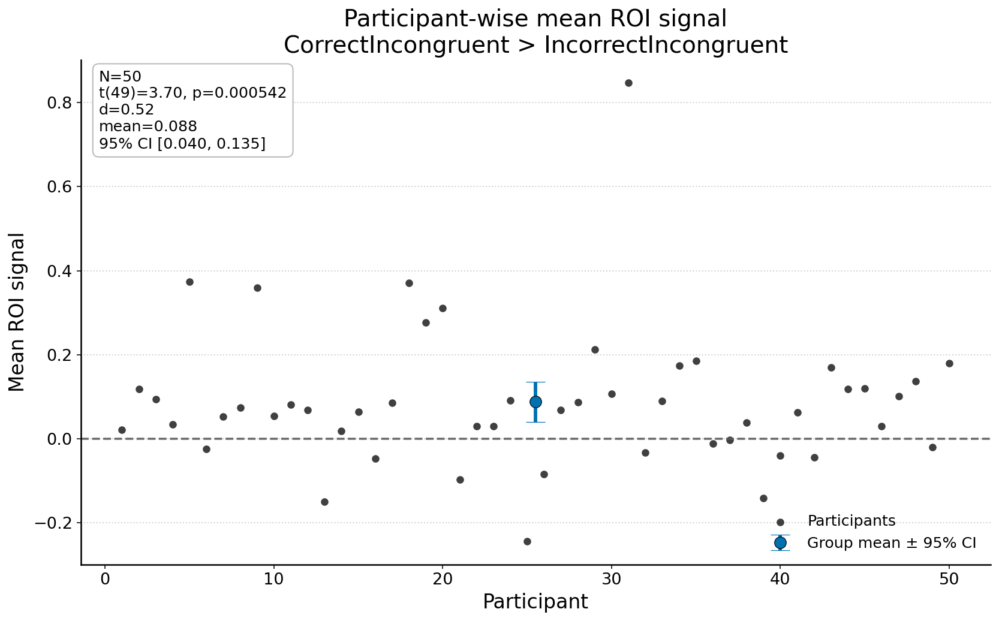

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/DLPFC_Neurosynth_atlas_CorrectIncongruent_gt_IncorrectIncongruent_ParticipantScatter_MeanCI.jpeg


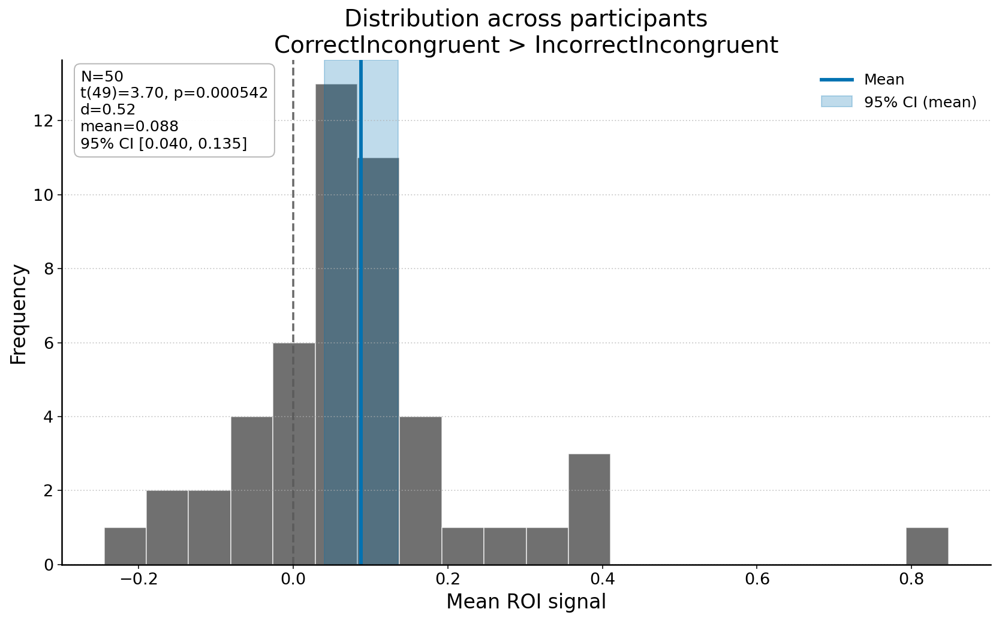

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/DLPFC_Neurosynth_atlas_CorrectIncongruent_gt_IncorrectIncongruent_Histogram_MeanCI.jpeg


In [15]:
import os
import re
import numpy as np
import nibabel as nib
from nilearn import input_data, plotting
from scipy import stats
import matplotlib.pyplot as plt

# -----------------------
# Helpers: stats + CI + effect size
# -----------------------
def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return mean, (mean - half, mean + half)

def cohens_d_onesample(x, mu0=0.0):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    return float((np.mean(x) - mu0) / np.std(x, ddof=1))

def safe_filename(s: str, maxlen: int = 140) -> str:
    """Filesystem-safe slug (keeps underscores; removes other problematic chars)."""
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

# -----------------------
# Settings (readability)
# -----------------------
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,          # high-def saves
    "axes.titlesize": 20,
    "axes.labelsize": 17,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 13,
    "axes.linewidth": 1.3,
})


MEAN_COLOR = "#0072B2"   # strong blue (Okabe–Ito)
# Alternative: "#6A3D9A"  # purple (also high-contrast)
ZERO_COLOR = "0.35"      # keep neutral gray for the 0-line

# Display-only contrast label
contrast_key = "CorrectUnaligned_gt_IncorrectUnaligned"
try:
    contrast_label = contrast_display_name(contrast_key)
except NameError:
    contrast_label = contrast_key.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")

roi_label = "DLPFC, Neurosynth atlas"

# -----------------------
# Output folder for figures
# -----------------------
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

roi_slug = safe_filename(roi_label)
contrast_slug = safe_filename(contrast_label)

# -----------------------
# Load data
# -----------------------
functional_img_path = os.path.join(
    str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d.nii.gz"
)
functional_img = nib.load(functional_img_path)

roi_mask_img = mask_img
plotting.plot_roi(roi_mask_img, anat_img, title=f"ROI Mask: {roi_label}")

import os
import re

def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

roi_slug = safe_filename(roi_label)
contrast_slug = safe_filename(contrast_label)

# --- ROI mask overlay (save) ---
display = plotting.plot_roi(
    roi_mask_img,
    anat_img,
    title=f"ROI Mask: {roi_label}",
    colorbar=False
)

roi_plot_title = "ROIMaskOverlay"
roi_out = os.path.join(FIG_DIR, f"{roi_slug}_{roi_plot_title}.jpeg")

display.savefig(roi_out, dpi=600)
display.close()

print(f"[OK] Saved: {roi_out}")

nifti_masker = input_data.NiftiMasker(mask_img=roi_mask_img, standardize=False)
roi_vox = nifti_masker.fit_transform(functional_img)  # n_subjects x n_voxels
mean_signal_per_subject = roi_vox.mean(axis=1)

# -----------------------
# Group stats
# -----------------------
x = np.asarray(mean_signal_per_subject, dtype=float)
x = x[~np.isnan(x)]
n = x.size
df = n - 1

group_mean = float(np.mean(x))
group_sd = float(np.std(x, ddof=1))
group_sem = float(stats.sem(x))

t_statistic, p_value = stats.ttest_1samp(x, 0.0, nan_policy="omit")
t_statistic = float(t_statistic)
p_value = float(p_value)

d = cohens_d_onesample(x, mu0=0.0)
_, (ci_lo, ci_hi) = mean_ci_t(x, confidence=0.95)

print(f"Contrast (key): {contrast_key}")
print(f"Contrast (label): {contrast_label}")
print(f"ROI: {roi_label}")
print(f"N subjects: {n}")
print(f"Mean ROI signal: {group_mean:.4f} (SD={group_sd:.4f}, SEM={group_sem:.4f})")
print(f"One-sample t-test vs 0: t({df}) = {t_statistic:.3f}, p = {p_value:.4g}")
print(f"Effect size (Cohen's d): d = {d:.3f}")
print(f"95% CI for mean: [{ci_lo:.4f}, {ci_hi:.4f}]")

stats_text = (
    f"N={n}\n"
    f"t({df})={t_statistic:.2f}, p={p_value:.3g}\n"
    f"d={d:.2f}\n"
    f"mean={group_mean:.3f}\n"
    f"95% CI [{ci_lo:.3f}, {ci_hi:.3f}]"
)

# -----------------------
# Plot 1: subject points + mean ± 95% CI (SAVE)
# -----------------------
fig1, ax1 = plt.subplots(figsize=(12, 7.5))
x_subjects = np.arange(1, n + 1)

ax1.scatter(
    x_subjects, x,
    color="black", alpha=0.75, s=42, linewidths=0,
    label="Participants"
)

ax1.errorbar(
    x=np.mean(x_subjects),
    y=group_mean,
    yerr=np.array([[group_mean - ci_lo], [ci_hi - group_mean]]),
    fmt="o",
    color=MEAN_COLOR,
    ecolor=MEAN_COLOR,
    elinewidth=3.0,
    capsize=8,
    markersize=10,
    markeredgecolor="black",
    markeredgewidth=0.6,
    label="Group mean ± 95% CI"
)

ax1.axhline(y=0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax1.set_xlabel("Participant")
ax1.set_ylabel("Mean ROI signal")
plot1_title = "ParticipantScatter_MeanCI"
ax1.set_title(f"Participant-wise mean ROI signal\n{contrast_label}")

ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

ax1.text(
    0.02, 0.98, stats_text,
    transform=ax1.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax1.legend(frameon=False, loc="lower right")
plt.tight_layout()

fname1 = f"{roi_slug}_{contrast_slug}_{plot1_title}.jpeg"
out1 = os.path.join(FIG_DIR, fname1)
fig1.savefig(out1, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out1}")

# -----------------------
# Plot 2: distribution (hist) + mean and CI (SAVE)
# -----------------------
fig2, ax2 = plt.subplots(figsize=(12, 7.5))

ax2.hist(x, bins=20, color="0.25", alpha=0.75, edgecolor="white", linewidth=0.8)
ax2.axvline(x=0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)

ax2.axvline(group_mean, color=MEAN_COLOR, linewidth=3.0, label="Mean")
ax2.axvspan(ci_lo, ci_hi, color=MEAN_COLOR, alpha=0.25, label="95% CI (mean)")

ax2.set_xlabel("Mean ROI signal")
ax2.set_ylabel("Frequency")
plot2_title = "Histogram_MeanCI"
ax2.set_title(f"Distribution across participants\n{contrast_label}")

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

ax2.text(
    0.02, 0.98, stats_text,
    transform=ax2.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax2.legend(frameon=False, loc="upper right")
plt.tight_layout()

fname2 = f"{roi_slug}_{contrast_slug}_{plot2_title}.jpeg"
out2 = os.path.join(FIG_DIR, fname2)
fig2.savefig(out2, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out2}")

/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
CorrectUnaligned: ROI data shape (subjects x voxels): (50, 2860)


/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
IncorrectUnaligned: ROI data shape (subjects x voxels): (50, 2860)


/tmp/ipykernel_2031978/722666085.py:159: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


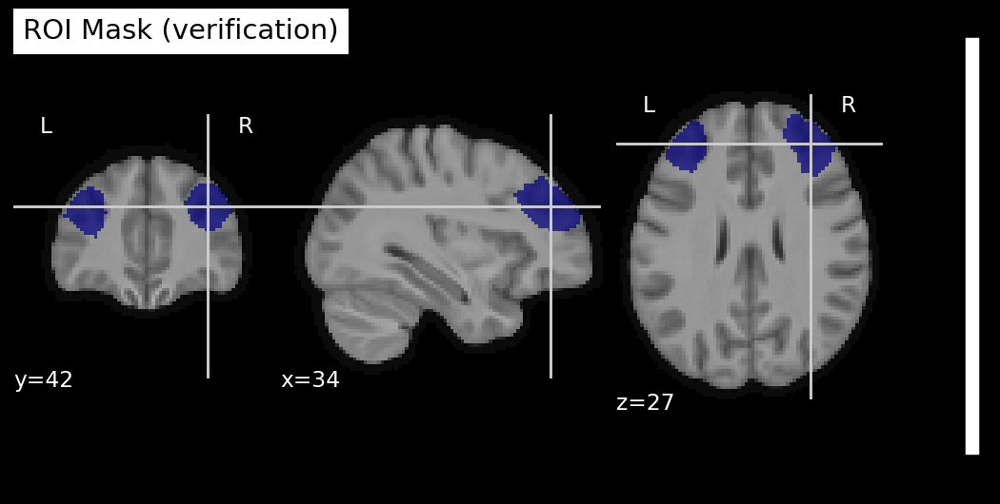

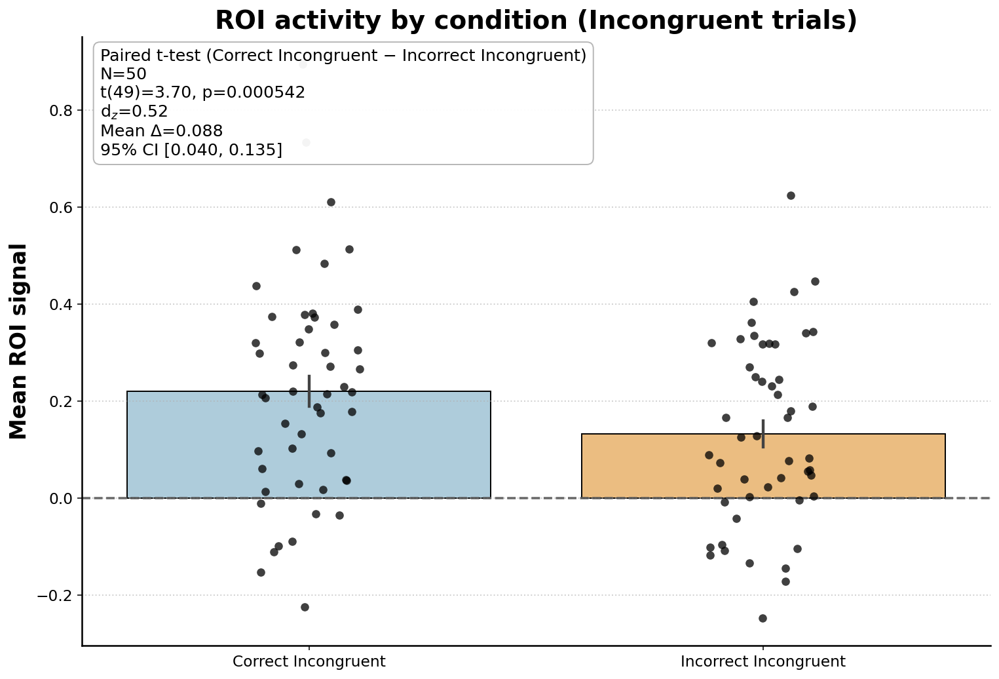

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/DLPFC_Neurosynth_atlas_ROI_CorrectIncongruent_gt_IncorrectIncongruent_PairedBarsPoints.jpeg


In [21]:
import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
import seaborn as sns
import matplotlib.pyplot as plt
from nilearn import input_data, plotting
from scipy import stats

# -----------------------
# Display-only label helpers
# -----------------------
def condition_display_name(name: str) -> str:
    s = name
    s = s.replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")
    s = "".join((" " + c if c.isupper() and i > 0 and (not s[i-1].isupper()) else c)
                for i, c in enumerate(s))
    return " ".join(s.split())

def mean_ci_paired(diff, confidence=0.95):
    diff = np.asarray(diff, dtype=float)
    diff = diff[~np.isnan(diff)]
    n = diff.size
    m = float(np.mean(diff))
    sem = float(stats.sem(diff))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return m, (m - half, m + half)

def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

# -----------------------
# Readability + high-def saving
# -----------------------
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 20,
    "axes.labelsize": 17,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 13,
    "axes.linewidth": 1.3,
})

# Pastel palette (light blue + light orange)
COND_COLORS = {
    "CorrectUnaligned":   "#A6CEE3",
    "IncorrectUnaligned": "#FDBF6F",
}
ZERO_LINE_COLOR = "0.35"

# -----------------------
# Output directory (same as before)
# -----------------------
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

# -----------------------
# Inputs
# -----------------------
img_paths = {
    "CorrectUnaligned": os.path.join(str(OUTPUT_DIR), "none_glm_CorrectUnaligned_all_sub_4d.nii.gz"),
    "IncorrectUnaligned": os.path.join(str(OUTPUT_DIR), "none_glm_IncorrectUnaligned_all_sub_4d.nii.gz"),
}
cond_order = ["CorrectUnaligned", "IncorrectUnaligned"]

# For consistent naming, define ROI + contrast labels (edit to match your earlier figures)
# If you have these variables already, you can delete these lines and reuse yours.
roi_label = "DLPFC, Neurosynth atlas ROI"
contrast_key = "CorrectUnaligned_gt_IncorrectUnaligned"
try:
    contrast_label = contrast_display_name(contrast_key)
except NameError:
    contrast_label = contrast_key.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")

roi_slug = safe_filename(roi_label)
contrast_slug = safe_filename(contrast_label)

# -----------------------
# Load ROI + set up masker
# -----------------------
roi_mask_img = mask_img
plotting.plot_roi(roi_mask_img, anat_img, title="ROI Mask (verification)")

masker = input_data.NiftiMasker(mask_img=roi_mask_img, standardize=False)
masker.fit()

# -----------------------
# Extract mean ROI signal per subject for each condition
# -----------------------
means = {}
for key, path in img_paths.items():
    img = nib.load(path)
    roi_data = masker.transform(img)  # n_subjects x n_voxels
    means[key] = np.asarray(roi_data.mean(axis=1)).ravel()
    print(f"{key}: ROI data shape (subjects x voxels): {roi_data.shape}")

# -----------------------
# Ensure paired data
# -----------------------
n1, n2 = len(means[cond_order[0]]), len(means[cond_order[1]])
if n1 != n2:
    print(f"WARNING: Different subject counts ({cond_order[0]}={n1}, {cond_order[1]}={n2}). "
          f"Trimming both to min for paired test/plot.")
n = min(n1, n2)
x = means[cond_order[0]][:n]
y = means[cond_order[1]][:n]

pair_mask = (~np.isnan(x)) & (~np.isnan(y))
x = x[pair_mask]
y = y[pair_mask]
n = x.size

# -----------------------
# Paired stats
# -----------------------
diff = x - y
t_stat, p_val = stats.ttest_rel(x, y, nan_policy="omit")
t_stat = float(t_stat)
p_val = float(p_val)
df = n - 1

sd_diff = float(np.std(diff, ddof=1))
dz = float(np.mean(diff) / sd_diff) if sd_diff != 0 else np.nan

mean_diff, (ci_lo, ci_hi) = mean_ci_paired(diff, confidence=0.95)

# -----------------------
# Dataframe for plotting
# -----------------------
plot_df = pd.DataFrame({
    "Subject": np.arange(1, n + 1),
    cond_order[0]: x,
    cond_order[1]: y,
})
plot_df_long = plot_df.melt(
    id_vars="Subject",
    value_vars=cond_order,
    var_name="Condition",
    value_name="Mean ROI Signal"
)
plot_df_long["ConditionLabel"] = plot_df_long["Condition"].map(condition_display_name)
order_labels = [condition_display_name(k) for k in cond_order]
palette_by_label = {condition_display_name(k): v for k, v in COND_COLORS.items()}

# -----------------------
# Plot
# -----------------------
fig, ax = plt.subplots(figsize=(11, 7.5))

sns.barplot(
    data=plot_df_long,
    x="ConditionLabel",
    y="Mean ROI Signal",
    order=order_labels,
    estimator=np.mean,
    errorbar="se",
    palette=palette_by_label,
    edgecolor="black",
    linewidth=1.0,
    ax=ax
)

sns.stripplot(
    data=plot_df_long,
    x="ConditionLabel",
    y="Mean ROI Signal",
    order=order_labels,
    color="black",
    alpha=0.75,
    jitter=0.12,
    size=6.5,
    ax=ax
)

ax.axhline(0, color=ZERO_LINE_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax.set_xlabel("")
ax.set_ylabel("Mean ROI signal")

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

stats_text = (
    f"Paired t-test ({order_labels[0]} − {order_labels[1]})\n"
    f"N={n}\n"
    f"t({df})={t_stat:.2f}, p={p_val:.3g}\n"
    f"d$_z$={dz:.2f}\n"
    f"Mean Δ={mean_diff:.3f}\n"
    f"95% CI [{ci_lo:.3f}, {ci_hi:.3f}]"
)

ax.text(
    0.02, 0.98, stats_text,
    transform=ax.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

plot_title = "PairedBarsPoints"
ax.set_title("ROI activity by condition (Incongruent trials)")

plt.tight_layout()

# -----------------------
# SAVE (same naming convention)
# -----------------------
fname = f"{roi_slug}_{contrast_slug}_{plot_title}.jpeg"
out_path = os.path.join(FIG_DIR, fname)
fig.savefig(out_path, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out_path}")

/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
CorrectAligned: ROI data shape (subjects x voxels): (50, 2217)


/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/joblib/memory.py:326: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  return self.func(*args, **kwargs)


[NiftiMasker.wrapped] Resampling images
IncorrectAligned: ROI data shape (subjects x voxels): (50, 2217)


/tmp/ipykernel_537572/2565062986.py:160: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


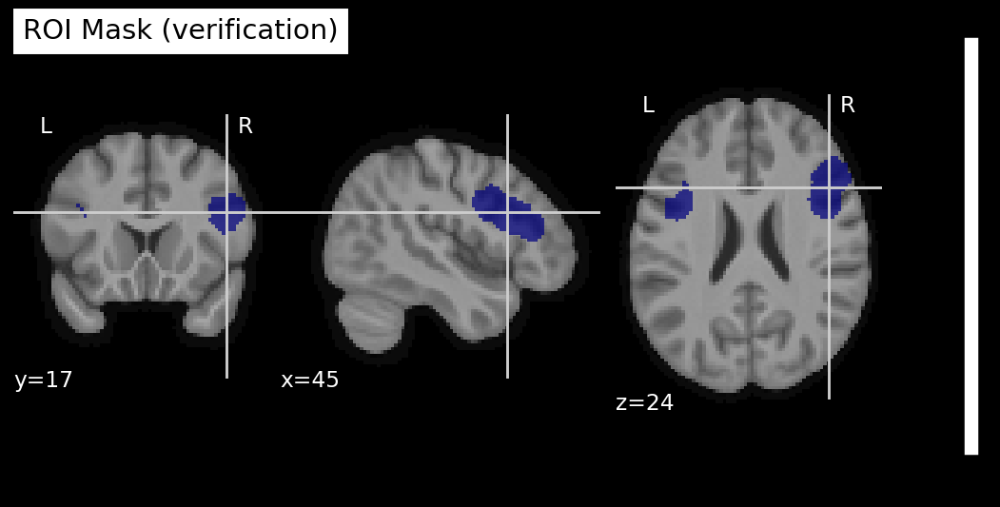

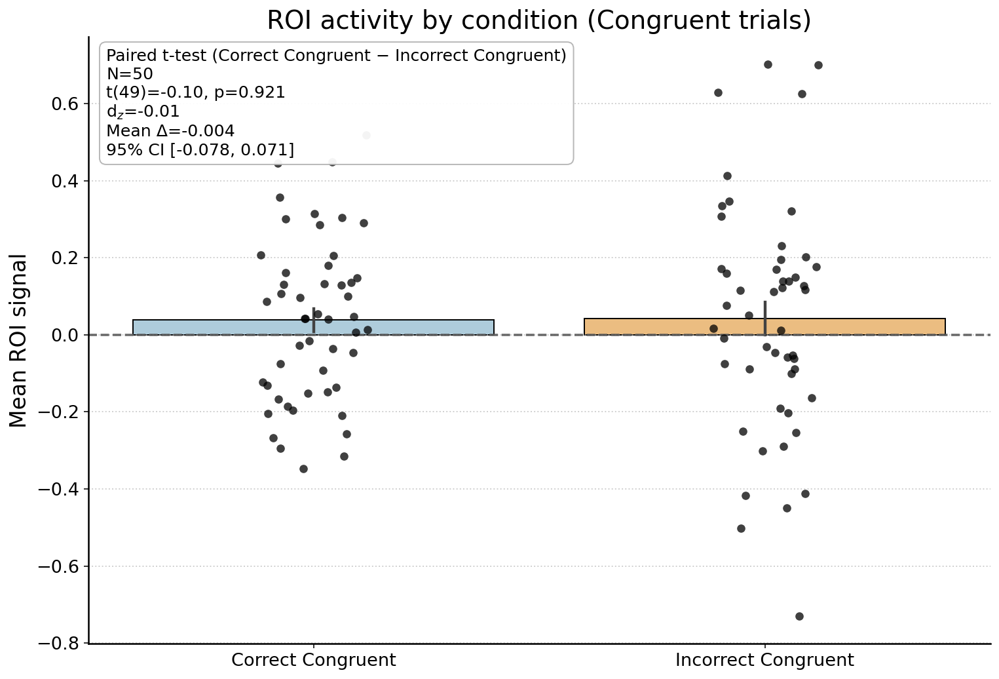

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Right_IFGVLPFC_Neurosynth_atlas_ROI_CorrectCongruent_gt_IncorrectCongruent_PairedBarsPoints.jpeg


In [92]:
## check same for Congruent contrast (pastel palette + more readable + SAVE)

import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
import seaborn as sns
import matplotlib.pyplot as plt
from nilearn import input_data, plotting
from scipy import stats

# -----------------------
# Display-only label helpers
# -----------------------
def condition_display_name(name: str) -> str:
    s = name
    s = s.replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")
    s = "".join((" " + c if c.isupper() and i > 0 and (not s[i-1].isupper()) else c)
                for i, c in enumerate(s))
    return " ".join(s.split())

def mean_ci_paired(diff, confidence=0.95):
    diff = np.asarray(diff, dtype=float)
    diff = diff[~np.isnan(diff)]
    n = diff.size
    m = float(np.mean(diff))
    sem = float(stats.sem(diff))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return m, (m - half, m + half)

def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

# -----------------------
# Readability + high-def saving
# -----------------------
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 20,
    "axes.labelsize": 17,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 13,
    "axes.linewidth": 1.3,
})

# Pastel palette
COND_COLORS = {
    "CorrectAligned":   "#A6CEE3",  # pastel blue
    "IncorrectAligned": "#FDBF6F",  # pastel orange
}
ZERO_LINE_COLOR = "0.35"

# -----------------------
# Output directory
# -----------------------
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

# For consistent naming (edit these to match your paper labels if needed)
roi_label = "DLPFC, Neurosynth atlas ROI"
contrast_key = "CorrectAligned_gt_IncorrectAligned"
try:
    contrast_label = contrast_display_name(contrast_key)
except NameError:
    contrast_label = contrast_key.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")

roi_slug = safe_filename(roi_label)
contrast_slug = safe_filename(contrast_label)

# --------------------------------------------------
# Inputs
# --------------------------------------------------
img_paths = {
    "CorrectAligned": os.path.join(str(OUTPUT_DIR), "none_glm_CorrectAligned_all_sub_4d.nii.gz"),
    "IncorrectAligned": os.path.join(str(OUTPUT_DIR), "none_glm_IncorrectAligned_all_sub_4d.nii.gz"),
}
cond_order = ["CorrectAligned", "IncorrectAligned"]

# --------------------------------------------------
# Load ROI + set up masker
# --------------------------------------------------
roi_mask_img = mask_img
plotting.plot_roi(roi_mask_img, anat_img, title="ROI Mask (verification)")

masker = input_data.NiftiMasker(mask_img=roi_mask_img, standardize=False)
masker.fit()

# --------------------------------------------------
# Extract mean ROI signal per subject for each condition
# --------------------------------------------------
means = {}
for key, path in img_paths.items():
    img = nib.load(path)
    roi_data = masker.transform(img)  # n_subjects x n_voxels
    means[key] = np.asarray(roi_data.mean(axis=1)).ravel()
    print(f"{key}: ROI data shape (subjects x voxels): {roi_data.shape}")

# --------------------------------------------------
# Ensure paired data
# --------------------------------------------------
n1, n2 = len(means[cond_order[0]]), len(means[cond_order[1]])
if n1 != n2:
    print(f"WARNING: Different subject counts ({cond_order[0]}={n1}, {cond_order[1]}={n2}). "
          f"Trimming both to min for paired test/plot.")
n = min(n1, n2)
x = means[cond_order[0]][:n]
y = means[cond_order[1]][:n]

pair_mask = (~np.isnan(x)) & (~np.isnan(y))
x = x[pair_mask]
y = y[pair_mask]
n = x.size

# --------------------------------------------------
# Stats
# --------------------------------------------------
diff = x - y
t_stat, p_val = stats.ttest_rel(x, y, nan_policy="omit")
t_stat = float(t_stat)
p_val = float(p_val)
df = n - 1

sd_diff = float(np.std(diff, ddof=1))
dz = float(np.mean(diff) / sd_diff) if sd_diff != 0 else np.nan

mean_diff, (ci_lo, ci_hi) = mean_ci_paired(diff, confidence=0.95)

# --------------------------------------------------
# Dataframe for plotting
# --------------------------------------------------
plot_df = pd.DataFrame({
    "Subject": np.arange(1, n + 1),
    cond_order[0]: x,
    cond_order[1]: y,
})
plot_df_long = plot_df.melt(
    id_vars="Subject",
    value_vars=cond_order,
    var_name="Condition",
    value_name="Mean ROI Signal"
)
plot_df_long["ConditionLabel"] = plot_df_long["Condition"].map(condition_display_name)
order_labels = [condition_display_name(k) for k in cond_order]
palette_by_label = {condition_display_name(k): v for k, v in COND_COLORS.items()}

# --------------------------------------------------
# Plot
# --------------------------------------------------
fig, ax = plt.subplots(figsize=(11, 7.5))

sns.barplot(
    data=plot_df_long,
    x="ConditionLabel",
    y="Mean ROI Signal",
    order=order_labels,
    estimator=np.mean,
    errorbar="se",
    palette=palette_by_label,
    edgecolor="black",
    linewidth=1.0,
    ax=ax
)

sns.stripplot(
    data=plot_df_long,
    x="ConditionLabel",
    y="Mean ROI Signal",
    order=order_labels,
    color="black",
    alpha=0.75,
    jitter=0.12,
    size=6.5,
    ax=ax
)

ax.axhline(0, color=ZERO_LINE_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax.set_xlabel("")
ax.set_ylabel("Mean ROI signal")

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

stats_text = (
    f"Paired t-test ({order_labels[0]} − {order_labels[1]})\n"
    f"N={n}\n"
    f"t({df})={t_stat:.2f}, p={p_val:.3g}\n"
    f"d$_z$={dz:.2f}\n"
    f"Mean Δ={mean_diff:.3f}\n"
    f"95% CI [{ci_lo:.3f}, {ci_hi:.3f}]"
)

ax.text(
    0.02, 0.98, stats_text,
    transform=ax.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax.set_title("ROI activity by condition (Congruent trials)")

plt.tight_layout()

# --------------------------------------------------
# SAVE (same naming convention)
# --------------------------------------------------
plot_title = "PairedBarsPoints"
fname = f"{roi_slug}_{contrast_slug}_{plot_title}.jpeg"
out_path = os.path.join(FIG_DIR, fname)
fig.savefig(out_path, format="jpeg", dpi=600, bbox_inches="tight")

plt.show()
print(f"[OK] Saved: {out_path}")

### Start Group comparison, BES correlation, and BMI correlation in atlas ROIs - exploratory

#### Start group comparison - exploratory

Region: Right IFG/VLPFC | file_value=46 | voxels=1882


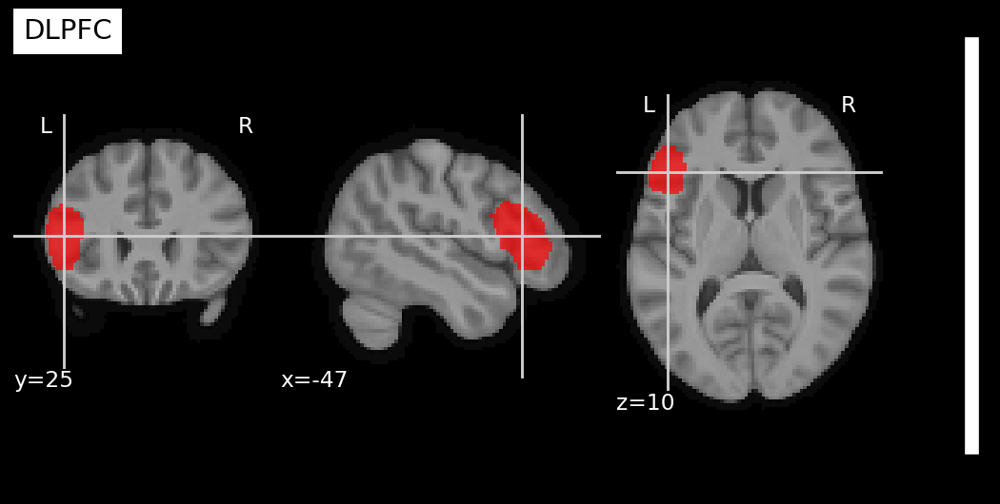

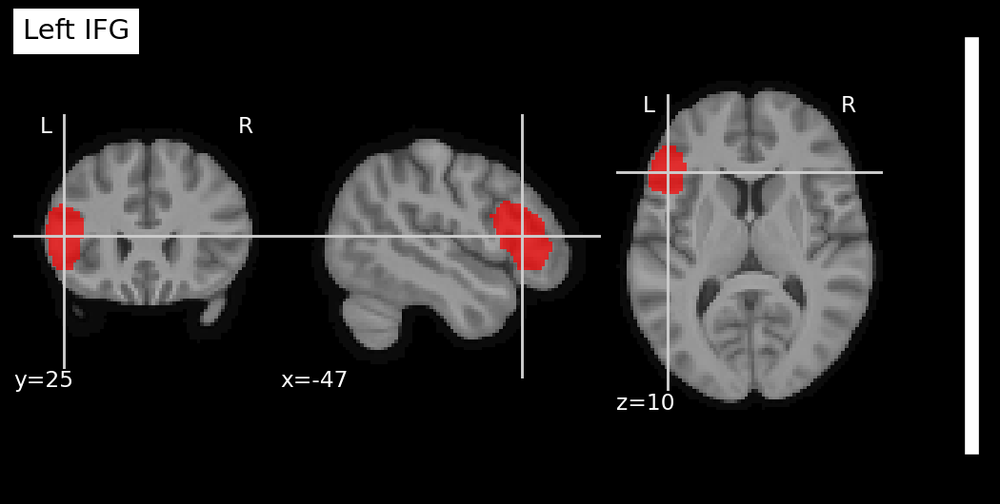

In [85]:
# Mask function: same as above but putting here so I don't have to scroll lol
anat_img = load_img(str(MEAN_ANAT))

def make_parcel_mask(atlas_path, label_id):
    """label_id = your original 0-based label number"""
    img = nib.load(atlas_path)
    data = np.round(img.get_fdata()).astype(int)
    file_value = label_id + 1  # offset correction
    mask = (data == file_value).astype(np.int8)
    print(f"Region: {region_labels.get(file_value, 'Unknown')} | file_value={file_value} | voxels={mask.sum()}")
    return nib.Nifti1Image(mask, affine=img.affine)

# ID area
mask_img = make_parcel_mask(atlas_path, 45)  # idk why but codes are -1 off, so: your label 32 -> file value 33
plotting.plot_roi(mask_img, bg_img=anat_img, title="DLPFC", cmap="autumn", alpha=0.7) #44
#plotting.plot_roi(mask_img, bg_img=anat_img, title="DMPFC", cmap="autumn", alpha=0.7) #2
#plotting.plot_roi(mask_img, bg_img=anat_img, title="Anterior VLPFC", cmap="autumn", alpha=0.7) #25
#plotting.plot_roi(mask_img, bg_img=anat_img, title="Anterior Fronto-Parietal (DLPFC, dACC)", cmap="autumn", alpha=0.7) #23
#plotting.plot_roi(mask_img, bg_img=anat_img, title="Right IFG/VLPFC", cmap="autumn", alpha=0.7) #27 -- switched with left from above!! not sure why!!
plotting.plot_roi(mask_img, bg_img=anat_img, title="Left IFG", cmap="autumn", alpha=0.7) #45 -- switched with rIFG/VLPFC!!

In [45]:
import os
import re
from pathlib import Path
from nilearn.image import concat_imgs

firstlevel_dir = Path(OUTPUT_DIR)
contrast_name = "CorrectAligned_gt_IncorrectAligned"
out_4d_path = Path(OUTPUT_DIR) / f"none_glm_{contrast_name}_all_sub_4d.nii.gz"
out_order_path = Path(OUTPUT_DIR) / f"none_glm_{contrast_name}_all_sub_4d_subject_order.txt"

def normalize_to_digits3(s: str) -> str:
    """
    Returns a 3-digit subject code as a string (e.g., '002').
    Handles: 'FVsub-002', 'sub-FV002', 'FV002', '002', etc.
    """
    s = str(s).strip()
    m = re.search(r"\b(\d{3})\b", s)
    if m:
        return m.group(1)
    m = re.search(r"(\d+)", s)
    if not m:
        raise ValueError(f"Could not extract digits from subject id: {s}")
    digits = m.group(1)
    return digits[-3:].zfill(3)

def collect_firstlevel_contrasts(firstlevel_dir: Path, subjects: list, contrast: str):
    paths = []
    kept_subjects_digits = []
    missing = []

    for sub in subjects:
        # Keep your original path logic (uses 'sub' exactly as in SUBJECTS)
        p = firstlevel_dir / sub / f"{sub}_{contrast}_effect.nii.gz"
        if p.exists():
            paths.append(str(p))
            kept_subjects_digits.append(normalize_to_digits3(sub))  # <-- numeric-only order
        else:
            missing.append(str(p))

    return paths, kept_subjects_digits, missing

con_paths, subject_order_digits, missing = collect_firstlevel_contrasts(firstlevel_dir, SUBJECTS, contrast_name)

print(f"Found {len(con_paths)} subject maps for {contrast_name}")
if missing:
    print("Missing (showing up to 10):")
    for m in missing[:10]:
        print("  ", m)

if len(con_paths) == 0:
    raise RuntimeError("No first-level contrast maps found; fix firstlevel_dir/pattern/contrast_name.")

con_imgs_4d = concat_imgs(con_paths)

out_4d_path.parent.mkdir(parents=True, exist_ok=True)
con_imgs_4d.to_filename(str(out_4d_path))
print(f"Saved 4D concatenated image to: {out_4d_path}")

# Save numeric-only subject order alongside the 4D image
with open(out_order_path, "w") as f:
    for sub in subject_order_digits:
        f.write(f"{sub}\n")
print(f"Saved subject order to: {out_order_path}")

# Optional in-memory variable
SUBJECT_ORDER = subject_order_digits

Found 50 subject maps for CorrectAligned_gt_IncorrectAligned
Saved 4D concatenated image to: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/none_glm_CorrectAligned_gt_IncorrectAligned_all_sub_4d.nii.gz
Saved subject order to: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/none_glm_CorrectAligned_gt_IncorrectAligned_all_sub_4d_subject_order.txt


In [46]:
print("Example SUBJECT_ORDER entries:", SUBJECT_ORDER[:10])
print("N in SUBJECT_ORDER:", len(SUBJECT_ORDER))

Example SUBJECT_ORDER entries: ['002', '003', '004', '005', '006', '007', '008', '010', '011', '012']
N in SUBJECT_ORDER: 50


Example SUBJECT_ORDER entries (digits): ['002', '003', '004', '005', '006', '007', '008', '010', '011', '012']
N in SUBJECT_ORDER: 50
[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Left_IFG_Neurosynth_atlas_ROIMaskOverlay.jpeg
[NiftiMasker.wrapped] Resampling images
[INFO] Kept subjects: Congruent-start N=25, Incongruent-start N=25
Contrast: CorrectAligned_gt_IncorrectAligned
ROI: Left IFG, Neurosynth atlas
------------------------------------------------------------
Congruent-start:   N=25, mean=-0.0568, 95% CI [-0.1611, 0.0475], t=-1.124, p=0.2719
Incongruent-start: N=25, mean=0.0293, 95% CI [-0.0618, 0.1203], t=0.663, p=0.5135
------------------------------------------------------------
Between-group (Welch): t=-1.283, p=0.2057
Between-group (MWU):   U=264.000, p=0.3517
Effect size: Hedges g = -0.357


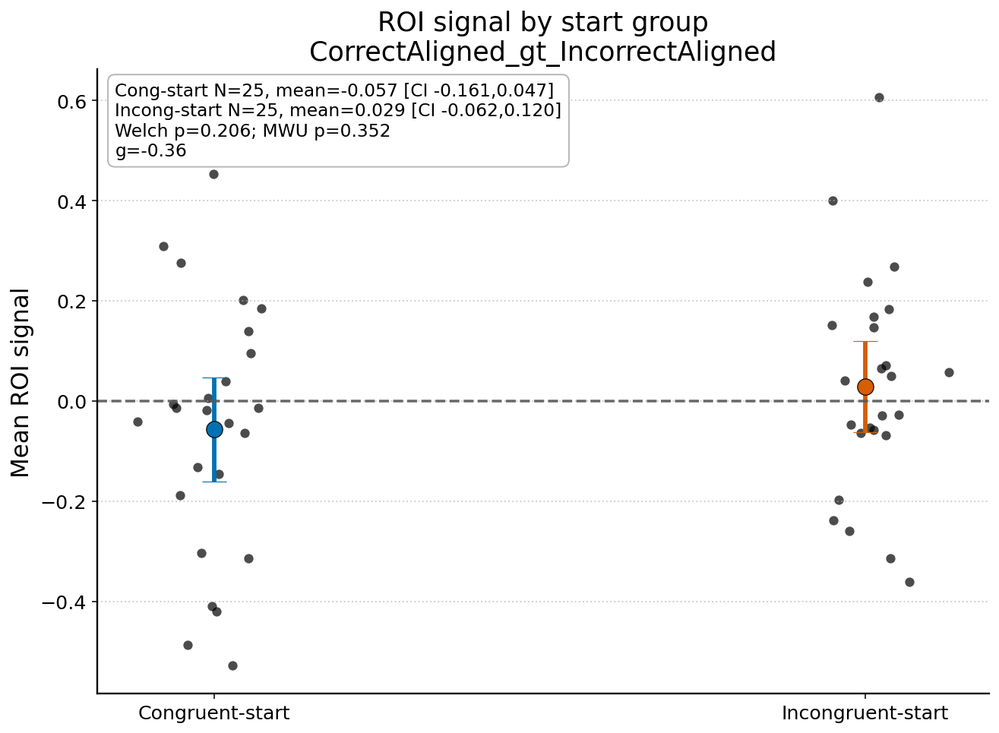

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Left_IFG_Neurosynth_atlas_CorrectAligned_gt_IncorrectAligned_StartGroups_Dots_MeanCI.jpeg


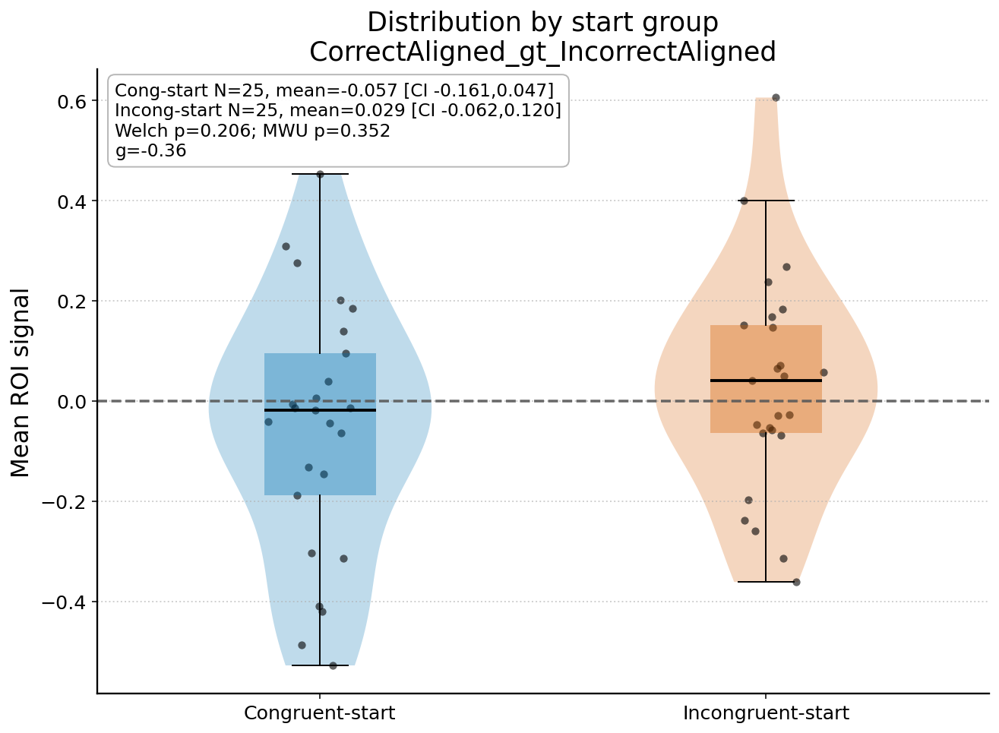

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Left_IFG_Neurosynth_atlas_CorrectAligned_gt_IncorrectAligned_StartGroups_ViolinBox.jpeg


In [62]:
import os
import re
import numpy as np
import nibabel as nib
from nilearn import input_data, plotting
from scipy import stats
import matplotlib.pyplot as plt

# ============================================================
# SUBJECT IDs by start group (numeric-only)
# ============================================================
CONGRUENT_START_IDS = [
    "004","005","010","011","012","017","020","022","025","027","028","029",
    "102","104","108","110","112","114","204","209","212","213","215","220","221"
]
INCONGRUENT_START_IDS = [
    "002","003","006","007","008","013","016","019","021","023","024","026","030",
    "101","116","117","119","121","124","201","205","207","211","214","219"
]

def normalize_to_digits3(s: str) -> str:
    """
    Returns a 3-digit subject code as a string (e.g., '002').
    Handles: 'FVsub-002', 'sub-FV002', 'FV002', '002', etc.
    """
    s = str(s).strip()
    m = re.search(r"\b(\d{3})\b", s)
    if m:
        return m.group(1)
    m = re.search(r"(\d+)", s)
    if not m:
        raise ValueError(f"Could not extract digits from subject id: {s}")
    digits = m.group(1)
    return digits[-3:].zfill(3)

def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x)) if n > 1 else np.nan
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df)) if n > 1 else np.nan
    half = tcrit * sem if n > 1 else np.nan
    return mean, (mean - half, mean + half)

def hedges_g(x1, x2):
    x1 = np.asarray(x1, dtype=float); x2 = np.asarray(x2, dtype=float)
    x1 = x1[~np.isnan(x1)]; x2 = x2[~np.isnan(x2)]
    n1, n2 = x1.size, x2.size
    if n1 < 2 or n2 < 2:
        return np.nan
    s1 = np.var(x1, ddof=1); s2 = np.var(x2, ddof=1)
    sp = np.sqrt(((n1 - 1)*s1 + (n2 - 1)*s2) / (n1 + n2 - 2))
    d = (np.mean(x1) - np.mean(x2)) / sp
    J = 1 - (3 / (4*(n1 + n2) - 9))
    return float(J * d)

# ============================================================
# SETTINGS: MUST match how you wrote the 4D file
# ============================================================
contrast_name = "CorrectAligned_gt_IncorrectAligned"  # <-- set correctly
roi_label = "Left IFG, Neurosynth atlas"

FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 18,
    "axes.labelsize": 16,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 12,
})

MEAN_COLOR_A = "#0072B2"   # blue
MEAN_COLOR_B = "#D55E00"   # orange
ZERO_COLOR = "0.35"

roi_slug = safe_filename(roi_label)
contrast_slug = safe_filename(contrast_name)

# ============================================================
# LOAD 4D + numeric subject order saved by builder script
# ============================================================
functional_img_path = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_name}_all_sub_4d.nii.gz")
subject_order_path = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_name}_all_sub_4d_subject_order.txt")

functional_img = nib.load(functional_img_path)

with open(subject_order_path, "r") as f:
    SUBJECT_ORDER = [normalize_to_digits3(line.strip()) for line in f if line.strip()]

print("Example SUBJECT_ORDER entries (digits):", SUBJECT_ORDER[:10])
print("N in SUBJECT_ORDER:", len(SUBJECT_ORDER))

if functional_img.shape[3] != len(SUBJECT_ORDER):
    raise ValueError(
        f"Mismatch: 4D has {functional_img.shape[3]} volumes but SUBJECT_ORDER has {len(SUBJECT_ORDER)} IDs."
    )

# ============================================================
# ROI overlay (optional)
# ============================================================
roi_mask_img = mask_img
display = plotting.plot_roi(roi_mask_img, anat_img, title=f"ROI Mask: {roi_label}", colorbar=False)
roi_out = os.path.join(FIG_DIR, f"{roi_slug}_ROIMaskOverlay.jpeg")
display.savefig(roi_out, dpi=600)
display.close()
print(f"[OK] Saved: {roi_out}")

# ============================================================
# Extract ROI means per subject (reduce resampling overhead)
# ============================================================
masker = input_data.NiftiMasker(
    mask_img=roi_mask_img,
    standardize=False,
    target_affine=functional_img.affine,
    target_shape=functional_img.shape[:3],
)
roi_vox = masker.fit_transform(functional_img)  # n_sub x n_vox
mean_signal = roi_vox.mean(axis=1)              # n_sub

# ============================================================
# Match groups to SUBJECT_ORDER (digits-only)
# ============================================================
sub_to_idx = {s: i for i, s in enumerate(SUBJECT_ORDER)}

cong_ids = [normalize_to_digits3(s) for s in CONGRUENT_START_IDS]
incong_ids = [normalize_to_digits3(s) for s in INCONGRUENT_START_IDS]

missing_cong = [s for s in cong_ids if s not in sub_to_idx]
missing_incong = [s for s in incong_ids if s not in sub_to_idx]
if missing_cong or missing_incong:
    print("[WARN] Some subjects were not present in the 4D file (excluded):")
    if missing_cong: print("  Missing congruent-start:", missing_cong)
    if missing_incong: print("  Missing incongruent-start:", missing_incong)

cong_idx = [sub_to_idx[s] for s in cong_ids if s in sub_to_idx]
incong_idx = [sub_to_idx[s] for s in incong_ids if s in sub_to_idx]

x_cong = np.asarray(mean_signal)[cong_idx].astype(float)
x_incong = np.asarray(mean_signal)[incong_idx].astype(float)

print(f"[INFO] Kept subjects: Congruent-start N={x_cong.size}, Incongruent-start N={x_incong.size}")

if x_cong.size == 0 or x_incong.size == 0:
    raise RuntimeError(
        "Empty group after matching. "
        "Check that you rebuilt the 4D + subject_order using the updated builder script, "
        "and that contrast_name matches."
    )

# ============================================================
# Stats: within-group vs 0 + between-group
# ============================================================
n1, n2 = x_cong.size, x_incong.size
m1, (ci1_lo, ci1_hi) = mean_ci_t(x_cong, 0.95)
m2, (ci2_lo, ci2_hi) = mean_ci_t(x_incong, 0.95)

t1, p1 = stats.ttest_1samp(x_cong, 0.0, nan_policy="omit")
t2, p2 = stats.ttest_1samp(x_incong, 0.0, nan_policy="omit")

t_welch, p_welch = stats.ttest_ind(x_cong, x_incong, equal_var=False, nan_policy="omit")
u_stat, p_u = stats.mannwhitneyu(x_cong, x_incong, alternative="two-sided")

g = hedges_g(x_cong, x_incong)

print("============================================================")
print(f"Contrast: {contrast_name}")
print(f"ROI: {roi_label}")
print("------------------------------------------------------------")
print(f"Congruent-start:   N={n1}, mean={m1:.4f}, 95% CI [{ci1_lo:.4f}, {ci1_hi:.4f}], t={float(t1):.3f}, p={float(p1):.4g}")
print(f"Incongruent-start: N={n2}, mean={m2:.4f}, 95% CI [{ci2_lo:.4f}, {ci2_hi:.4f}], t={float(t2):.3f}, p={float(p2):.4g}")
print("------------------------------------------------------------")
print(f"Between-group (Welch): t={float(t_welch):.3f}, p={float(p_welch):.4g}")
print(f"Between-group (MWU):   U={float(u_stat):.3f}, p={float(p_u):.4g}")
print(f"Effect size: Hedges g = {g:.3f}")
print("============================================================")

stats_text = (
    f"Cong-start N={n1}, mean={m1:.3f} [CI {ci1_lo:.3f},{ci1_hi:.3f}]\n"
    f"Incong-start N={n2}, mean={m2:.3f} [CI {ci2_lo:.3f},{ci2_hi:.3f}]\n"
    f"Welch p={float(p_welch):.3g}; MWU p={float(p_u):.3g}\n"
    f"g={g:.2f}"
)

# ============================================================
# Plot 1: jitter points + mean ± 95% CI
# ============================================================
fig1, ax1 = plt.subplots(figsize=(9.5, 7))
rng = np.random.default_rng(42)
xpos1 = 0 + rng.normal(0, 0.06, size=n1)
xpos2 = 1 + rng.normal(0, 0.06, size=n2)

ax1.scatter(xpos1, x_cong, color="black", alpha=0.7, s=40, linewidths=0)
ax1.scatter(xpos2, x_incong, color="black", alpha=0.7, s=40, linewidths=0)

ax1.errorbar(0, m1, yerr=[[m1 - ci1_lo],[ci1_hi - m1]], fmt="o",
             color=MEAN_COLOR_A, ecolor=MEAN_COLOR_A, elinewidth=3, capsize=8,
             markersize=11, markeredgecolor="black", markeredgewidth=0.6)
ax1.errorbar(1, m2, yerr=[[m2 - ci2_lo],[ci2_hi - m2]], fmt="o",
             color=MEAN_COLOR_B, ecolor=MEAN_COLOR_B, elinewidth=3, capsize=8,
             markersize=11, markeredgecolor="black", markeredgewidth=0.6)

ax1.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax1.set_xticks([0, 1])
ax1.set_xticklabels(["Congruent-start", "Incongruent-start"])
ax1.set_ylabel("Mean ROI signal")
ax1.set_title(f"ROI signal by start group\n{contrast_name}")

ax1.text(0.02, 0.98, stats_text, transform=ax1.transAxes,
         va="top", ha="left", fontsize=12,
         bbox=dict(boxstyle="round,pad=0.4", facecolor="white", edgecolor="0.7", alpha=0.95))

ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

plt.tight_layout()
out1 = os.path.join(FIG_DIR, f"{roi_slug}_{contrast_slug}_StartGroups_Dots_MeanCI.jpeg")
fig1.savefig(out1, dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out1}")

# ============================================================
# Plot 2: violin + box + points (distribution)
# ============================================================
# Guard: violinplot fails if any group is empty (we already error above),
# but keep a defensive check anyway.
fig2, ax2 = plt.subplots(figsize=(9.5, 7))
data = [x_cong, x_incong]

vp = ax2.violinplot(data, positions=[0, 1], showmeans=False, showextrema=False, showmedians=False)
for i, body in enumerate(vp["bodies"]):
    body.set_facecolor(MEAN_COLOR_A if i == 0 else MEAN_COLOR_B)
    body.set_edgecolor("none")
    body.set_alpha(0.25)

bp = ax2.boxplot(data, positions=[0, 1], widths=0.25, patch_artist=True, showfliers=False,
                 medianprops=dict(color="black", linewidth=2.0))
bp["boxes"][0].set(facecolor=MEAN_COLOR_A, alpha=0.35, edgecolor="none")
bp["boxes"][1].set(facecolor=MEAN_COLOR_B, alpha=0.35, edgecolor="none")

ax2.scatter(xpos1, x_cong, color="black", alpha=0.6, s=28, linewidths=0)
ax2.scatter(xpos2, x_incong, color="black", alpha=0.6, s=28, linewidths=0)

ax2.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax2.set_xticks([0, 1])
ax2.set_xticklabels(["Congruent-start", "Incongruent-start"])
ax2.set_ylabel("Mean ROI signal")
ax2.set_title(f"Distribution by start group\n{contrast_name}")

ax2.text(0.02, 0.98, stats_text, transform=ax2.transAxes,
         va="top", ha="left", fontsize=12,
         bbox=dict(boxstyle="round,pad=0.4", facecolor="white", edgecolor="0.7", alpha=0.95))

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

plt.tight_layout()
out2 = os.path.join(FIG_DIR, f"{roi_slug}_{contrast_slug}_StartGroups_ViolinBox.jpeg")
fig2.savefig(out2, dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out2}")

#### BES global score correlation - exploratory

[NiftiMasker.wrapped] Resampling images
[INFO] ROI data: N=50 subjects in 4D after dropping NaNs
[INFO] Survey bes_GLOBAL: N=49 subjects with numeric values
[INFO] Overlap ROI x bes_GLOBAL: N=47

Correlation results:
Pearson:  r = -0.063, p = 0.6759
Spearman: ρ = 0.109, p = 0.4671


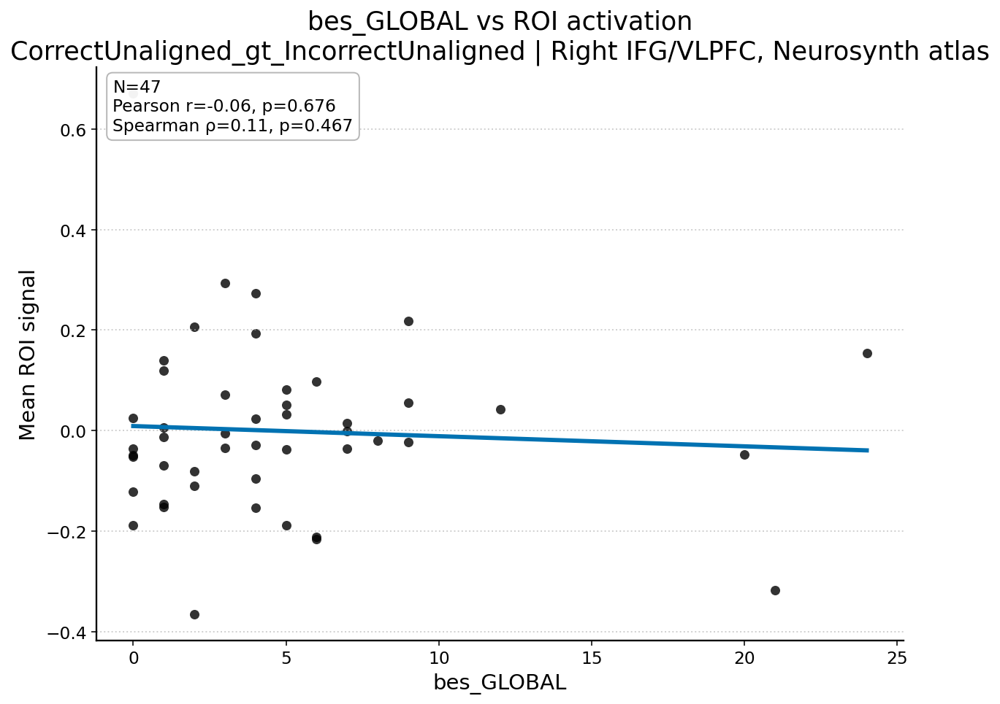

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Right_IFGVLPFC_Neurosynth_atlas_CorrectUnaligned_gt_IncorrectUnaligned_besGLOBAL_correlation.jpeg
[OK] Saved merged data table: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Right_IFGVLPFC_Neurosynth_atlas_CorrectUnaligned_gt_IncorrectUnaligned_besGLOBAL_roi_merged.csv


In [83]:
import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
from nilearn import input_data
from scipy import stats
import matplotlib.pyplot as plt

# ============================================================
# Helpers
# ============================================================
def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def normalize_to_digits3(s: str) -> str:
    """
    Canonical subject code: '002', '010', '221', etc.
    Works for: 2, '2', '002', 'FV002', 'sub-002', 'FVsub-002', etc.
    """
    s = str(s).strip()
    # Prefer exactly 3 digits if present
    m = re.search(r"\b(\d{3})\b", s)
    if m:
        return m.group(1)
    # Otherwise take digits, pad/clip to 3
    m = re.search(r"(\d+)", s)
    if not m:
        raise ValueError(f"Could not extract digits from subject id: {s}")
    digits = m.group(1)
    return digits[-3:].zfill(3)

# ============================================================
# SETTINGS
# ============================================================
contrast_key = "CorrectUnaligned_gt_IncorrectUnaligned"
roi_label = "Right IFG/VLPFC, Neurosynth atlas"

FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

# Survey file
survey_csv = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/data/survey_responses.csv"
survey_row_name = "bes_GLOBAL"   # row to use from the survey table

# Optional (recommended): subject order file if you have it.
# If you created the 4D with the builder that saves order, set this path.
subject_order_path = os.path.join(
    str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d_subject_order.txt"
)

# ============================================================
# 1) Extract mean ROI signal per subject
# ============================================================
functional_img_path = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d.nii.gz")
functional_img = nib.load(functional_img_path)

# Use your existing ROI mask object
roi_mask_img = mask_img

# Use target_affine/shape to reduce resampling surprises
masker = input_data.NiftiMasker(
    mask_img=roi_mask_img,
    standardize=False,
    target_affine=functional_img.affine,
    target_shape=functional_img.shape[:3],
)
roi_vox = masker.fit_transform(functional_img)          # (n_sub, n_vox)
roi_mean = np.asarray(roi_vox.mean(axis=1)).ravel()     # (n_sub,)

# Figure out subject IDs for each 4D volume
if os.path.exists(subject_order_path):
    with open(subject_order_path, "r") as f:
        subj_order = [normalize_to_digits3(line.strip()) for line in f if line.strip()]
    if len(subj_order) != functional_img.shape[3]:
        raise ValueError(
            f"Mismatch: 4D has {functional_img.shape[3]} volumes but subject_order has {len(subj_order)} IDs."
        )
else:
    raise FileNotFoundError(
        f"Missing subject order file needed to align ROI values to survey data:\n{subject_order_path}\n"
        "Create it when building the 4D image (recommended) or provide a SUBJECT_ORDER list."
    )

roi_df = pd.DataFrame({
    "subject": subj_order,
    "roi_mean": roi_mean.astype(float),
})
roi_df = roi_df.dropna(subset=["roi_mean"])

print(f"[INFO] ROI data: N={len(roi_df)} subjects in 4D after dropping NaNs")

# ============================================================
# 2) Load survey, pull bes_GLOBAL row, reshape to long (subject, score)
# ============================================================
survey_wide = pd.read_csv(survey_csv, sep=None, engine="python")  # auto-detect delimiter

# Ensure first column is the row labels (e.g., 'subject_ID', 'BMI', 'bes_GLOBAL', ...)
row_label_col = survey_wide.columns[0]
survey_wide = survey_wide.set_index(row_label_col)

if survey_row_name not in survey_wide.index:
    raise KeyError(f"Row '{survey_row_name}' not found in survey file. Available rows include: {survey_wide.index[:20].tolist()} ...")

bes_series = survey_wide.loc[survey_row_name]  # columns are subjects

# Build long DF: subject, bes_GLOBAL
survey_long = (
    bes_series
    .rename("bes_GLOBAL")
    .reset_index()
    .rename(columns={"index": "subject_raw"})
)

survey_long["subject"] = survey_long["subject_raw"].apply(normalize_to_digits3)
survey_long["bes_GLOBAL"] = pd.to_numeric(survey_long["bes_GLOBAL"], errors="coerce")
survey_long = survey_long.dropna(subset=["bes_GLOBAL"])

print(f"[INFO] Survey bes_GLOBAL: N={len(survey_long)} subjects with numeric values")

# ============================================================
# 3) Merge + run correlations
# ============================================================
merged = pd.merge(roi_df, survey_long[["subject", "bes_GLOBAL"]], on="subject", how="inner")
merged = merged.dropna(subset=["roi_mean", "bes_GLOBAL"])

n = len(merged)
print(f"[INFO] Overlap ROI x bes_GLOBAL: N={n}")

if n < 3:
    raise RuntimeError("Not enough overlapping subjects to compute correlation (need at least 3).")

x = merged["bes_GLOBAL"].to_numpy(dtype=float)
y = merged["roi_mean"].to_numpy(dtype=float)

# Pearson (linear association)
r, p_r = stats.pearsonr(x, y)

# Spearman (rank association; robust to outliers / nonlinearity)
rho, p_rho = stats.spearmanr(x, y)

print("\nCorrelation results:")
print(f"Pearson:  r = {r:.3f}, p = {p_r:.4g}")
print(f"Spearman: ρ = {rho:.3f}, p = {p_rho:.4g}")

# ============================================================
# 4) Plot: scatter + least-squares line + save
# ============================================================
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 18,
    "axes.labelsize": 15,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})

fig, ax = plt.subplots(figsize=(9, 7))

ax.scatter(x, y, color="black", alpha=0.8, s=45, linewidths=0)

# Regression line (simple linear fit)
slope, intercept = np.polyfit(x, y, 1)
xx = np.linspace(np.min(x), np.max(x), 200)
yy = slope * xx + intercept
ax.plot(xx, yy, color="#0072B2", linewidth=3)

ax.set_xlabel("bes_GLOBAL")
ax.set_ylabel("Mean ROI signal")
ax.set_title(f"bes_GLOBAL vs ROI activation\n{contrast_key} | {roi_label}")

stats_text = (
    f"N={n}\n"
    f"Pearson r={r:.2f}, p={p_r:.3g}\n"
    f"Spearman ρ={rho:.2f}, p={p_rho:.3g}"
)
ax.text(
    0.02, 0.98, stats_text,
    transform=ax.transAxes, va="top", ha="left",
    fontsize=12,
    bbox=dict(boxstyle="round,pad=0.35", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

plt.tight_layout()

fname = f"{safe_filename(roi_label)}_{safe_filename(contrast_key)}_besGLOBAL_correlation.jpeg"
out = os.path.join(FIG_DIR, fname)
fig.savefig(out, dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out}")

# Optional: save the merged table used for stats
merged_out = os.path.join(FIG_DIR, f"{safe_filename(roi_label)}_{safe_filename(contrast_key)}_besGLOBAL_roi_merged.csv")
merged.to_csv(merged_out, index=False)
print(f"[OK] Saved merged data table: {merged_out}")

#### BMI correlation - exploratory

[NiftiMasker.wrapped] Resampling images
[INFO] ROI data: N=50 subjects in 4D after dropping NaNs
[INFO] Survey BMI: N=52 subjects with numeric values
[INFO] Overlap ROI x BMI: N=50

Correlation results (BMI):
Pearson:  r = 0.069, p = 0.6364
Spearman: ρ = -0.087, p = 0.5501


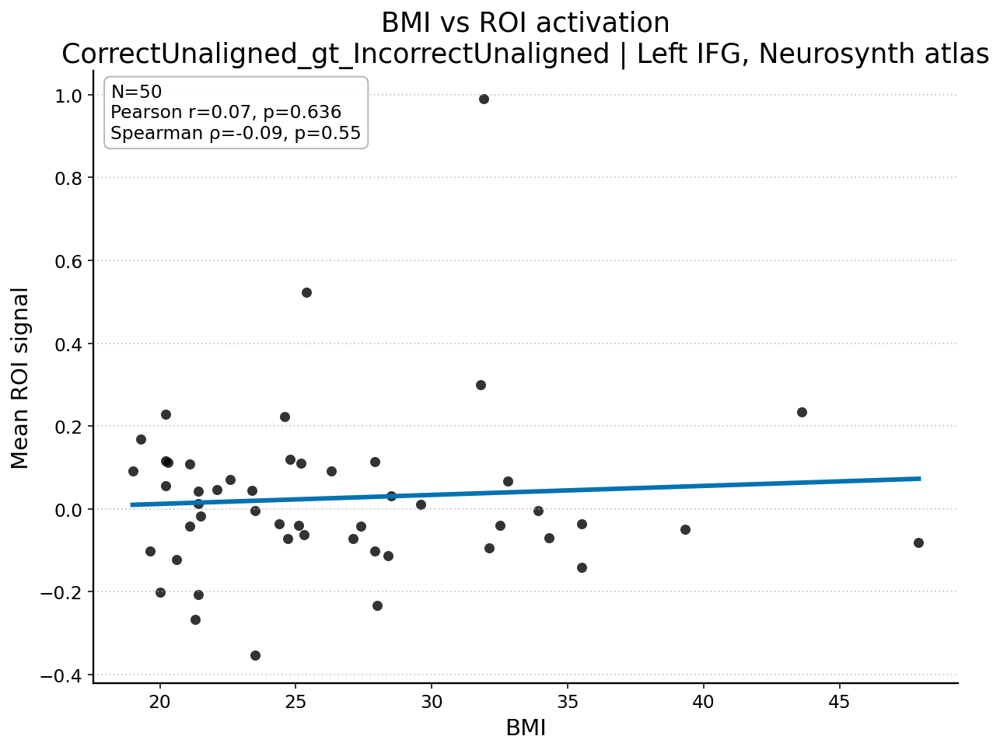

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Left_IFG_Neurosynth_atlas_CorrectUnaligned_gt_IncorrectUnaligned_BMI_correlation.jpeg
[OK] Saved merged data table: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/Left_IFG_Neurosynth_atlas_CorrectUnaligned_gt_IncorrectUnaligned_BMI_roi_merged.csv


In [86]:
import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
from nilearn import input_data
from scipy import stats
import matplotlib.pyplot as plt

# ============================================================
# Helpers
# ============================================================
def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def normalize_to_digits3(s: str) -> str:
    """
    Canonical subject code: '002', '010', '221', etc.
    Works for: 2, '2', '002', 'FV002', 'sub-002', 'FVsub-002', etc.
    """
    s = str(s).strip()
    m = re.search(r"\b(\d{3})\b", s)
    if m:
        return m.group(1)
    m = re.search(r"(\d+)", s)
    if not m:
        raise ValueError(f"Could not extract digits from subject id: {s}")
    digits = m.group(1)
    return digits[-3:].zfill(3)

# ============================================================
# SETTINGS
# ============================================================
contrast_key = "CorrectUnaligned_gt_IncorrectUnaligned"
roi_label = "Left IFG, Neurosynth atlas"

FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

# Survey file
survey_csv = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/data/survey_responses.csv"
survey_row_name = "BMI"   # <-- CHANGED from bes_GLOBAL to BMI

# Subject order file for 4D volume alignment
subject_order_path = os.path.join(
    str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d_subject_order.txt"
)

# ============================================================
# 1) Extract mean ROI signal per subject
# ============================================================
functional_img_path = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d.nii.gz")
functional_img = nib.load(functional_img_path)

roi_mask_img = mask_img

masker = input_data.NiftiMasker(
    mask_img=roi_mask_img,
    standardize=False,
    target_affine=functional_img.affine,
    target_shape=functional_img.shape[:3],
)
roi_vox = masker.fit_transform(functional_img)
roi_mean = np.asarray(roi_vox.mean(axis=1)).ravel()

# Load subject IDs for each 4D volume
if os.path.exists(subject_order_path):
    with open(subject_order_path, "r") as f:
        subj_order = [normalize_to_digits3(line.strip()) for line in f if line.strip()]
    if len(subj_order) != functional_img.shape[3]:
        raise ValueError(
            f"Mismatch: 4D has {functional_img.shape[3]} volumes but subject_order has {len(subj_order)} IDs."
        )
else:
    raise FileNotFoundError(
        f"Missing subject order file needed to align ROI values to survey data:\n{subject_order_path}\n"
        "Create it when building the 4D image (recommended) or provide a SUBJECT_ORDER list."
    )

roi_df = pd.DataFrame({
    "subject": subj_order,
    "roi_mean": roi_mean.astype(float),
}).dropna(subset=["roi_mean"])

print(f"[INFO] ROI data: N={len(roi_df)} subjects in 4D after dropping NaNs")

# ============================================================
# 2) Load survey, pull BMI row, reshape to long (subject, BMI)
# ============================================================
survey_wide = pd.read_csv(survey_csv, sep=None, engine="python")  # auto-detect delimiter

row_label_col = survey_wide.columns[0]
survey_wide = survey_wide.set_index(row_label_col)

if survey_row_name not in survey_wide.index:
    raise KeyError(
        f"Row '{survey_row_name}' not found in survey file. "
        f"Available rows include: {survey_wide.index[:30].tolist()} ..."
    )

bmi_series = survey_wide.loc[survey_row_name]  # columns are subjects

survey_long = (
    bmi_series
    .rename("BMI")
    .reset_index()
    .rename(columns={"index": "subject_raw"})
)

survey_long["subject"] = survey_long["subject_raw"].apply(normalize_to_digits3)
survey_long["BMI"] = pd.to_numeric(survey_long["BMI"], errors="coerce")
survey_long = survey_long.dropna(subset=["BMI"])

print(f"[INFO] Survey BMI: N={len(survey_long)} subjects with numeric values")

# ============================================================
# 3) Merge + run correlations
# ============================================================
merged = pd.merge(roi_df, survey_long[["subject", "BMI"]], on="subject", how="inner")
merged = merged.dropna(subset=["roi_mean", "BMI"])

n = len(merged)
print(f"[INFO] Overlap ROI x BMI: N={n}")

if n < 3:
    raise RuntimeError("Not enough overlapping subjects to compute correlation (need at least 3).")

x = merged["BMI"].to_numpy(dtype=float)
y = merged["roi_mean"].to_numpy(dtype=float)

r, p_r = stats.pearsonr(x, y)
rho, p_rho = stats.spearmanr(x, y)

print("\nCorrelation results (BMI):")
print(f"Pearson:  r = {r:.3f}, p = {p_r:.4g}")
print(f"Spearman: ρ = {rho:.3f}, p = {p_rho:.4g}")

# ============================================================
# 4) Plot: scatter + least-squares line + save
# ============================================================
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 18,
    "axes.labelsize": 15,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})

fig, ax = plt.subplots(figsize=(9, 7))
ax.scatter(x, y, color="black", alpha=0.8, s=45, linewidths=0)

slope, intercept = np.polyfit(x, y, 1)
xx = np.linspace(np.min(x), np.max(x), 200)
yy = slope * xx + intercept
ax.plot(xx, yy, color="#0072B2", linewidth=3)

ax.set_xlabel("BMI")
ax.set_ylabel("Mean ROI signal")
ax.set_title(f"BMI vs ROI activation\n{contrast_key} | {roi_label}")

stats_text = (
    f"N={n}\n"
    f"Pearson r={r:.2f}, p={p_r:.3g}\n"
    f"Spearman ρ={rho:.2f}, p={p_rho:.3g}"
)
ax.text(
    0.02, 0.98, stats_text,
    transform=ax.transAxes, va="top", ha="left",
    fontsize=12,
    bbox=dict(boxstyle="round,pad=0.35", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

plt.tight_layout()

fname = f"{safe_filename(roi_label)}_{safe_filename(contrast_key)}_BMI_correlation.jpeg"
out = os.path.join(FIG_DIR, fname)
fig.savefig(out, dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out}")

# Save merged table used for stats
merged_out = os.path.join(FIG_DIR, f"{safe_filename(roi_label)}_{safe_filename(contrast_key)}_BMI_roi_merged.csv")
merged.to_csv(merged_out, index=False)
print(f"[OK] Saved merged data table: {merged_out}")

# Decoupling (make sure to change paths at start)

In [34]:
def qc_inventory(output_dir: Path, subjects: list):
    rows = []
    for sub in subjects:
        sub_dir = output_dir / sub
        maps = find_maps_for_subject(output_dir, sub)
        dm = find_design_matrices(output_dir, sub)
        for contrast in CONTRASTS:
            row = {
                "sub": sub,
                "contrast": contrast,
                "has_z": int("z" in maps.get(contrast, {})),
                "has_t": int("t" in maps.get(contrast, {})),
                "has_effect": int("effect" in maps.get(contrast, {})),
                "has_variance": int("variance" in maps.get(contrast, {})),
                "n_design_matrices": len(dm),
                "sub_dir_exists": int(sub_dir.exists()),
            }
            rows.append(row)
    return pd.DataFrame(rows)

inv = qc_inventory(OUTPUT_DIR, SUBJECTS)
inv.head()

print("\nMissing z-maps (by contrast):")
missing = inv[inv["has_z"] == 0].groupby("contrast")["sub"].count().sort_values(ascending=False)
print(missing)

print("\nSubjects with 0 design matrices saved:")
print(inv.groupby("sub")["n_design_matrices"].max().loc[lambda s: s==0])




Missing z-maps (by contrast):
Series([], Name: sub, dtype: int64)

Subjects with 0 design matrices saved:
Series([], Name: n_design_matrices, dtype: int64)


## Uncorrected, set p whole brain map

In [35]:
# --- Display-only contrast label utilities (run before 2nd-level plotting cell) ---

def contrast_display_name(name: str) -> str:
    """Human-friendly contrast label for plots only (does not affect file lookup)."""
    return (name
            .replace("_gt_", " > ")
            .replace("Unaligned", "Incongruent")
            .replace("Aligned", "Congruent"))

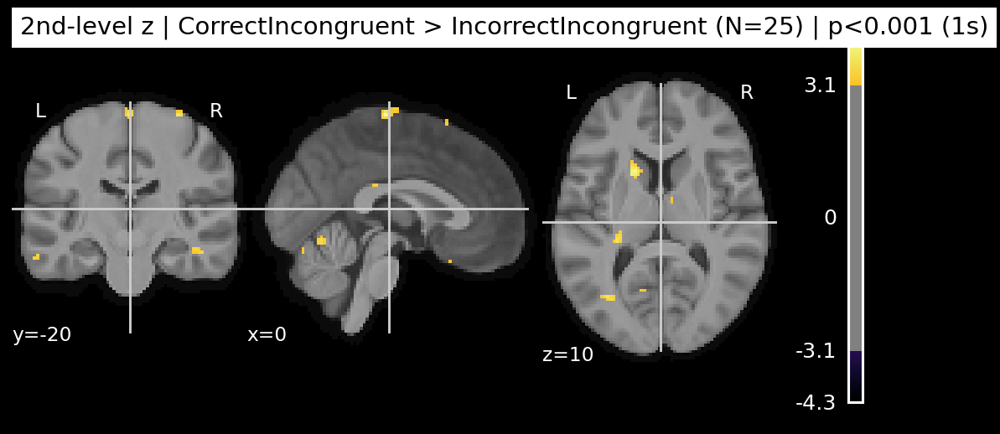

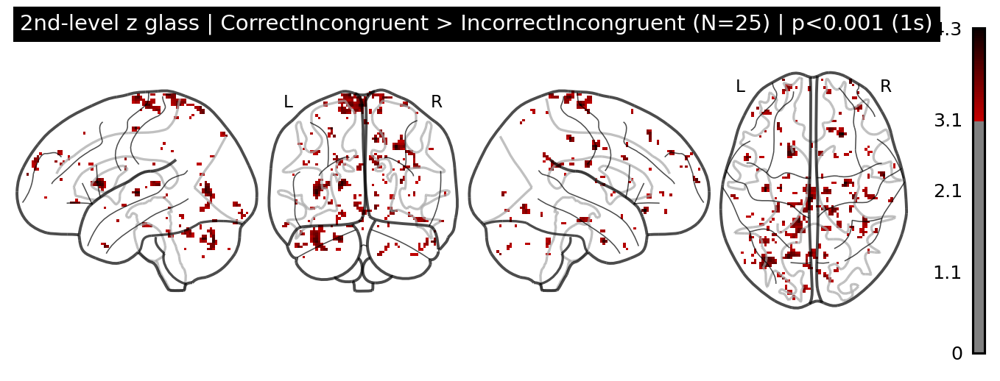

In [36]:
from pathlib import Path
import pandas as pd
from scipy.stats import norm

from nilearn.image import load_img
from nilearn.glm.second_level import SecondLevelModel
from nilearn.plotting import plot_stat_map, plot_glass_brain
import matplotlib.pyplot as plt

MEAN_ANAT = Path("/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/sub_average.nii.gz")
BG_IMG = str(MEAN_ANAT) if MEAN_ANAT.exists() else BG_IMG

def collect_existing_zmaps(output_dir: Path, subjects: list, contrast: str):
    paths = []
    for sub in subjects:
        p = output_dir / sub / f"{sub}_{contrast}_z.nii.gz"
        if p.exists():
            paths.append(str(p))
    return paths

def p_to_z(p, two_sided=True):
    return norm.isf(p / 2.0) if two_sided else norm.isf(p)

P_THR_MAIN  = 0.001
P_THR_GLASS = 0.001
TWO_SIDED = False

Z_THR_MAIN  = p_to_z(P_THR_MAIN,  two_sided=TWO_SIDED)
Z_THR_GLASS = p_to_z(P_THR_GLASS, two_sided=TWO_SIDED)

# --- choose what to run ---
# Option A: run ONE contrast
SELECT_CONTRASTS = ["CorrectUnaligned_gt_IncorrectUnaligned"]   # CorrectUnaligned_gt_IncorrectUnaligned

# Option B: run a subset
# SELECT_CONTRASTS = ["contrast1", "contrast2"]

# Option C: run all (current behavior)
# SELECT_CONTRASTS = CONTRASTS
# --------------------------

for contrast in SELECT_CONTRASTS:
    label = contrast_display_name(contrast)

    paths = collect_existing_zmaps(OUTPUT_DIR, SUBJECTS, contrast)
    if not paths:
        print(f"No z-maps found for contrast={label}")
        continue

    imgs = [load_img(p) for p in paths]
    design_matrix = pd.DataFrame({"intercept": [1] * len(imgs)})

    slm = SecondLevelModel(smoothing_fwhm=None).fit(imgs, design_matrix=design_matrix)
    z_map = slm.compute_contrast(second_level_contrast="intercept", output_type="z_score")

    plot_stat_map(
        z_map, bg_img=BG_IMG, cmap="inferno", threshold=Z_THR_MAIN,
        cut_coords=CUT_COORDS, display_mode=DISPLAY_MODE,
        title=f"2nd-level z | {label} (N={len(imgs)}) | p<{P_THR_MAIN} ({'2s' if TWO_SIDED else '1s'})"
    )
    plot_glass_brain(
        z_map, threshold=Z_THR_GLASS, display_mode="lyrz",
        title=f"2nd-level z glass | {label} (N={len(imgs)}) | p<{P_THR_GLASS} ({'2s' if TWO_SIDED else '1s'})"
    )
    plt.show()

    # Keep filenames based on the original contrast key (unchanged reference naming)
    z_map.to_filename(str(OUTPUT_DIR / f"secondlevel_{contrast}_z_DECOUPLED_FIRSTHALF.nii.gz"))

/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/numpy/_core/fromnumeric.py:867: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



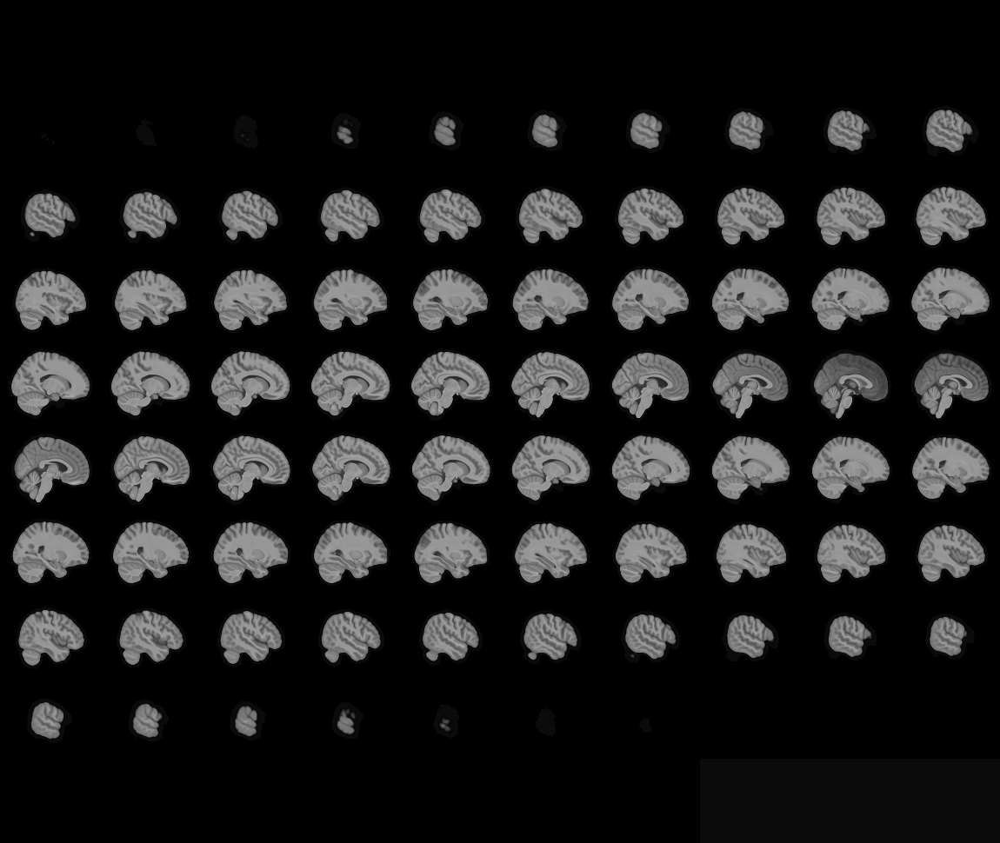
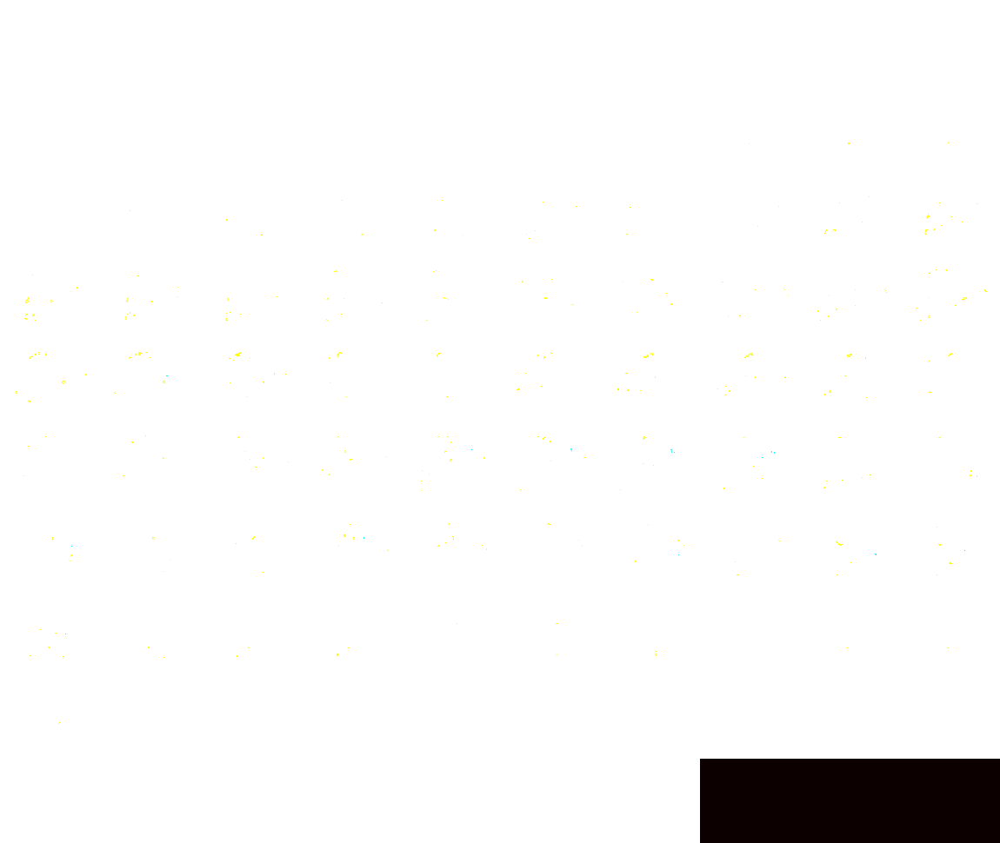

In [45]:
from nilearn.plotting import view_img

view = view_img(
    z_map,
    bg_img=BG_IMG,
    cmap="cold_hot",
    threshold=Z_THR_MAIN,     # keep your p<.001 threshold (already converted to z)
    symmetric_cmap=True
)
view  # in Jupyter: returning this object displays it inline

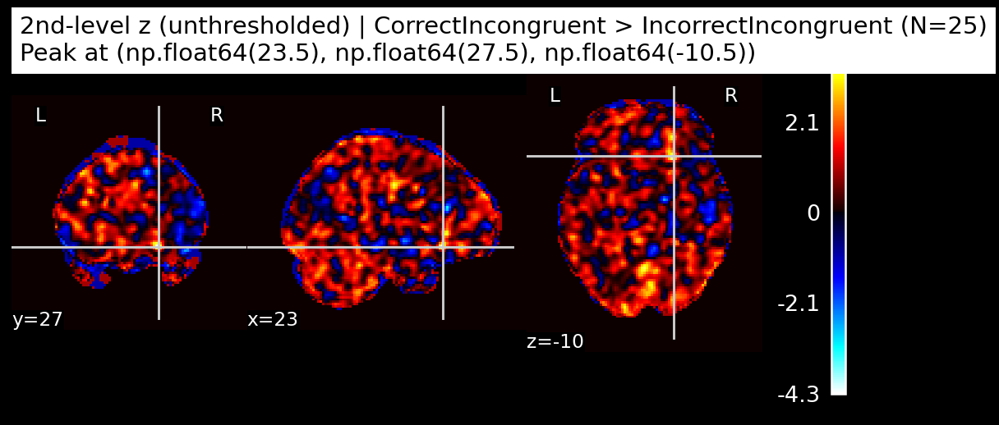

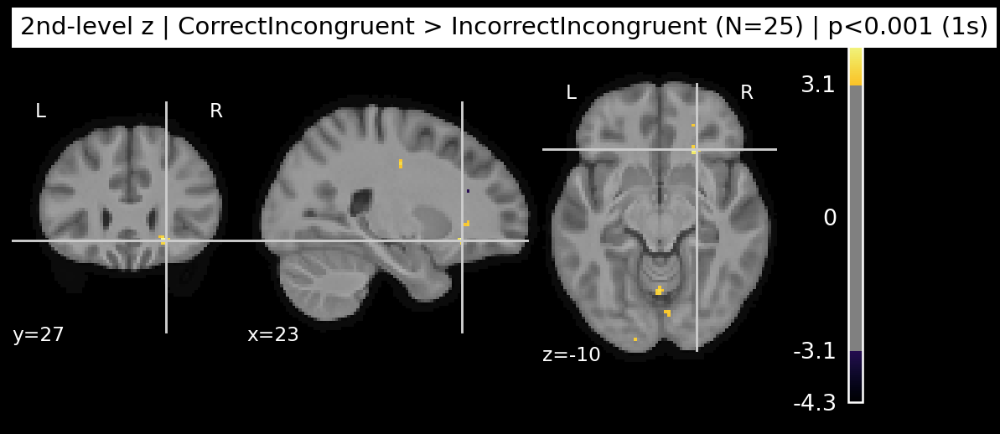

In [42]:
from nilearn.plotting import plot_stat_map
import numpy as np

# Find peak for automatic cut coords
z_data = z_map.get_fdata()
peak_ijk = np.unravel_index(np.nanargmax(np.abs(z_data)), z_data.shape)
peak_xyz = nib.affines.apply_affine(z_map.affine, peak_ijk)

# Unthresholded (or lightly thresholded) map for “where is signal” -- crosshairs go to strongest effect
plot_stat_map(
    z_map,
    bg_img=BG_IMG,
    display_mode="ortho",
    cut_coords=peak_xyz,
    cmap="cold_hot",
    symmetric_cbar=True,
    threshold=None,   # unthresholded overview
    title=f"2nd-level z (unthresholded) | {label} (N={len(imgs)})\nPeak at {tuple(np.round(peak_xyz, 1))}"
)
plt.show()

# Your inferential thresholded version (optional second panel)
plot_stat_map(
    z_map,
    bg_img=BG_IMG,
    display_mode="ortho",
    cut_coords=peak_xyz,
    cmap="inferno",
    threshold=Z_THR_MAIN,
    title=f"2nd-level z | {label} (N={len(imgs)}) | p<{P_THR_MAIN} ({'2s' if TWO_SIDED else '1s'})"
)
plt.show()

In [50]:
from nilearn import datasets, surface, plotting

fsavg = datasets.fetch_surf_fsaverage(mesh="fsaverage5")

# project volume -> surface
tex_l = surface.vol_to_surf(z_map, fsavg.pial_left)
tex_r = surface.vol_to_surf(z_map, fsavg.pial_right)

# Inline interactive viewers (rotatable) — display by evaluating the variables in a cell
view_l = plotting.view_surf(
    surf_mesh=fsavg.infl_left,     # inflated reads better; switch to fsavg.pial_left if you prefer
    surf_map=tex_l,
    cmap="cold_hot",
    symmetric_cmap=True,
    threshold=Z_THR_MAIN           # <-- your p<.001 threshold in z
)

view_r = plotting.view_surf(
    surf_mesh=fsavg.infl_right,
    surf_map=tex_r,
    cmap="cold_hot",
    symmetric_cmap=True,
    threshold=Z_THR_MAIN
)

view_l

/tmp/ipykernel_109520/1532525027.py:10: DeprecationWarning: The `darkness` parameter will be deprecated in release 0.13. We recommend setting `darkness` to None
  view_l = plotting.view_surf(
/tmp/ipykernel_109520/1532525027.py:18: DeprecationWarning: The `darkness` parameter will be deprecated in release 0.13. We recommend setting `darkness` to None
  view_r = plotting.view_surf(


In [51]:
view_r

## Making ROIs

Input Z map: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/secondlevel_CorrectUnaligned_gt_IncorrectUnaligned_z_DECOUPLED_FIRSTHALF.nii.gz
Uncorrected p<0.001 (two-sided) => |Z| >= 3.291
Positive clusters: 90 | Negative clusters: 4
ROI mask saved to: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/roi_mask_CorrectUnaligned_gt_IncorrectUnaligned_uncorrected_z_DECOUPLED_FIRSTHALF.nii.gz


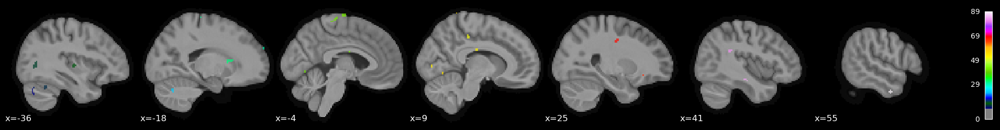

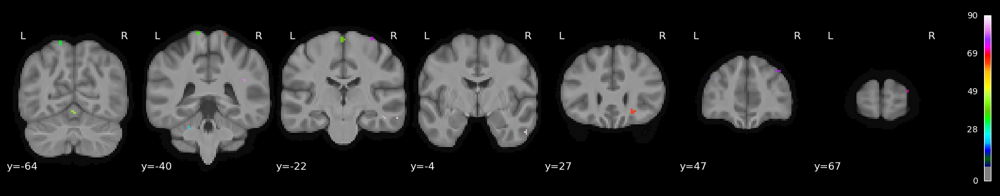

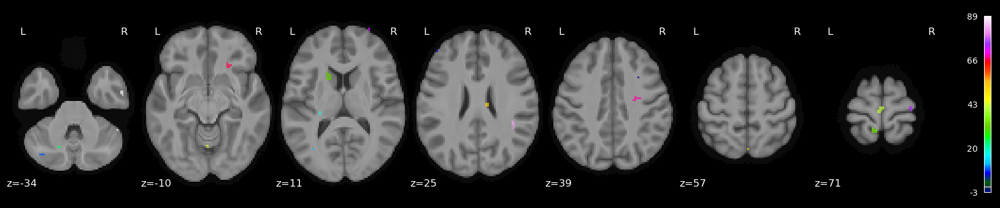

In [69]:
# pull out clusters from a Nilearn 2nd-level Z map (e.g., secondlevel_Value_z.nii.gz)

import os
import numpy as np
import nibabel as nib
from scipy import ndimage
from scipy.stats import norm
from nilearn import plotting

# --- inputs ---
stat_map_path = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/secondlevel_CorrectUnaligned_gt_IncorrectUnaligned_z_DECOUPLED_FIRSTHALF.nii.gz"
out_name = "roi_mask_CorrectUnaligned_gt_IncorrectUnaligned_uncorrected_z_DECOUPLED_FIRSTHALF.nii.gz"

# optional background for plots (must be defined if you plot)
# anat_mean = nib.load("/path/to/sub_average.nii.gz")

# --- load Z map ---
stat_img = nib.load(stat_map_path)
z = stat_img.get_fdata()

# --- choose an uncorrected p threshold and convert to |Z| threshold ---
p_unc = 0.001
two_sided = True
z_thr = norm.isf(p_unc / 2.0) if two_sided else norm.isf(p_unc)

# --- threshold to binary masks (use 1s/0s; don't write the threshold value into the mask) ---
pos_mask = z >= z_thr
neg_mask = z <= -z_thr if two_sided else np.zeros_like(pos_mask, dtype=bool)

# --- label clusters (connectivity defaults to 6-neighbor in 3D; can be changed if you want) ---
pos_labeled, n_pos = ndimage.label(pos_mask.astype(np.uint8))
neg_labeled, n_neg = ndimage.label(neg_mask.astype(np.uint8))

# signed labels: +1..+n_pos for positive clusters; -1..-n_neg for negative clusters
roi_mask_data = pos_labeled + (-neg_labeled)

roi_mask_img = nib.Nifti1Image(roi_mask_data.astype(np.int32), affine=stat_img.affine, header=stat_img.header)

# --- quick QC plots (comment out if you don't have anat_mean) ---
plotting.plot_roi(roi_mask_img, MEAN_ANAT, display_mode="x")
plotting.plot_roi(roi_mask_img, MEAN_ANAT, display_mode="y")
plotting.plot_roi(roi_mask_img, MEAN_ANAT, display_mode="z")

# --- save ---
os.makedirs(OUTPUT_DIR, exist_ok=True)
roi_mask_path = os.path.join(OUTPUT_DIR, 'ROI', out_name)
nib.save(roi_mask_img, roi_mask_path)

print(f"Input Z map: {stat_map_path}")
print(f"Uncorrected p<{p_unc} ({'two-sided' if two_sided else 'one-sided'}) => |Z| >= {z_thr:.3f}")
print(f"Positive clusters: {n_pos} | Negative clusters: {n_neg}")
print(f"ROI mask saved to: {roi_mask_path}")

/tmp/ipykernel_1070982/46585107.py:17: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  roi_mask_dil_image = image.new_img_like(stat_img, roi_mask_dil.astype(int))


Number of clusters is 73


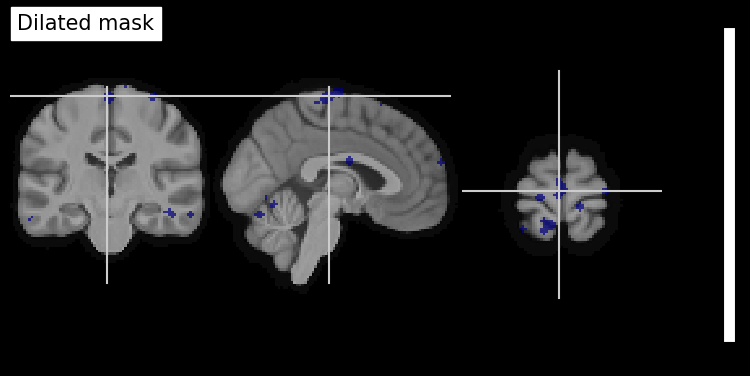

In [70]:
##using clusters about, perform dilation and then save clusters as separate ROI masks

import numpy as np
import os
import nibabel as nib
from nilearn import image, plotting
from scipy import ndimage

# dilation
# a common step to be sure not to forget voxels located on the edge of a ROI. 
# In other words, such operations can fill “holes” in masked voxel representations.

# Binary dilation to ensure no voxels are forgotten
roi_mask_dil = ndimage.binary_dilation(roi_mask_data)

# Visualize the dilated mask
roi_mask_dil_image = image.new_img_like(stat_img, roi_mask_dil.astype(int))
plotting.plot_roi(roi_mask_dil_image, MEAN_ANAT, title='Dilated mask', annotate=False)


# Identification of connected components
labels, n_labels = ndimage.label(roi_mask_dil)
print('Number of clusters is %s' % int(n_labels))

Skipped cluster 1, less than threshold
Skipped cluster 2, less than threshold
Skipped cluster 3, less than threshold
Skipped cluster 4, less than threshold
Skipped cluster 5, less than threshold
Skipped cluster 6, less than threshold
Skipped cluster 7, less than threshold


/tmp/ipykernel_1070982/2732165567.py:9: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  roi_img = image.new_img_like(stat_img, roi_data)


Skipped cluster 12, less than threshold
Skipped cluster 13, less than threshold
Skipped cluster 15, less than threshold
Skipped cluster 16, less than threshold
Skipped cluster 17, less than threshold
Skipped cluster 18, less than threshold
Skipped cluster 20, less than threshold
Skipped cluster 22, less than threshold
Skipped cluster 23, less than threshold
Skipped cluster 24, less than threshold
Skipped cluster 25, less than threshold
Skipped cluster 27, less than threshold
Skipped cluster 30, less than threshold
Skipped cluster 31, less than threshold
Skipped cluster 33, less than threshold
Skipped cluster 34, less than threshold
Skipped cluster 35, less than threshold
Skipped cluster 37, less than threshold
Skipped cluster 38, less than threshold
Skipped cluster 39, less than threshold
Skipped cluster 40, less than threshold
Skipped cluster 41, less than threshold
Skipped cluster 44, less than threshold
Skipped cluster 45, less than threshold
Skipped cluster 46, less than threshold


/home/acr69/.conda/envs/foodvaluation/lib/python3.14/site-packages/nilearn/plotting/displays/_slicers.py:184: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = plt.figure(figure, figsize=figsize, facecolor=facecolor)


Skipped cluster 71, less than threshold
Skipped cluster 73, less than threshold
ROI masks for individual clusters saved and visualized.


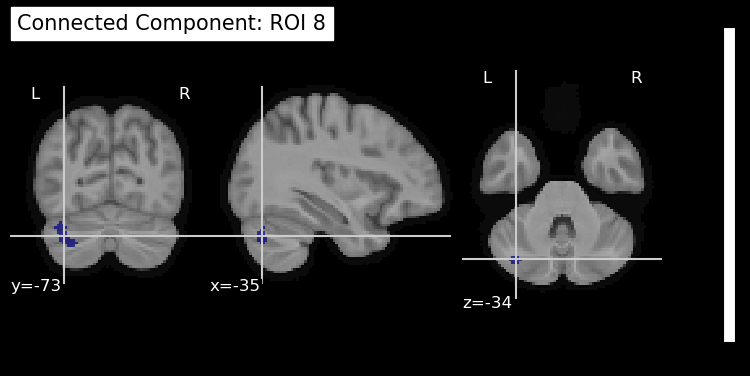

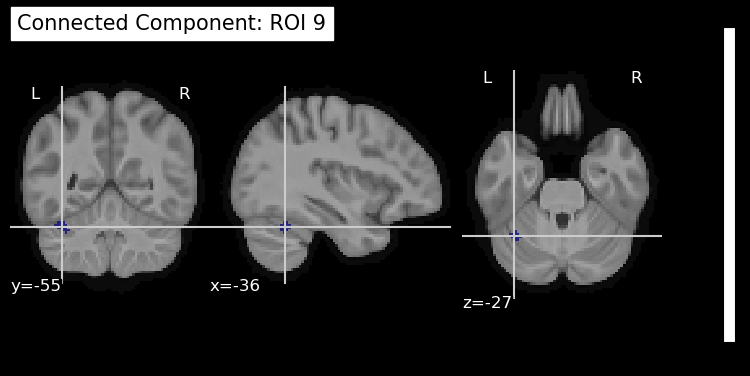

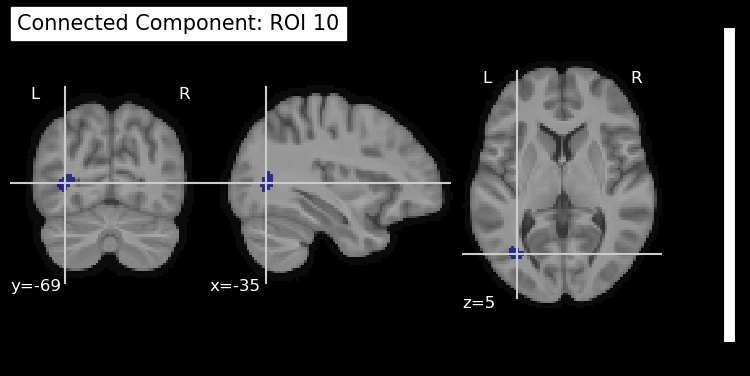

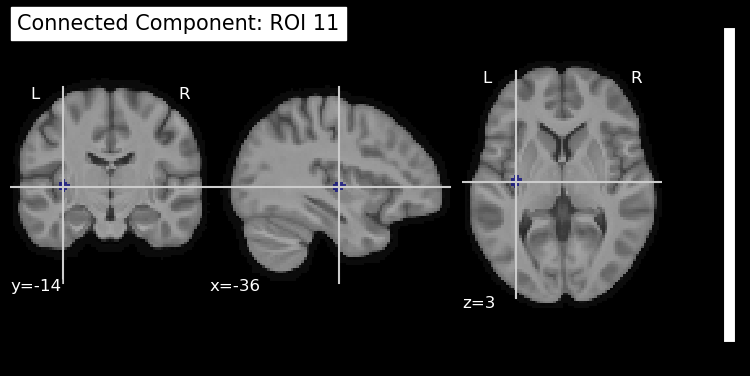

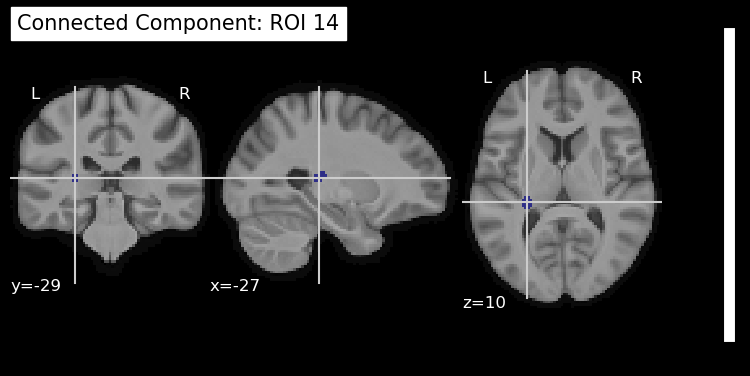

...

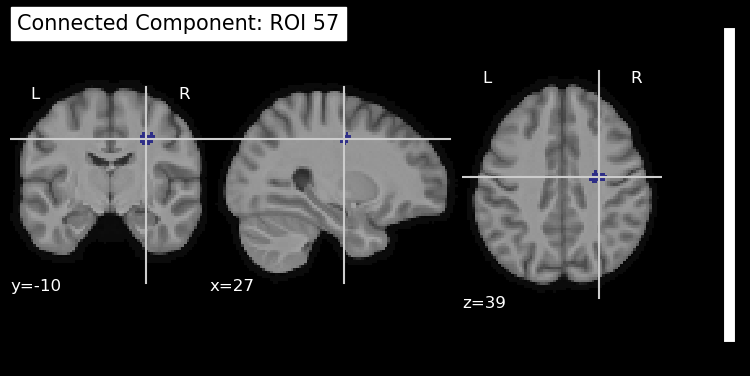

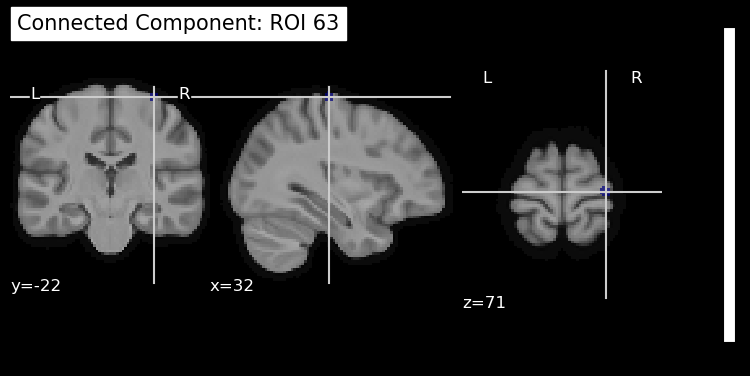

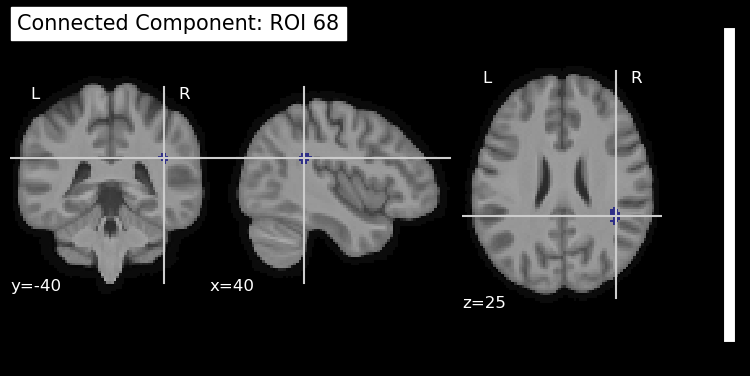

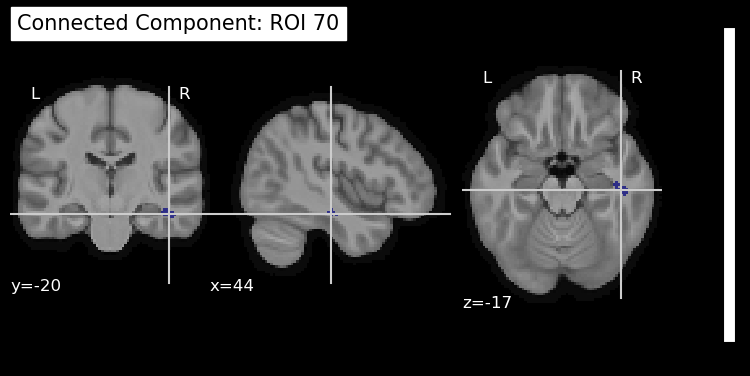

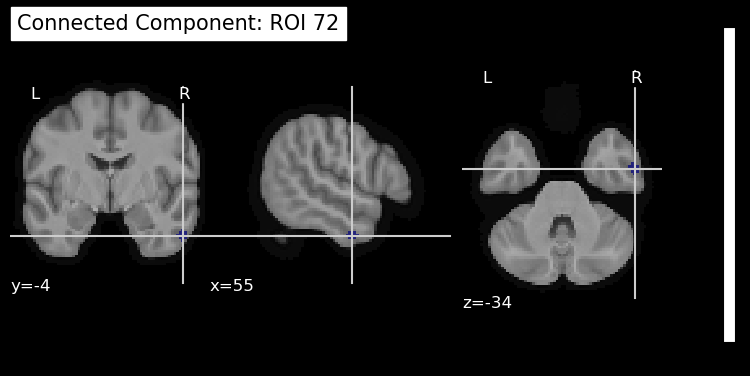

In [71]:
clusters = []
# Save each identified cluster as a separate ROI mask
for i in range(n_labels):
    # Create an individual ROI mask for each cluster
    roi_data = (labels == i + 1).astype(int)
    cluster_size = np.sum(roi_data)

    if cluster_size > 25:
        roi_img = image.new_img_like(stat_img, roi_data)
        
        # Save the ROI mask
        roi_img_path = os.path.join(OUTPUT_DIR, 'ROI', f'roi_{i+1}_uncorrected_DECOUPLED_FIRSTHALF.nii.gz')
        roi_img.to_filename(roi_img_path)
        
        # Visualize the ROI mask
        plotting.plot_roi(roi_img, MEAN_ANAT, title=f'Connected Component: ROI {i+1}')
        
        clusters.append(roi_img)
    else:
        print(f'Skipped cluster {i+1}, less than threshold')

print("ROI masks for individual clusters saved and visualized.")

## Concetate into 4D image

In [33]:
import os
from pathlib import Path
from nilearn.image import concat_imgs

firstlevel_dir = Path(OUTPUT_DIR)
contrast_name = "CorrectAligned_gt_IncorrectAligned"

SUBJECTS_DECOUPLED_TEST_GROUP = [
    "002", "019", "004", "021", "006", "007", "024", "010", "011", "012",
    "028", "016", "114", "102", "104", "119", "110", "116", "213", "204",
    "205", "207", "209", "211", "221"
]

def collect_firstlevel_contrasts(firstlevel_dir: Path, subjects: list, contrast: str):
    paths, missing = [], []

    for sid in subjects:
        sid = str(sid).zfill(3)
        sub_labels = [sid, f"sub-{sid}"]         # possible folder names
        file_labels = [sid, f"sub-{sid}"]        # possible filename prefixes

        found = None
        for sub_lab in sub_labels:
            for file_lab in file_labels:
                p = firstlevel_dir / sub_lab / f"{file_lab}_{contrast}_effect.nii.gz"
                if p.exists():
                    found = p
                    break
            if found:
                break

        if found:
            paths.append(str(found))
        else:
            # record the "most likely" expected path for debugging
            missing.append(str(firstlevel_dir / f"sub-{sid}" / f"sub-{sid}_{contrast}_effect.nii.gz"))

    return paths, missing

con_paths, missing = collect_firstlevel_contrasts(firstlevel_dir, SUBJECTS_DECOUPLED_TEST_GROUP, contrast_name)

print(f"Found {len(con_paths)} subject maps for {contrast_name} (decoupled_test_group)")
if missing:
    print("Missing (showing up to 10):")
    for m in missing[:10]:
        print("  ", m)

if len(con_paths) == 0:
    raise RuntimeError("No first-level contrast maps found; check folder naming and file naming under OUTPUT_DIR.")

con_imgs_4d = concat_imgs(con_paths)

out_4d_path = Path(OUTPUT_DIR) / f"none_glm_{contrast_name}_decoupled_test_group_4d.nii.gz"
out_4d_path.parent.mkdir(parents=True, exist_ok=True)
con_imgs_4d.to_filename(str(out_4d_path))
print(f"Saved 4D concatenated image to: {out_4d_path}")

functional_img_path = str(out_4d_path)
print("Use this as functional_img_path:", functional_img_path)

Found 25 subject maps for CorrectAligned_gt_IncorrectAligned (decoupled_test_group)
Saved 4D concatenated image to: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/none_glm_CorrectAligned_gt_IncorrectAligned_decoupled_test_group_4d.nii.gz
Use this as functional_img_path: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/none_glm_CorrectAligned_gt_IncorrectAligned_decoupled_test_group_4d.nii.gz


## Back to ROI!

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/MNI_14_31_47_ROIMaskOverlay.jpeg


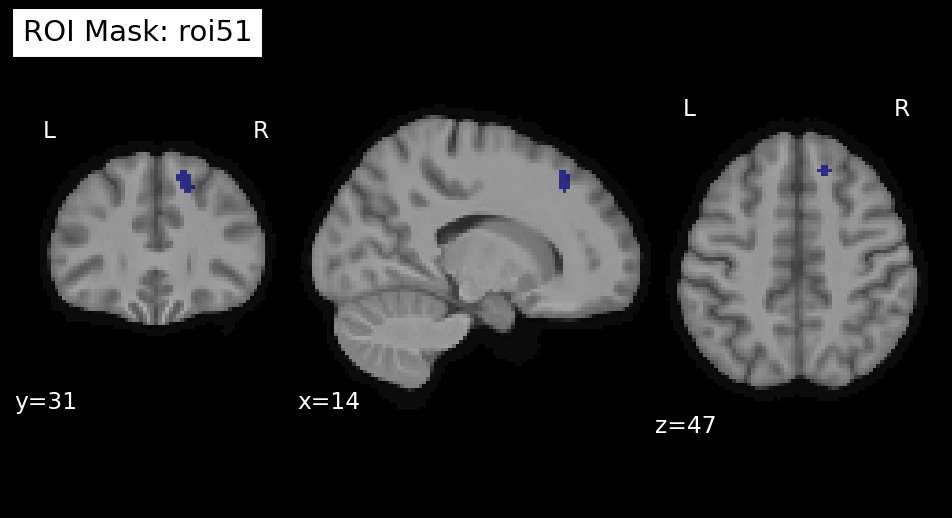


One-sample ROI test (decoupled validation sample)
Contrast (key): CorrectUnaligned_gt_IncorrectUnaligned
Contrast (label): CorrectIncongruent > IncorrectIncongruent
ROI: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/roi_51_uncorrected_DECOUPLED_FIRSTHALF.nii.gz
N subjects: 25
Mean ROI signal: 0.015231 (SD=0.162373, SEM=0.032475)
t(24) = 0.469, p(two-sided) = 0.6433
p(one-sided, mean>0) = 0.3216
Cohen's d = 0.094
95% CI for mean: [-0.051793, 0.082255]


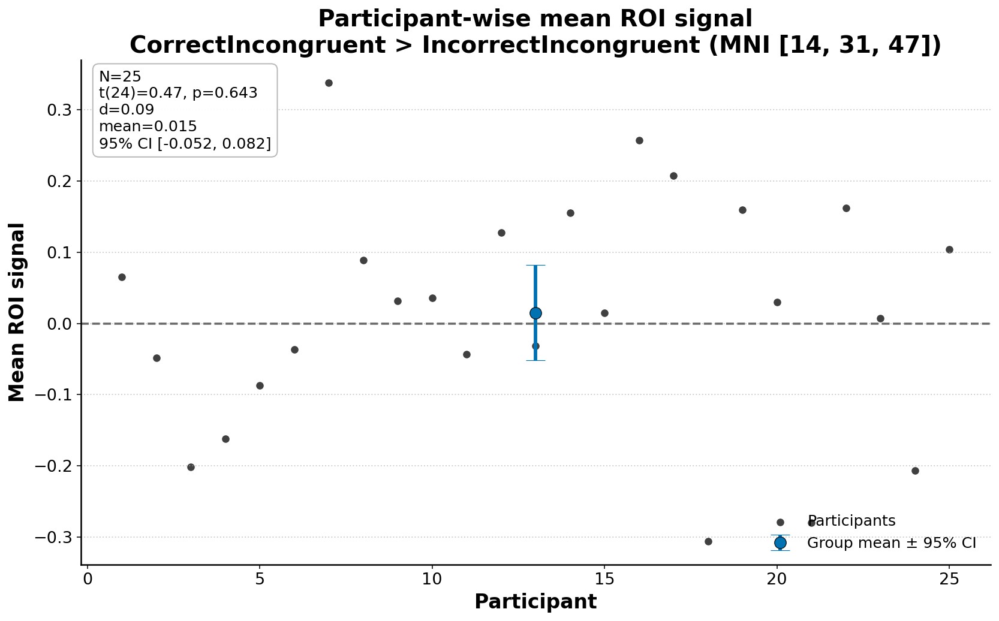

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/MNI_14_31_47_CorrectIncongruent_gt_IncorrectIncongruent_ParticipantScatter_MeanCI.jpeg


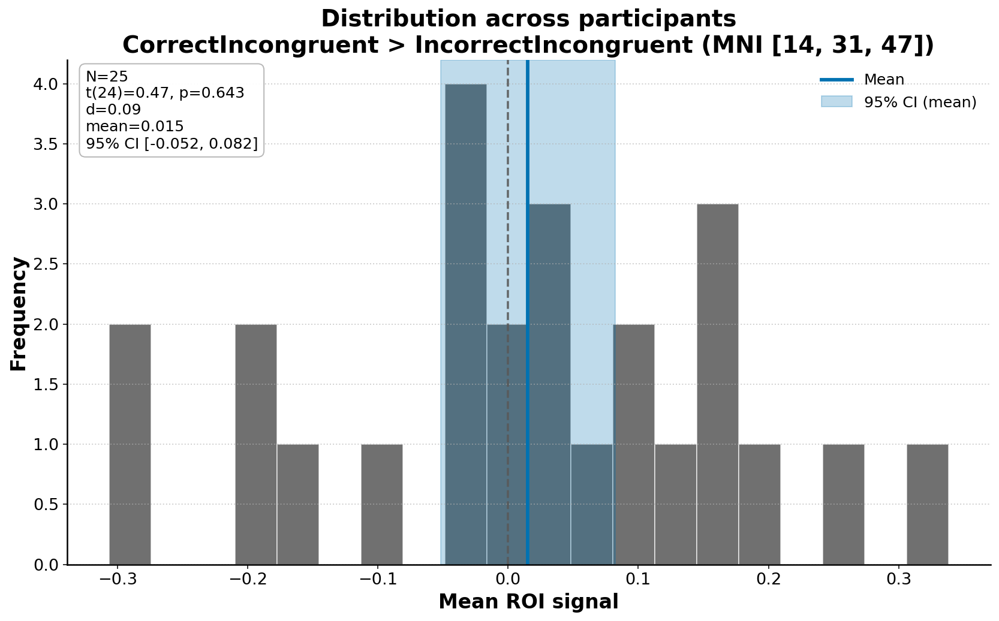

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/MNI_14_31_47_CorrectIncongruent_gt_IncorrectIncongruent_Histogram_MeanCI.jpeg


In [44]:
# Decoupled ROI test (roi51) — formatted + saved like your Atlas_Analyses_Figures script
# - High-def figures
# - ROI mask overlay saved (no colorbar)
# - One-sample t-test + Cohen's d + 95% CI
# - Two plots saved with consistent naming
#
# Saves to:
# /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures

import os
import re
import numpy as np
import nibabel as nib
from nilearn import input_data, plotting
from nilearn.image import load_img
from scipy import stats
import matplotlib.pyplot as plt

# -----------------------
# Helpers: stats + CI + effect size + filenames
# -----------------------
def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return mean, (mean - half, mean + half)

def cohens_d_onesample(x, mu0=0.0):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    sd = float(np.std(x, ddof=1))
    return float((np.mean(x) - mu0) / sd) if sd != 0 else np.nan

def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

# -----------------------
# Settings (readability)
# -----------------------
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 20,
    "axes.labelsize": 17,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 13,
    "axes.linewidth": 1.3,
})

MEAN_COLOR = "#0072B2"   # Okabe–Ito blue
ZERO_COLOR = "0.35"

# -----------------------
# Inputs
# -----------------------
contrast_key = "CorrectUnaligned_gt_IncorrectUnaligned"
functional_img_path = os.path.join(
    str(OUTPUT_DIR),
    "none_glm_CorrectUnaligned_gt_IncorrectUnaligned_decoupled_test_group_4d.nii.gz"
)
roi_mask_path = os.path.join(
    str(OUTPUT_DIR),
    "ROI",
    "roi_51_uncorrected_DECOUPLED_FIRSTHALF.nii.gz"
)

# Background for ROI overlay
anat_img = load_img(str(MEAN_ANAT))  # robust: ensures we pass an image, not a path

# Labels for filenames
try:
    contrast_label = contrast_display_name(contrast_key)
except NameError:
    contrast_label = contrast_key.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")

roi_label = "MNI [14, 31, 47]"
roi_slug = safe_filename(roi_label)
contrast_slug = safe_filename(contrast_label)

# -----------------------
# Output folder for figures
# -----------------------
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

# -----------------------
# Load data
# -----------------------
functional_img = nib.load(functional_img_path)
roi_mask_img = nib.load(roi_mask_path)

# -----------------------
# ROI mask overlay (SAVE; no colorbar)
# -----------------------
display = plotting.plot_roi(
    roi_mask_img,
    bg_img=anat_img,
    title=f"ROI Mask: {roi_label}",
    colorbar=False
)

roi_plot_title = "ROIMaskOverlay"
roi_out = os.path.join(FIG_DIR, f"{roi_slug}_{roi_plot_title}.jpeg")
display.savefig(roi_out, dpi=600)
display.close()
print(f"[OK] Saved: {roi_out}")

# plot ROI mask (inline display) ---
from nilearn import plotting
from nilearn.image import load_img

anat_img = load_img(str(MEAN_ANAT))  # or your existing anat_img
plotting.plot_roi(
    roi_mask_img,
    bg_img=anat_img,
    title="ROI Mask: roi51",
    display_mode="ortho",
    draw_cross=False,
    colorbar=False
)
plt.show()

# -----------------------
# Extract mean ROI signal per subject
# -----------------------
nifti_masker = input_data.NiftiMasker(mask_img=roi_mask_img, standardize=False)
roi_vox = nifti_masker.fit_transform(functional_img)  # (n_subjects, n_voxels)
mean_signal_per_subject = np.asarray(roi_vox.mean(axis=1)).ravel()

x = mean_signal_per_subject.astype(float)
x = x[~np.isnan(x)]

n = int(x.size)
df = n - 1

# -----------------------
# Group stats
# -----------------------
group_mean = float(np.mean(x))
group_sd = float(np.std(x, ddof=1))
group_sem = float(stats.sem(x))

t_statistic, p_value = stats.ttest_1samp(x, 0.0, nan_policy="omit")
t_statistic = float(t_statistic)
p_value = float(p_value)

d = cohens_d_onesample(x, mu0=0.0)
_, (ci_lo, ci_hi) = mean_ci_t(x, confidence=0.95)

# Optional one-sided p if you truly pre-registered mean>0
p_value_1s_gt0 = (p_value / 2.0) if (t_statistic > 0) else (1.0 - p_value / 2.0)

print("\nOne-sample ROI test (decoupled validation sample)")
print(f"Contrast (key): {contrast_key}")
print(f"Contrast (label): {contrast_label}")
print(f"ROI: {roi_mask_path}")
print(f"N subjects: {n}")
print(f"Mean ROI signal: {group_mean:.6f} (SD={group_sd:.6f}, SEM={group_sem:.6f})")
print(f"t({df}) = {t_statistic:.3f}, p(two-sided) = {p_value:.4g}")
print(f"p(one-sided, mean>0) = {p_value_1s_gt0:.4g}")
print(f"Cohen's d = {d:.3f}")
print(f"95% CI for mean: [{ci_lo:.6f}, {ci_hi:.6f}]")

stats_text = (
    f"N={n}\n"
    f"t({df})={t_statistic:.2f}, p={p_value:.3g}\n"
    f"d={d:.2f}\n"
    f"mean={group_mean:.3f}\n"
    f"95% CI [{ci_lo:.3f}, {ci_hi:.3f}]"
)

# -----------------------
# Plot 1: participant points + mean ± 95% CI (SAVE)
# -----------------------
fig1, ax1 = plt.subplots(figsize=(12, 7.5))
x_subjects = np.arange(1, n + 1)

ax1.scatter(
    x_subjects, x,
    color="black", alpha=0.75, s=42, linewidths=0,
    label="Participants"
)

ax1.errorbar(
    x=float(np.mean(x_subjects)),
    y=group_mean,
    yerr=np.array([[group_mean - ci_lo], [ci_hi - group_mean]]),
    fmt="o",
    color=MEAN_COLOR,
    ecolor=MEAN_COLOR,
    elinewidth=3.0,
    capsize=8,
    markersize=10,
    markeredgecolor="black",
    markeredgewidth=0.6,
    label="Group mean ± 95% CI"
)

ax1.axhline(y=0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax1.set_xlabel("Participant")
ax1.set_ylabel("Mean ROI signal")

plot1_title = "ParticipantScatter_MeanCI"
ax1.set_title(f"Participant-wise mean ROI signal\n{contrast_label} ({roi_label})")

ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

ax1.text(
    0.02, 0.98, stats_text,
    transform=ax1.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax1.legend(frameon=False, loc="lower right")
plt.tight_layout()

fname1 = f"{roi_slug}_{contrast_slug}_{plot1_title}.jpeg"
out1 = os.path.join(FIG_DIR, fname1)
fig1.savefig(out1, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out1}")

# -----------------------
# Plot 2: histogram + mean and CI (SAVE)
# -----------------------
fig2, ax2 = plt.subplots(figsize=(12, 7.5))

ax2.hist(x, bins=20, color="0.25", alpha=0.75, edgecolor="white", linewidth=0.8)
ax2.axvline(x=0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)

ax2.axvline(group_mean, color=MEAN_COLOR, linewidth=3.0, label="Mean")
ax2.axvspan(ci_lo, ci_hi, color=MEAN_COLOR, alpha=0.25, label="95% CI (mean)")

ax2.set_xlabel("Mean ROI signal")
ax2.set_ylabel("Frequency")

plot2_title = "Histogram_MeanCI"
ax2.set_title(f"Distribution across participants\n{contrast_label} ({roi_label})")

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

ax2.text(
    0.02, 0.98, stats_text,
    transform=ax2.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax2.legend(frameon=False, loc="upper right")
plt.tight_layout()

fname2 = f"{roi_slug}_{contrast_slug}_{plot2_title}.jpeg"
out2 = os.path.join(FIG_DIR, fname2)
fig2.savefig(out2, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out2}")

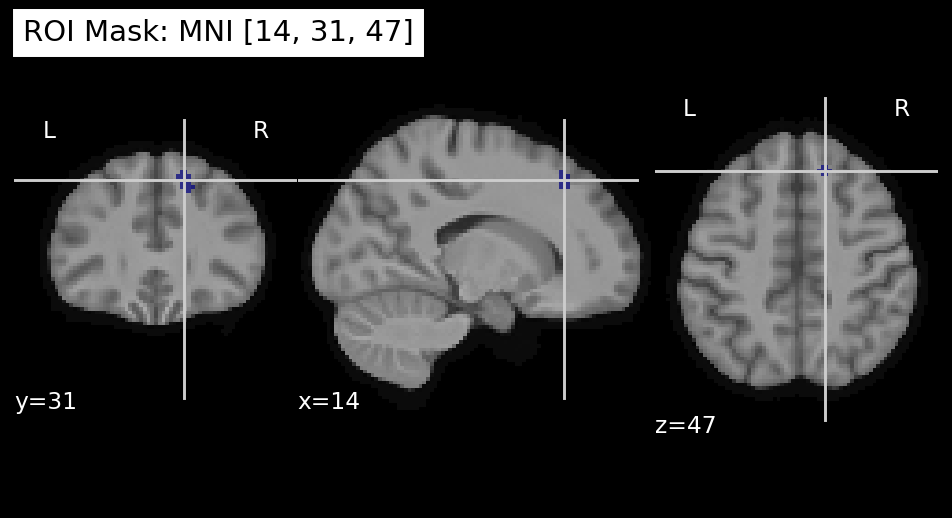

[OK] Saved ROI overlay (ortho): /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/MNI_14_31_47_ROIMaskOverlay_Ortho.jpeg

=== Violin: One-sample t-test vs 0 ===
Contrast key: CorrectUnaligned_gt_IncorrectUnaligned
Contrast label: CorrectIncongruent > IncorrectIncongruent
ROI: MNI [14, 31, 47]
N = 25
Mean = 0.015231 | SD = 0.162373 | SEM = 0.032475
t(24) = 0.469020, p = 0.643288
Cohen's d = 0.093804
95% CI(mean) = [-0.051793, 0.082255]


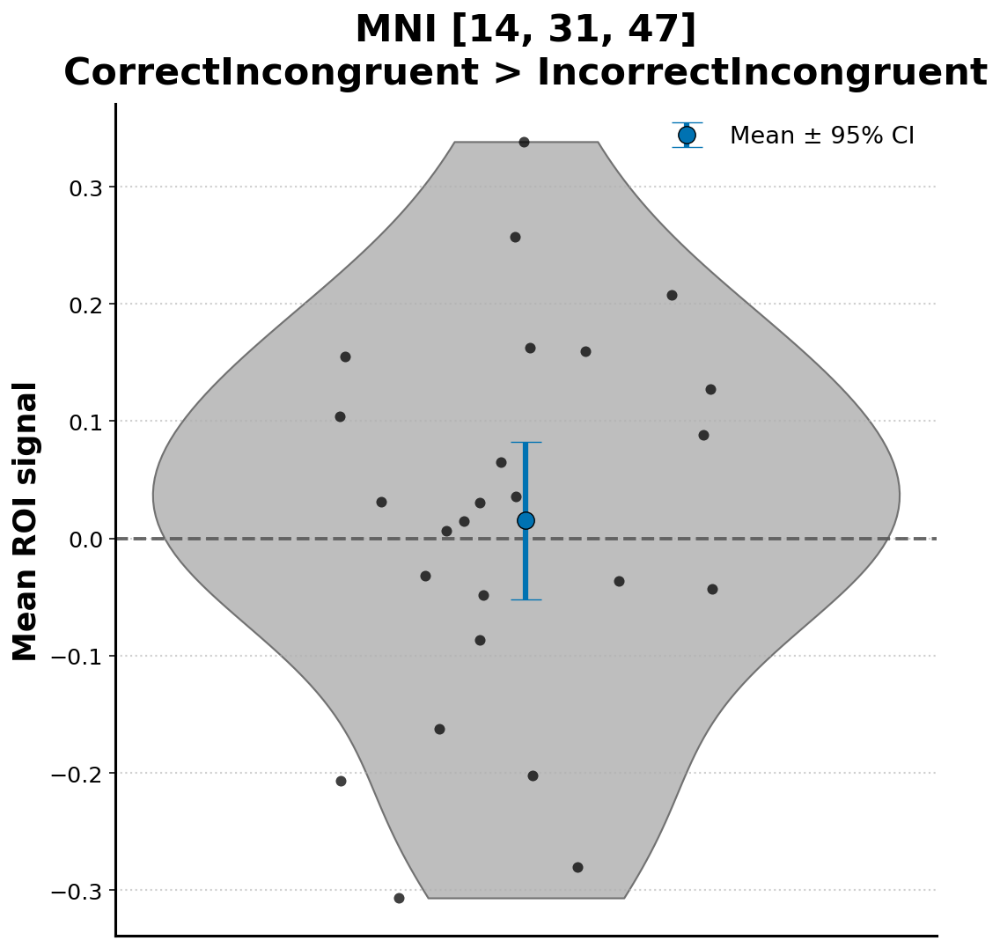

[OK] Saved violin: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/MNI_14_31_47_CorrectIncongruent_gt_IncorrectIncongruent_ViolinPoints_MeanCI.jpeg
[INFO] CorrectUnaligned: 25 subjects, 40 voxels
[INFO] IncorrectUnaligned: 25 subjects, 40 voxels
[INFO] CorrectAligned: 25 subjects, 40 voxels
[INFO] IncorrectAligned: 25 subjects, 40 voxels

=== Paired t-test (Incongruent) ===
CorrectUnaligned vs IncorrectUnaligned
N = 25
Mean(CorrectUnaligned) = -0.007223
Mean(IncorrectUnaligned) = -0.022461
Mean diff (CorrectUnaligned - IncorrectUnaligned) = 0.015238
95% CI(diff) = [-0.051790, 0.082267]
t(24) = 0.469211, p = 0.643153
d_z = 0.093842

=== Paired t-test (Congruent) ===
CorrectAligned vs IncorrectAligned
N = 25
Mean(CorrectAligned) = 0.031344
Mean(IncorrectAligned) = 0.020828
Mean diff (CorrectAligned - IncorrectAligned) = 0.010516
95% CI(diff) = [-0.063497, 0.084529]
t(24) = 0.293244, p = 0.771856
d_z = 0.058649


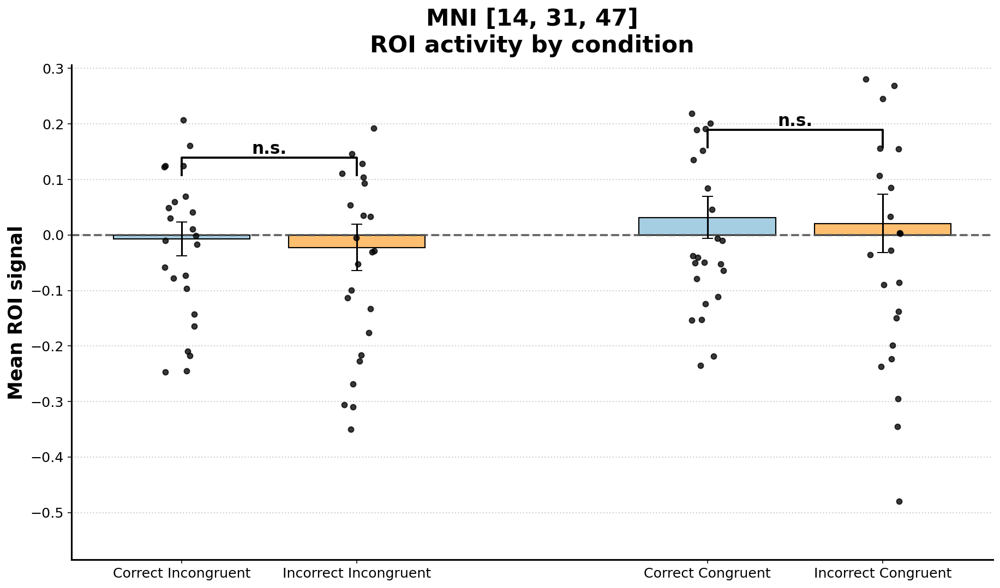

[OK] Saved 2x2 bars: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/MNI_14_31_47_Combined_2x2BarsPoints_SigStars_DisplayLabels.jpeg


In [45]:
import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
import seaborn as sns
import matplotlib.pyplot as plt

from nilearn import plotting
from nilearn.maskers import NiftiMasker
from scipy import stats


# ============================================================
# Helpers
# ============================================================
def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def condition_display_name(name: str) -> str:
    # Match your earlier nomenclature:
    # CorrectAligned -> Correct Congruent
    # CorrectUnaligned -> Correct Incongruent
    s = name.replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")
    s = "".join((" " + c if c.isupper() and i > 0 and (not s[i-1].isupper()) else c)
                for i, c in enumerate(s))
    return " ".join(s.split())

def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return mean, (mean - half, mean + half)

def mean_ci_paired(diff, confidence=0.95):
    diff = np.asarray(diff, dtype=float)
    diff = diff[~np.isnan(diff)]
    n = diff.size
    m = float(np.mean(diff))
    sem = float(stats.sem(diff))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return m, (m - half, m + half)

def cohens_d_onesample(x, mu0=0.0):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    return float((np.mean(x) - mu0) / np.std(x, ddof=1))

def p_to_stars(p: float) -> str:
    if p < 1e-4:
        return "****"
    if p < 1e-3:
        return "***"
    if p < 1e-2:
        return "**"
    if p < 5e-2:
        return "*"
    return "n.s."

def add_sig_bracket(ax, x1, x2, y, h, text, lw=2.0, color="black", fontsize=16, fontweight="bold"):
    ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=lw, c=color, clip_on=False)
    ax.text((x1 + x2) / 2, y + h, text, ha="center", va="bottom",
            color=color, fontsize=fontsize, fontweight=fontweight)

def extract_condition_means(masker, img_paths: dict):
    means = {}
    for key, path in img_paths.items():
        img = nib.load(path)
        roi_data = masker.transform(img)  # n_subjects x n_voxels
        means[key] = np.asarray(roi_data.mean(axis=1)).ravel().astype(float)
        print(f"[INFO] {key}: {roi_data.shape[0]} subjects, {roi_data.shape[1]} voxels")
    return means

def paired_test(means_dict, condA, condB, label):
    a = means_dict[condA].astype(float)
    b = means_dict[condB].astype(float)

    n = min(len(a), len(b))
    a = a[:n]
    b = b[:n]

    mask = (~np.isnan(a)) & (~np.isnan(b))
    a = a[mask]
    b = b[mask]
    n = a.size
    df = n - 1

    diff = a - b
    t_stat, p_val = stats.ttest_rel(a, b, nan_policy="omit")
    t_stat = float(t_stat)
    p_val = float(p_val)

    sd_diff = float(np.std(diff, ddof=1))
    dz = float(np.mean(diff) / sd_diff) if sd_diff != 0 else np.nan
    mean_diff, (ci_lo, ci_hi) = mean_ci_paired(diff, confidence=0.95)

    print(f"\n=== Paired t-test ({label}) ===")
    print(f"{condA} vs {condB}")
    print(f"N = {n}")
    print(f"Mean({condA}) = {float(np.mean(a)):.6f}")
    print(f"Mean({condB}) = {float(np.mean(b)):.6f}")
    print(f"Mean diff ({condA} - {condB}) = {mean_diff:.6f}")
    print(f"95% CI(diff) = [{ci_lo:.6f}, {ci_hi:.6f}]")
    print(f"t({df}) = {t_stat:.6f}, p = {p_val:.6g}")
    print(f"d_z = {dz:.6f}")

    return {"condA": condA, "condB": condB, "n": n, "df": df, "t": t_stat, "p": p_val, "dz": dz}


# ============================================================
# Style (bigger/bolder, easier to read)
# ============================================================
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 22,
    "axes.titleweight": "bold",
    "axes.labelsize": 18,
    "axes.labelweight": "bold",
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 14,
    "axes.linewidth": 1.6,
})

MEAN_COLOR = "#0072B2"
ZERO_COLOR = "0.35"
VIOLIN_COLOR = "#BEBEBE"

COND_COLORS = {
    "CorrectUnaligned":   "#A6CEE3",
    "IncorrectUnaligned": "#FDBF6F",
    "CorrectAligned":     "#A6CEE3",
    "IncorrectAligned":   "#FDBF6F",
}


# ============================================================
# User settings (assumes OUTPUT_DIR, mask_img, anat_img exist)
# ============================================================
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

roi_label = "MNI [14, 31, 47]"
roi_slug = safe_filename(roi_label)

contrast_key_a = "CorrectUnaligned_gt_IncorrectUnaligned"
try:
    contrast_label_a = contrast_display_name(contrast_key_a)
except NameError:
    contrast_label_a = contrast_key_a.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")
contrast_slug_a = safe_filename(contrast_label_a)

functional_img_path_a = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_key_a}_decoupled_test_group_4d.nii.gz")

img_paths_incong = {
    "CorrectUnaligned": os.path.join(str(OUTPUT_DIR), "none_glm_CorrectUnaligned_decoupled_test_group_4d.nii.gz"),
    "IncorrectUnaligned": os.path.join(str(OUTPUT_DIR), "none_glm_IncorrectUnaligned_decoupled_test_group_4d.nii.gz"),
}
img_paths_cong = {
    "CorrectAligned": os.path.join(str(OUTPUT_DIR), "none_glm_CorrectAligned_decoupled_test_group_4d.nii.gz"),
    "IncorrectAligned": os.path.join(str(OUTPUT_DIR), "none_glm_IncorrectAligned_decoupled_test_group_4d.nii.gz"),
}


# ============================================================
# Masker (same behavior as your prior scripts)
# ============================================================
roi_mask_img = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/roi_51_uncorrected_DECOUPLED_FIRSTHALF.nii.gz"
masker = NiftiMasker(mask_img=roi_mask_img, standardize=False)
masker.fit()


# ============================================================
# 1) ROI MASK OVERLAY: SHOW in output + SAVE sagittal-only
#    - show the figure in notebook output
# ============================================================
# Show in notebook output (3-view crosshair)
roi_display_ortho = plotting.plot_roi(
    roi_mask_img,
    bg_img=anat_img,
    title=f"ROI Mask: {roi_label}",
    colorbar=False,
    draw_cross=True,
)
plotting.show()
roi_overlay_out = os.path.join(FIG_DIR, f"{roi_slug}_ROIMaskOverlay_Ortho.jpeg")
roi_display_ortho.savefig(roi_overlay_out, dpi=600)
print(f"[OK] Saved ROI overlay (ortho): {roi_overlay_out}")
roi_display_ortho.close()

# ============================================================
# Violin data: extract ROI mean per subject from contrast 4D
# ============================================================
functional_img_a = nib.load(functional_img_path_a)
roi_vox_a = masker.transform(functional_img_a)
x = np.asarray(roi_vox_a.mean(axis=1)).ravel().astype(float)
x = x[~np.isnan(x)]

n_a = x.size
df_a = n_a - 1
group_mean_a = float(np.mean(x))
group_sd_a = float(np.std(x, ddof=1))
group_sem_a = float(stats.sem(x))
t_stat_a, p_val_a = stats.ttest_1samp(x, 0.0, nan_policy="omit")
t_stat_a = float(t_stat_a)
p_val_a = float(p_val_a)
d_a = cohens_d_onesample(x, mu0=0.0)
_, (ci_lo_a, ci_hi_a) = mean_ci_t(x, confidence=0.95)

print("\n=== Violin: One-sample t-test vs 0 ===")
print(f"Contrast key: {contrast_key_a}")
print(f"Contrast label: {contrast_label_a}")
print(f"ROI: {roi_label}")
print(f"N = {n_a}")
print(f"Mean = {group_mean_a:.6f} | SD = {group_sd_a:.6f} | SEM = {group_sem_a:.6f}")
print(f"t({df_a}) = {t_stat_a:.6f}, p = {p_val_a:.6g}")
print(f"Cohen's d = {d_a:.6f}")
print(f"95% CI(mean) = [{ci_lo_a:.6f}, {ci_hi_a:.6f}]")


# ============================================================
# 2) VIOLIN FIGURE (with individual subject points)
# ============================================================
figV, axV = plt.subplots(figsize=(7.8, 7.8))

sns.violinplot(
    y=x,
    ax=axV,
    color=VIOLIN_COLOR,
    inner=None,
    cut=0,
    linewidth=1.1
)

sns.stripplot(
    y=x,
    ax=axV,
    color="black",
    alpha=0.75,
    jitter=0.20,
    size=6.2,
    zorder=4
)

axV.errorbar(
    x=0,
    y=group_mean_a,
    yerr=np.array([[group_mean_a - ci_lo_a], [ci_hi_a - group_mean_a]]),
    fmt="o",
    color=MEAN_COLOR,
    ecolor=MEAN_COLOR,
    elinewidth=3.2,
    capsize=9,
    markersize=10,
    markeredgecolor="black",
    markeredgewidth=0.7,
    zorder=5,
    label="Mean ± 95% CI"
)

axV.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=2.0, alpha=0.9)
axV.set_xticks([])
axV.set_xlabel("")
axV.set_ylabel("Mean ROI signal")
axV.set_title(f"{roi_label}\n{contrast_label_a}", pad=12)

axV.spines["top"].set_visible(False)
axV.spines["right"].set_visible(False)
axV.grid(True, axis="y", linestyle=":", linewidth=1.1, alpha=0.6)
axV.legend(frameon=False, loc="upper right")

plt.tight_layout()
violin_out = os.path.join(FIG_DIR, f"{roi_slug}_{contrast_slug_a}_ViolinPoints_MeanCI.jpeg")
figV.savefig(violin_out, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved violin: {violin_out}")


# ============================================================
# 3) 2x2 BARPLOT FIGURE (combined; gap; points; display labels)
# ============================================================
means_incong = extract_condition_means(masker, img_paths_incong)
means_cong = extract_condition_means(masker, img_paths_cong)

res_incong = paired_test(means_incong, "CorrectUnaligned", "IncorrectUnaligned", label="Incongruent")
res_cong = paired_test(means_cong, "CorrectAligned", "IncorrectAligned", label="Congruent")

def make_long(means_dict, condA, condB, block):
    a = means_dict[condA].astype(float)
    b = means_dict[condB].astype(float)
    n = min(len(a), len(b))
    a = a[:n]
    b = b[:n]
    mask = (~np.isnan(a)) & (~np.isnan(b))
    a = a[mask]
    b = b[mask]
    n = a.size
    df = pd.DataFrame({"Subject": np.arange(1, n + 1), condA: a, condB: b})
    df_long = df.melt(id_vars="Subject", value_vars=[condA, condB],
                      var_name="Condition", value_name="Mean ROI Signal")
    df_long["Block"] = block
    df_long["ConditionLabel"] = df_long["Condition"].map(condition_display_name)
    return df_long

dfB = pd.concat([
    make_long(means_incong, "CorrectUnaligned", "IncorrectUnaligned", "Incongruent"),
    make_long(means_cong, "CorrectAligned", "IncorrectAligned", "Congruent"),
], ignore_index=True)

xpos = {
    "CorrectUnaligned": 0.0,
    "IncorrectUnaligned": 1.0,
    "CorrectAligned": 3.0,
    "IncorrectAligned": 4.0,
}
dfB["xpos"] = dfB["Condition"].map(xpos)

g = (
    dfB.groupby("Condition")["Mean ROI Signal"]
       .agg(["mean", "count", "std"])
       .reset_index()
)
g["se"] = g["std"] / np.sqrt(g["count"])
g["xpos"] = g["Condition"].map(xpos)

figB, axB = plt.subplots(figsize=(13.2, 7.8))

bar_width = 0.78
for _, row in g.iterrows():
    cond = row["Condition"]
    axB.bar(
        row["xpos"], row["mean"],
        width=bar_width,
        color=COND_COLORS.get(cond, "0.8"),
        edgecolor="black",
        linewidth=1.1,
        zorder=2
    )
    axB.errorbar(
        row["xpos"], row["mean"],
        yerr=row["se"],
        color="black",
        linewidth=1.6,
        capsize=5,
        zorder=3
    )

rng = np.random.default_rng(0)
jitter = 0.10
axB.scatter(
    dfB["xpos"].to_numpy() + rng.uniform(-jitter, jitter, size=len(dfB)),
    dfB["Mean ROI Signal"].to_numpy(),
    color="black",
    alpha=0.78,
    s=26,
    zorder=4
)

axB.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=2.0, alpha=0.9)
axB.set_ylabel("Mean ROI signal")
axB.set_xlabel("")
axB.set_title(f"{roi_label}\nROI activity by condition", pad=12)

tick_order = ["CorrectUnaligned", "IncorrectUnaligned", "CorrectAligned", "IncorrectAligned"]
axB.set_xticks([xpos[k] for k in tick_order])
axB.set_xticklabels([condition_display_name(k) for k in tick_order], rotation=0)

axB.spines["top"].set_visible(False)
axB.spines["right"].set_visible(False)
axB.grid(True, axis="y", linestyle=":", linewidth=1.1, alpha=0.6)

# Significance brackets
yvals = dfB["Mean ROI Signal"].to_numpy()
ymin, ymax = np.nanmin(yvals), np.nanmax(yvals)
yr = (ymax - ymin) if (ymax > ymin) else 1.0

def top_for_pair(cond1, cond2):
    y1 = g.loc[g["Condition"] == cond1, "mean"].values[0]
    y2 = g.loc[g["Condition"] == cond2, "mean"].values[0]
    se1 = g.loc[g["Condition"] == cond1, "se"].values[0]
    se2 = g.loc[g["Condition"] == cond2, "se"].values[0]
    return max(y1 + se1, y2 + se2)

x1i, x2i = xpos["CorrectUnaligned"], xpos["IncorrectUnaligned"]
yi = top_for_pair("CorrectUnaligned", "IncorrectUnaligned") + 0.08 * yr
add_sig_bracket(axB, x1i, x2i, y=yi, h=0.03 * yr, text=p_to_stars(res_incong["p"]))

x1c, x2c = xpos["CorrectAligned"], xpos["IncorrectAligned"]
yc = top_for_pair("CorrectAligned", "IncorrectAligned") + 0.08 * yr
add_sig_bracket(axB, x1c, x2c, y=yc, h=0.03 * yr, text=p_to_stars(res_cong["p"]))

axB.set_ylim(bottom=min(0, ymin - 0.1 * yr), top=max(yi, yc) + 0.14 * yr)

plt.tight_layout()
bar_out = os.path.join(FIG_DIR, f"{roi_slug}_Combined_2x2BarsPoints_SigStars_DisplayLabels.jpeg")
figB.savefig(bar_out, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved 2x2 bars: {bar_out}")

## Neurosynth overlap

Loading images...
  ROI   shape : (97, 115, 97)  | voxel size: (np.float32(2.0), np.float32(2.0), np.float32(2.0))
  Atlas shape : (91, 109, 91) | voxel size: (np.float32(2.0), np.float32(2.0), np.float32(2.0))
Shapes / affines differ — resampling ROI to atlas space.
  Resampling ROI to atlas space...

ROI–Atlas Overlap Report
ROI file   : /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/roi_51_uncorrected_DECOUPLED_FIRSTHALF.nii.gz
Atlas file : /nfs/roberts/pi/pi_il77/shared/Neurosynth Parcellation_0.nii.gz
Total ROI voxels       : 40
Overlapping ROI voxels : 38

File value   Region name                                  Voxels   % of ROI
---------------------------------------------------------------------------
3            DMPFC                                            36     90.00%
15           White Matter                                      1      2.50%
24           Anterior Fronto-Parietal (DLPFC, dACC)            1      2.50%

Report saved → /nfs/robert

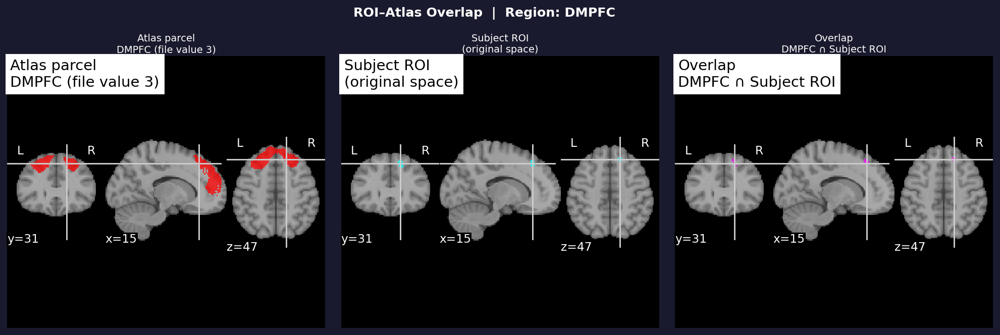

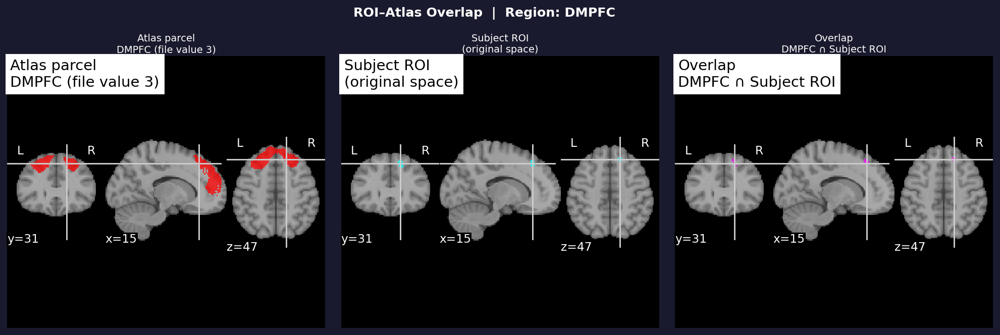

In [113]:
"""
ROI-Atlas Overlap Script v2
============================
Finds overlap between a subject ROI and the Neurosynth parcellation atlas,
identifies the named region, saves a labeled overlap NIfTI, and plots
the subject ROI alongside the full atlas parcel side by side.

Dependencies: nibabel, numpy, nilearn
Install: pip install nibabel numpy nilearn
"""

import os
import numpy as np
import nibabel as nib
from nilearn.image import resample_to_img
from nilearn import plotting

# ── Paths ─────────────────────────────────────────────────────────────────────
ROI_PATH = os.path.join(OUTPUT_DIR, 'ROI', 'roi_51_uncorrected_DECOUPLED_FIRSTHALF.nii.gz') #21, 51, 55, 57 are ROIs from first half to look at

ATLAS_PATH = "/nfs/roberts/pi/pi_il77/shared/Neurosynth Parcellation_0.nii.gz"

# Anatomical background for plots (set to None to use MNI152 template)
ANAT_PATH = None  # e.g. "/path/to/mean_epi.nii.gz"

OUT_DIR    = os.path.dirname(ROI_PATH)
OUT_NII    = os.path.join(OUT_DIR, 'roi_51_atlas_overlap.nii.gz')
OUT_REPORT = os.path.join(OUT_DIR, 'roi_51_atlas_overlap_report.txt')
OUT_PLOT   = os.path.join(OUT_DIR, 'roi_51_atlas_overlap_plot.png')

# ── Neurosynth parcellation label mapping ─────────────────────────────────────
# Keys are the raw file values (label_id + 1 in the 0-based convention).
REGION_LABELS = {
    1:  "Anterior MPFC",
    2:  "Fusiform/Parahippocampus",
    3:  "DMPFC",
    4:  "Sensorimotor/Postcentral Gyrus",
    5:  "V1",
    6:  "TPJ Posterior SMG/Angular Gyrus",
    7:  "PCC/Precuneus",
    8:  "Thalamus",
    9:  "SMA",
    10: "Precentral Gyrus",
    11: "Cerebellum (VI)",
    12: "Temporal Occipital Fusiform",
    13: "Amygdala",
    14: "Superior Temporal Gyrus",
    15: "White Matter",
    16: "TPJ Anterior SMG/Parietal Operculum",
    17: "Mid Insula",
    18: "Putamen",
    19: "Dorsal Anterior Insula",
    20: "PCC/Superior LOC",
    21: "Lateral Occipital/Temporal Occipital (V2)",
    23: "dACC",
    24: "Anterior Fronto-Parietal (DLPFC, dACC)",
    25: "Intracalcarine Cortex",
    26: "Anterior VLPFC",
    28: "Left IFG",
    29: "Hippocampus",
    30: "Dorsal Caudate",
    31: "Unknown",
    33: "vmPFC",
    35: "NAcc",
    36: "Primary Auditory",
    38: "Ventral Anterior Insula",
    40: "Superior LOC",
    43: "Cerebellum (Crus)",
    45: "DLPFC",
    46: "Right IFG/VLPFC",
    47: "Inferior LOC",
    50: "STS",
}

# ── Helpers ───────────────────────────────────────────────────────────────────

def get_region_name(file_value):
    """Return human-readable label for a raw atlas file value."""
    return REGION_LABELS.get(int(file_value), f"Region_{int(file_value)}")


def resample_roi_to_atlas(roi_img, atlas_img):
    """Resample ROI to atlas space using nearest-neighbour interpolation."""
    print("  Resampling ROI to atlas space...")
    return resample_to_img(
        roi_img, atlas_img,
        interpolation='nearest',
        force_resample=True,
        copy_header=True,
    )


def make_atlas_parcel_mask(atlas_img, file_value):
    """Return a binary NIfTI of a single atlas parcel (by raw file value)."""
    data = np.round(atlas_img.get_fdata()).astype(np.int32)
    mask = (data == int(file_value)).astype(np.int8)
    return nib.Nifti1Image(mask, atlas_img.affine, atlas_img.header)


def get_roi_centroid_mni(roi_img):
    """Return the MNI centroid of a binary (non-zero) ROI image."""
    data = roi_img.get_fdata()
    voxels = np.argwhere(data != 0)
    if voxels.size == 0:
        return None
    centroid_vox = voxels.mean(axis=0)
    return nib.affines.apply_affine(roi_img.affine, centroid_vox)


def plot_side_by_side(roi_img, parcel_img, subject_roi_img,
                      region_name, file_value, cut_coords, anat):
    """
    Three-panel figure:
      Left  — full atlas parcel
      Centre — subject ROI (in atlas space)
      Right  — overlap (parcel mask * subject ROI)
    """
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec

    # Build overlap mask: voxels that are in BOTH the parcel and the subject ROI
    parcel_data  = parcel_img.get_fdata()
    subject_data = roi_img.get_fdata()   # already in atlas space
    overlap_data = ((parcel_data > 0) & (subject_data != 0)).astype(np.int8)
    overlap_img  = nib.Nifti1Image(overlap_data, parcel_img.affine)

    fig = plt.figure(figsize=(18, 5))
    fig.patch.set_facecolor('#1a1a2e')
    gs  = gridspec.GridSpec(1, 3, figure=fig, wspace=0.05)

    panels = [
        (gs[0], parcel_img,   f"Atlas parcel\n{region_name} (file value {file_value})", "autumn"),
        (gs[1], subject_roi_img, "Subject ROI\n(original space)",                       "cool"),
        (gs[2], overlap_img,  f"Overlap\n{region_name} ∩ Subject ROI",                  "spring"),
    ]

    for spec, img, title, cmap in panels:
        ax = fig.add_subplot(spec)
        display = plotting.plot_roi(
            img,
            bg_img=anat,
            display_mode='ortho',
            cut_coords=cut_coords,
            cmap=cmap,
            alpha=0.75,
            title=title,
            axes=ax,
            colorbar=False,
        )
        # Style the title
        ax.set_title(title, color='white', fontsize=10, pad=4)

    plt.suptitle(
        f"ROI–Atlas Overlap  |  Region: {region_name}",
        color='white', fontsize=13, fontweight='bold', y=1.02
    )
    return fig


# ── Main ──────────────────────────────────────────────────────────────────────

def main():
    print("Loading images...")
    roi_img   = nib.load(ROI_PATH)
    atlas_img = nib.load(ATLAS_PATH)

    print(f"  ROI   shape : {roi_img.shape}  | voxel size: {roi_img.header.get_zooms()}")
    print(f"  Atlas shape : {atlas_img.shape} | voxel size: {atlas_img.header.get_zooms()}")

    # Keep the original subject ROI for plotting in its own space
    subject_roi_img = roi_img

    # ── Align to atlas space ──────────────────────────────────────────────────
    if roi_img.shape != atlas_img.shape or not np.allclose(
            roi_img.affine, atlas_img.affine, atol=1e-3):
        print("Shapes / affines differ — resampling ROI to atlas space.")
        roi_img_r = resample_roi_to_atlas(roi_img, atlas_img)
        roi_data  = roi_img_r.get_fdata()
    else:
        print("Shapes match — no resampling needed.")
        roi_img_r = roi_img
        roi_data  = roi_img.get_fdata()

    # Use rounded integer atlas data to avoid float comparison issues
    atlas_data = np.round(atlas_img.get_fdata()).astype(np.int32)

    # ── Find overlapping atlas regions ───────────────────────────────────────
    roi_mask            = roi_data != 0
    overlap_atlas_vals  = atlas_data[roi_mask]
    overlap_atlas_vals  = overlap_atlas_vals[overlap_atlas_vals != 0]

    if overlap_atlas_vals.size == 0:
        print("\n⚠  No overlap found between the ROI and any atlas region.")
        return

    unique_regions, counts = np.unique(overlap_atlas_vals, return_counts=True)

    # ── Report ────────────────────────────────────────────────────────────────
    total_roi_vox = int(roi_mask.sum())
    lines = []
    lines.append("=" * 65)
    lines.append("ROI–Atlas Overlap Report")
    lines.append("=" * 65)
    lines.append(f"ROI file   : {ROI_PATH}")
    lines.append(f"Atlas file : {ATLAS_PATH}")
    lines.append(f"Total ROI voxels       : {total_roi_vox}")
    lines.append(f"Overlapping ROI voxels : {int(overlap_atlas_vals.size)}")
    lines.append("")
    lines.append(f"{'File value':<12} {'Region name':<42} {'Voxels':>8}  {'% of ROI':>9}")
    lines.append("-" * 75)

    for fv, cnt in sorted(zip(unique_regions, counts), key=lambda x: -x[1]):
        name = get_region_name(fv)
        pct  = 100.0 * cnt / total_roi_vox
        lines.append(f"{int(fv):<12} {name:<42} {int(cnt):>8}  {pct:>8.2f}%")

    lines.append("=" * 65)
    report_text = "\n".join(lines)
    print("\n" + report_text)

    with open(OUT_REPORT, 'w') as f:
        f.write(report_text + "\n")
    print(f"\nReport saved → {OUT_REPORT}")

    # ── Save overlap NIfTI ────────────────────────────────────────────────────
    overlap_vol = np.zeros(atlas_data.shape, dtype=np.int32)
    overlap_vol[roi_mask] = atlas_data[roi_mask]

    region_summary = ", ".join(get_region_name(fv) for fv in unique_regions)
    overlap_img    = nib.Nifti1Image(overlap_vol, atlas_img.affine, atlas_img.header)
    overlap_img.header['descrip'] = f"Overlap: {region_summary}"[:79].encode()

    nib.save(overlap_img, OUT_NII)
    print(f"Overlap NIfTI saved → {OUT_NII}")
    print(f"  Regions: {region_summary}")

    # ── Visualisation ─────────────────────────────────────────────────────────
    # Use the centroid of the subject ROI as the cut-coord anchor
    centroid = get_roi_centroid_mni(subject_roi_img)
    if centroid is None:
        centroid = (0, 0, 0)
    cut_coords = tuple(centroid.round(0).astype(int))
    print(f"\nPlotting with cut_coords (MNI): {cut_coords}")

    # Background: use provided anat, or fall back to MNI152 template
    if ANAT_PATH and os.path.isfile(ANAT_PATH):
        anat = nib.load(ANAT_PATH)
    else:
        from nilearn.datasets import load_mni152_template
        anat = load_mni152_template(resolution=2)

    # Dominant overlapping parcel (most voxels)
    dominant_fv   = unique_regions[np.argmax(counts)]
    dominant_name = get_region_name(dominant_fv)
    parcel_img    = make_atlas_parcel_mask(atlas_img, dominant_fv)

    fig = plot_side_by_side(
        roi_img_r,         # subject ROI in atlas space (for overlap calc)
        parcel_img,        # full atlas parcel
        subject_roi_img,   # original subject ROI (for middle panel)
        dominant_name,
        int(dominant_fv),
        cut_coords,
        anat,
    )

    fig.savefig(OUT_PLOT, dpi=150, bbox_inches='tight',
                facecolor='#1a1a2e')
    print(f"Plot saved → {OUT_PLOT}")

    # Also display inline if running in a notebook
    try:
        get_ipython  # noqa: F821
        from IPython.display import display
        display(fig)
    except NameError:
        import matplotlib.pyplot as plt
        plt.show()


if __name__ == "__main__":
    main()

## Making spherical ROI from above

/tmp/ipykernel_180709/2900105295.py:7: DeprecationWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  from nilearn import input_data, plotting


ROI: roi51sphere_r10mm_x14_y31_z47
Sphere center (MNI): (14, 31, 47)
Sphere radius (mm): 10
Number of voxels in spherical ROI mask: 528
[OK] Saved ROI mask NIfTI → /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r10mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz
[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/roi51sphere_ROIMaskOverlay.jpeg


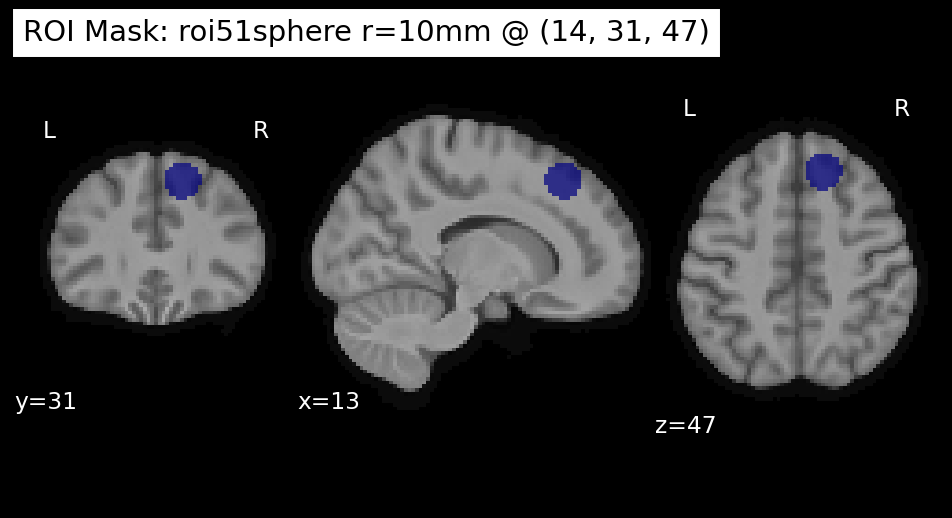


One-sample ROI test (decoupled validation sample)
Contrast (key): CorrectUnaligned_gt_IncorrectUnaligned
Contrast (label): CorrectIncongruent > IncorrectIncongruent
ROI label: roi51sphere_r10mm_x14_y31_z47
N subjects: 25
Mean ROI signal: 0.031991 (SD=0.108241, SEM=0.021648)
t(24) = 1.478, p = 0.1525
Cohen's d = 0.296
95% CI for mean: [-0.012689, 0.076670]


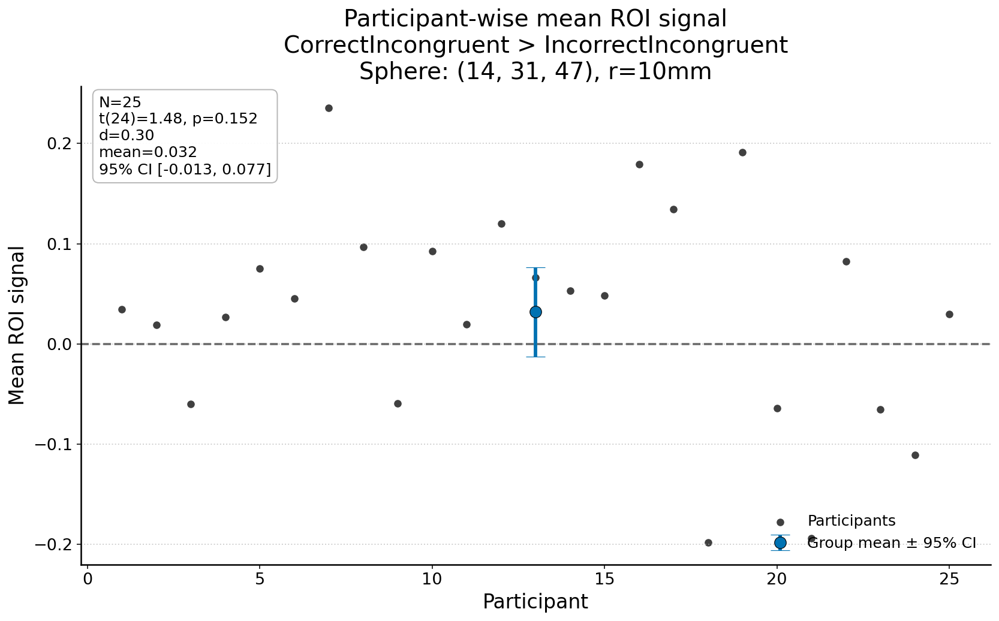

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/roi51sphere_CorrectIncongruent_gt_IncorrectIncongruent_ParticipantScatter_MeanCI.jpeg


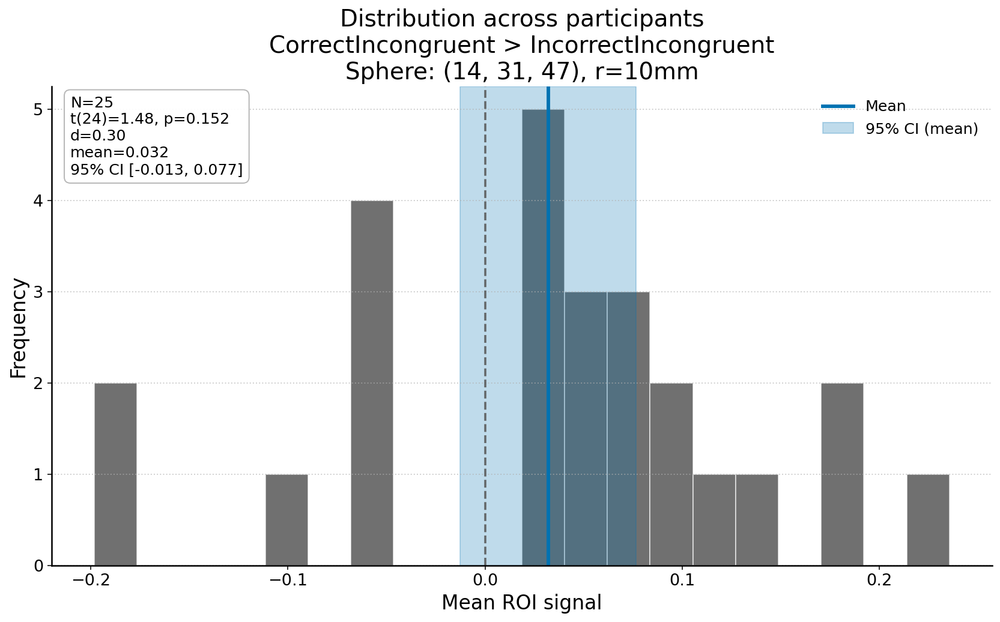

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/roi51sphere_CorrectIncongruent_gt_IncorrectIncongruent_Histogram_MeanCI.jpeg
Saved ROI mask to: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r10mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz


In [12]:
# Decoupled sphere ROI (roi51sphere) - 10 mm 

import os
import re
import numpy as np
import nibabel as nib
from nilearn import input_data, plotting
from nilearn.image import load_img
from scipy import stats
import matplotlib.pyplot as plt

# -----------------------
# Helpers: stats + CI + effect size + filenames
# -----------------------
def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return mean, (mean - half, mean + half)

def cohens_d_onesample(x, mu0=0.0):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    sd = float(np.std(x, ddof=1))
    return float((np.mean(x) - mu0) / sd) if sd != 0 else np.nan

def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def create_true_sphere_mask_mni(center_mni_xyz, radius_mm, reference_img):
    """
    Create a TRUE spherical mask in mm-space (not voxel-iteration dilation).
    Works in the space of reference_img (shape+affine).
    """
    center_mni_xyz = np.asarray(center_mni_xyz, dtype=float)

    # Build voxel grid -> world coords
    ijk = np.indices(reference_img.shape).reshape(3, -1).T  # (N, 3) ijk
    xyz = nib.affines.apply_affine(reference_img.affine, ijk)  # (N, 3) mm

    dist = np.sqrt(((xyz - center_mni_xyz) ** 2).sum(axis=1))
    mask_flat = dist <= float(radius_mm)
    mask_3d = mask_flat.reshape(reference_img.shape)

    return nib.Nifti1Image(mask_3d.astype(np.int8), reference_img.affine, reference_img.header)

# -----------------------
# Settings (readability)
# -----------------------
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 20,
    "axes.labelsize": 17,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 13,
    "axes.linewidth": 1.3,
})

MEAN_COLOR = "#0072B2"   # strong blue (Okabe–Ito)
ZERO_COLOR = "0.35"      # neutral gray 0-line

# -----------------------
# Inputs (edit if needed)
# -----------------------
contrast_key = "CorrectUnaligned_gt_IncorrectUnaligned"
functional_img_path = os.path.join(
    str(OUTPUT_DIR),
    "none_glm_CorrectUnaligned_gt_IncorrectUnaligned_decoupled_test_group_4d.nii.gz"
)

anat_img = load_img(str(MEAN_ANAT))  # reference space for mask + background

coords = (14, 31, 47)   # MNI (mm)
radius = 10            # mm

# Display label (optional helper if you have it elsewhere)
try:
    contrast_label = contrast_display_name(contrast_key)
except NameError:
    contrast_label = contrast_key.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")

roi_label = f"roi51sphere_r{radius}mm_x{coords[0]}_y{coords[1]}_z{coords[2]}"
roi_slug = safe_filename("roi51sphere")  # per your request, put roi51sphere in the name
contrast_slug = safe_filename(contrast_label)

# -----------------------
# Output folders
# -----------------------
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

ROI_OUT_DIR = os.path.join(str(OUTPUT_DIR), "ROI")
os.makedirs(ROI_OUT_DIR, exist_ok=True)

# -----------------------
# Load functional
# -----------------------
functional_img = nib.load(functional_img_path)

# -----------------------
# Build spherical ROI mask (true sphere in mm)
# -----------------------
spherical_roi_mask = create_true_sphere_mask_mni(coords, radius, anat_img)
n_vox = int(np.sum(spherical_roi_mask.get_fdata() > 0))
print(f"ROI: {roi_label}")
print(f"Sphere center (MNI): {coords}")
print(f"Sphere radius (mm): {radius}")
print(f"Number of voxels in spherical ROI mask: {n_vox}")

# -----------------------
# Save ROI mask NIfTI
# -----------------------
roi_mask_path = os.path.join(
    ROI_OUT_DIR,
    f"sphere_r{radius}mm_x{coords[0]}_y{coords[1]}_z{coords[2]}_mask_DECOUPLED_FIRSTHALF.nii.gz"
)
nib.save(spherical_roi_mask, roi_mask_path)
print(f"[OK] Saved ROI mask NIfTI → {roi_mask_path}")

# -----------------------
# ROI mask overlay (SAVE; no colorbar)
# -----------------------
display = plotting.plot_roi(
    spherical_roi_mask,
    bg_img=anat_img,
    title=f"ROI Mask: {roi_label}",
    display_mode="ortho",
    draw_cross=False,
    colorbar=False
)

roi_plot_title = "ROIMaskOverlay"
roi_out = os.path.join(FIG_DIR, f"{roi_slug}_{roi_plot_title}.jpeg")
display.savefig(roi_out, dpi=600)
display.close()
print(f"[OK] Saved: {roi_out}")

# --- plot ROI mask (inline display) ---
disp_inline = plotting.plot_roi(
    spherical_roi_mask,   # or roi_mask_path (the .nii.gz), not roi_out
    bg_img=anat_img,
    title=f"ROI Mask: roi51sphere r={radius}mm @ {coords}",
    display_mode="ortho",
    draw_cross=False,
    colorbar=False
)
plt.show()

# -----------------------
# Extract mean signal per subject
# -----------------------
nifti_masker = input_data.NiftiMasker(mask_img=spherical_roi_mask, standardize=False)
roi_vox = nifti_masker.fit_transform(functional_img)  # (n_subjects, n_voxels)
mean_signal_per_subject = np.asarray(roi_vox.mean(axis=1)).ravel()

x = mean_signal_per_subject.astype(float)
x = x[~np.isnan(x)]

n = int(x.size)
df = n - 1

# -----------------------
# Stats: one-sample vs 0 with 95% CI + Cohen's d
# -----------------------
group_mean = float(np.mean(x))
group_sd = float(np.std(x, ddof=1))
group_sem = float(stats.sem(x))

t_statistic, p_value = stats.ttest_1samp(x, 0.0, nan_policy="omit")
t_statistic = float(t_statistic)
p_value = float(p_value)

d = cohens_d_onesample(x, mu0=0.0)
_, (ci_lo, ci_hi) = mean_ci_t(x, confidence=0.95)

print("\nOne-sample ROI test (decoupled validation sample)")
print(f"Contrast (key): {contrast_key}")
print(f"Contrast (label): {contrast_label}")
print(f"ROI label: {roi_label}")
print(f"N subjects: {n}")
print(f"Mean ROI signal: {group_mean:.6f} (SD={group_sd:.6f}, SEM={group_sem:.6f})")
print(f"t({df}) = {t_statistic:.3f}, p = {p_value:.4g}")
print(f"Cohen's d = {d:.3f}")
print(f"95% CI for mean: [{ci_lo:.6f}, {ci_hi:.6f}]")

stats_text = (
    f"N={n}\n"
    f"t({df})={t_statistic:.2f}, p={p_value:.3g}\n"
    f"d={d:.2f}\n"
    f"mean={group_mean:.3f}\n"
    f"95% CI [{ci_lo:.3f}, {ci_hi:.3f}]"
)

# -----------------------
# Plot 1: participant points + mean ± 95% CI (SAVE)
# -----------------------
fig1, ax1 = plt.subplots(figsize=(12, 7.5))
x_subjects = np.arange(1, n + 1)

ax1.scatter(
    x_subjects, x,
    color="black", alpha=0.75, s=42, linewidths=0,
    label="Participants"
)

ax1.errorbar(
    x=float(np.mean(x_subjects)),
    y=group_mean,
    yerr=np.array([[group_mean - ci_lo], [ci_hi - group_mean]]),
    fmt="o",
    color=MEAN_COLOR,
    ecolor=MEAN_COLOR,
    elinewidth=3.0,
    capsize=8,
    markersize=10,
    markeredgecolor="black",
    markeredgewidth=0.6,
    label="Group mean ± 95% CI"
)

ax1.axhline(y=0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax1.set_xlabel("Participant")
ax1.set_ylabel("Mean ROI signal")

plot1_title = "ParticipantScatter_MeanCI"
ax1.set_title(f"Participant-wise mean ROI signal\n{contrast_label}\nSphere: {coords}, r={radius}mm")

ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

ax1.text(
    0.02, 0.98, stats_text,
    transform=ax1.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax1.legend(frameon=False, loc="lower right")
plt.tight_layout()

fname1 = f"{roi_slug}_{contrast_slug}_{plot1_title}.jpeg"
out1 = os.path.join(FIG_DIR, fname1)
fig1.savefig(out1, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out1}")

# -----------------------
# Plot 2: histogram + mean and CI (SAVE)
# -----------------------
fig2, ax2 = plt.subplots(figsize=(12, 7.5))

ax2.hist(x, bins=20, color="0.25", alpha=0.75, edgecolor="white", linewidth=0.8)
ax2.axvline(x=0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)

ax2.axvline(group_mean, color=MEAN_COLOR, linewidth=3.0, label="Mean")
ax2.axvspan(ci_lo, ci_hi, color=MEAN_COLOR, alpha=0.25, label="95% CI (mean)")

ax2.set_xlabel("Mean ROI signal")
ax2.set_ylabel("Frequency")

plot2_title = "Histogram_MeanCI"
ax2.set_title(f"Distribution across participants\n{contrast_label}\nSphere: {coords}, r={radius}mm")

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

ax2.text(
    0.02, 0.98, stats_text,
    transform=ax2.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax2.legend(frameon=False, loc="upper right")
plt.tight_layout()

fname2 = f"{roi_slug}_{contrast_slug}_{plot2_title}.jpeg"
out2 = os.path.join(FIG_DIR, fname2)
fig2.savefig(out2, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out2}")


# --- save ROI mask ---
roi_out_dir = os.path.join(OUTPUT_DIR, "ROI")
os.makedirs(roi_out_dir, exist_ok=True)

roi_mask_path = os.path.join(
    roi_out_dir,
    f"sphere_r{radius}mm_x{coords[0]}_y{coords[1]}_z{coords[2]}_mask_DECOUPLED_FIRSTHALF.nii.gz"
)

nib.save(spherical_roi_mask, roi_mask_path)
print(f"Saved ROI mask to: {roi_mask_path}")

ROI: roi51sphere_r13mm_x14_y31_z47
Sphere center (MNI): (14, 31, 47)
Sphere radius (mm): 13
Number of voxels in spherical ROI mask: 1166
[OK] Saved ROI mask NIfTI → /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r13mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz
[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/roi51sphere_ROIMaskOverlay.jpeg


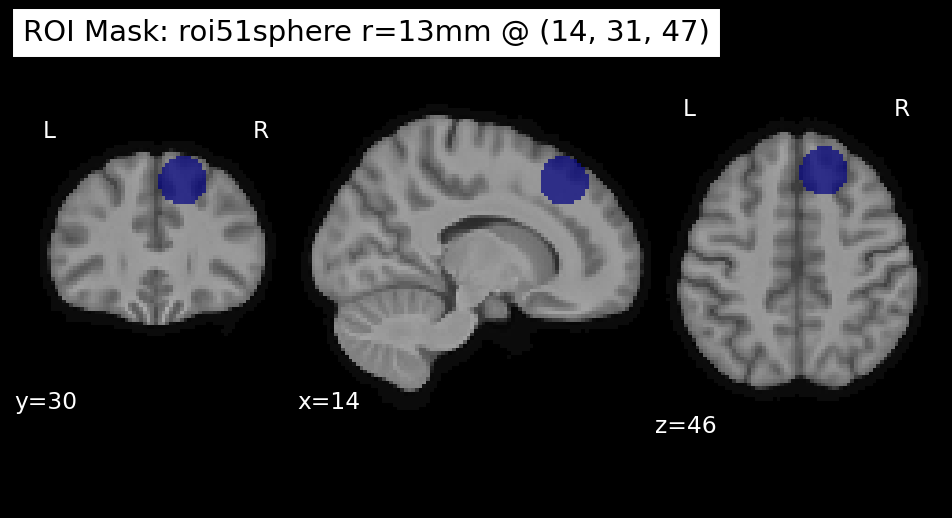


One-sample ROI test (decoupled validation sample)
Contrast (key): CorrectUnaligned_gt_IncorrectUnaligned
Contrast (label): CorrectIncongruent > IncorrectIncongruent
ROI label: roi51sphere_r13mm_x14_y31_z47
N subjects: 25
Mean ROI signal: 0.045467 (SD=0.103514, SEM=0.020703)
t(24) = 2.196, p = 0.03798
Cohen's d = 0.439
95% CI for mean: [0.002739, 0.088196]


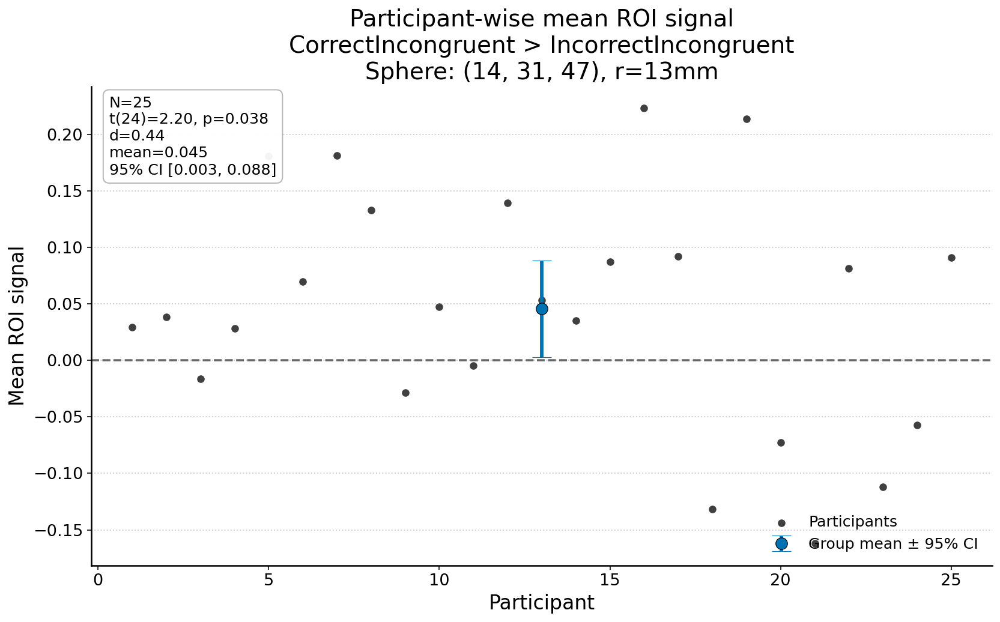

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/roi51sphere_CorrectIncongruent_gt_IncorrectIncongruent_ParticipantScatter_MeanCI.jpeg


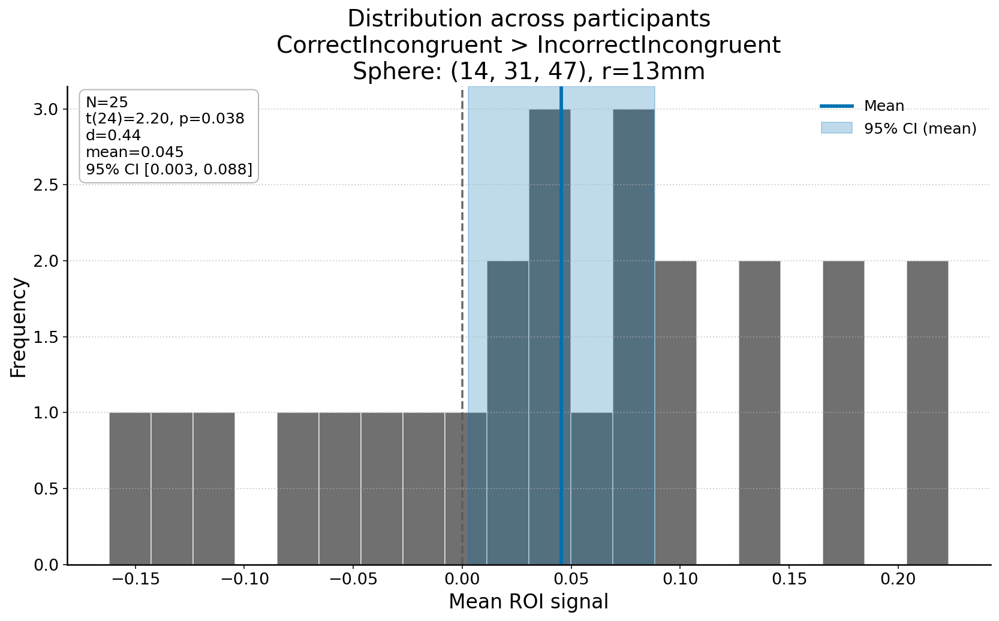

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/roi51sphere_CorrectIncongruent_gt_IncorrectIncongruent_Histogram_MeanCI.jpeg
Saved ROI mask to: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r13mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz


In [27]:
# Decoupled sphere ROI (roi51sphere) -- 13mm, sensitivity analysis

import os
import re
import numpy as np
import nibabel as nib
from nilearn import input_data, plotting
from nilearn.image import load_img
from scipy import stats
import matplotlib.pyplot as plt

# -----------------------
# Helpers: stats + CI + effect size + filenames
# -----------------------
def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return mean, (mean - half, mean + half)

def cohens_d_onesample(x, mu0=0.0):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    sd = float(np.std(x, ddof=1))
    return float((np.mean(x) - mu0) / sd) if sd != 0 else np.nan

def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def create_true_sphere_mask_mni(center_mni_xyz, radius_mm, reference_img):
    """
    Create a TRUE spherical mask in mm-space (not voxel-iteration dilation).
    Works in the space of reference_img (shape+affine).
    """
    center_mni_xyz = np.asarray(center_mni_xyz, dtype=float)

    # Build voxel grid -> world coords
    ijk = np.indices(reference_img.shape).reshape(3, -1).T  # (N, 3) ijk
    xyz = nib.affines.apply_affine(reference_img.affine, ijk)  # (N, 3) mm

    dist = np.sqrt(((xyz - center_mni_xyz) ** 2).sum(axis=1))
    mask_flat = dist <= float(radius_mm)
    mask_3d = mask_flat.reshape(reference_img.shape)

    return nib.Nifti1Image(mask_3d.astype(np.int8), reference_img.affine, reference_img.header)

# -----------------------
# Settings (readability)
# -----------------------
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 20,
    "axes.labelsize": 17,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 13,
    "axes.linewidth": 1.3,
})

MEAN_COLOR = "#0072B2"   # strong blue (Okabe–Ito)
ZERO_COLOR = "0.35"      # neutral gray 0-line

# -----------------------
# Inputs (edit if needed)
# -----------------------
contrast_key = "CorrectUnaligned_gt_IncorrectUnaligned"
functional_img_path = os.path.join(
    str(OUTPUT_DIR),
    "none_glm_CorrectUnaligned_gt_IncorrectUnaligned_decoupled_test_group_4d.nii.gz"
)

anat_img = load_img(str(MEAN_ANAT))  # reference space for mask + background

coords = (14, 31, 47)   # MNI (mm)
radius = 13            # mm

# Display label (optional helper if you have it elsewhere)
try:
    contrast_label = contrast_display_name(contrast_key)
except NameError:
    contrast_label = contrast_key.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")

roi_label = f"roi51sphere_r{radius}mm_x{coords[0]}_y{coords[1]}_z{coords[2]}"
roi_slug = safe_filename("roi51sphere")  # per your request, put roi51sphere in the name
contrast_slug = safe_filename(contrast_label)

# -----------------------
# Output folders
# -----------------------
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

ROI_OUT_DIR = os.path.join(str(OUTPUT_DIR), "ROI")
os.makedirs(ROI_OUT_DIR, exist_ok=True)

# -----------------------
# Load functional
# -----------------------
functional_img = nib.load(functional_img_path)

# -----------------------
# Build spherical ROI mask (true sphere in mm)
# -----------------------
spherical_roi_mask = create_true_sphere_mask_mni(coords, radius, anat_img)
n_vox = int(np.sum(spherical_roi_mask.get_fdata() > 0))
print(f"ROI: {roi_label}")
print(f"Sphere center (MNI): {coords}")
print(f"Sphere radius (mm): {radius}")
print(f"Number of voxels in spherical ROI mask: {n_vox}")

# -----------------------
# Save ROI mask NIfTI
# -----------------------
roi_mask_path = os.path.join(
    ROI_OUT_DIR,
    f"sphere_r{radius}mm_x{coords[0]}_y{coords[1]}_z{coords[2]}_mask_DECOUPLED_FIRSTHALF.nii.gz"
)
nib.save(spherical_roi_mask, roi_mask_path)
print(f"[OK] Saved ROI mask NIfTI → {roi_mask_path}")

# -----------------------
# ROI mask overlay (SAVE; no colorbar)
# -----------------------
display = plotting.plot_roi(
    spherical_roi_mask,
    bg_img=anat_img,
    title=f"ROI Mask: {roi_label}",
    display_mode="ortho",
    draw_cross=False,
    colorbar=False
)

roi_plot_title = "ROIMaskOverlay"
roi_out = os.path.join(FIG_DIR, f"{roi_slug}_{roi_plot_title}.jpeg")
display.savefig(roi_out, dpi=600)
display.close()
print(f"[OK] Saved: {roi_out}")

# --- plot ROI mask (inline display) ---
disp_inline = plotting.plot_roi(
    spherical_roi_mask,   # or roi_mask_path (the .nii.gz), not roi_out
    bg_img=anat_img,
    title=f"ROI Mask: roi51sphere r={radius}mm @ {coords}",
    display_mode="ortho",
    draw_cross=False,
    colorbar=False
)
plt.show()

# -----------------------
# Extract mean signal per subject
# -----------------------
nifti_masker = input_data.NiftiMasker(mask_img=spherical_roi_mask, standardize=False)
roi_vox = nifti_masker.fit_transform(functional_img)  # (n_subjects, n_voxels)
mean_signal_per_subject = np.asarray(roi_vox.mean(axis=1)).ravel()

x = mean_signal_per_subject.astype(float)
x = x[~np.isnan(x)]

n = int(x.size)
df = n - 1

# -----------------------
# Stats: one-sample vs 0 with 95% CI + Cohen's d
# -----------------------
group_mean = float(np.mean(x))
group_sd = float(np.std(x, ddof=1))
group_sem = float(stats.sem(x))

t_statistic, p_value = stats.ttest_1samp(x, 0.0, nan_policy="omit")
t_statistic = float(t_statistic)
p_value = float(p_value)

d = cohens_d_onesample(x, mu0=0.0)
_, (ci_lo, ci_hi) = mean_ci_t(x, confidence=0.95)

print("\nOne-sample ROI test (decoupled validation sample)")
print(f"Contrast (key): {contrast_key}")
print(f"Contrast (label): {contrast_label}")
print(f"ROI label: {roi_label}")
print(f"N subjects: {n}")
print(f"Mean ROI signal: {group_mean:.6f} (SD={group_sd:.6f}, SEM={group_sem:.6f})")
print(f"t({df}) = {t_statistic:.3f}, p = {p_value:.4g}")
print(f"Cohen's d = {d:.3f}")
print(f"95% CI for mean: [{ci_lo:.6f}, {ci_hi:.6f}]")

stats_text = (
    f"N={n}\n"
    f"t({df})={t_statistic:.2f}, p={p_value:.3g}\n"
    f"d={d:.2f}\n"
    f"mean={group_mean:.3f}\n"
    f"95% CI [{ci_lo:.3f}, {ci_hi:.3f}]"
)

# -----------------------
# Plot 1: participant points + mean ± 95% CI (SAVE)
# -----------------------
fig1, ax1 = plt.subplots(figsize=(12, 7.5))
x_subjects = np.arange(1, n + 1)

ax1.scatter(
    x_subjects, x,
    color="black", alpha=0.75, s=42, linewidths=0,
    label="Participants"
)

ax1.errorbar(
    x=float(np.mean(x_subjects)),
    y=group_mean,
    yerr=np.array([[group_mean - ci_lo], [ci_hi - group_mean]]),
    fmt="o",
    color=MEAN_COLOR,
    ecolor=MEAN_COLOR,
    elinewidth=3.0,
    capsize=8,
    markersize=10,
    markeredgecolor="black",
    markeredgewidth=0.6,
    label="Group mean ± 95% CI"
)

ax1.axhline(y=0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax1.set_xlabel("Participant")
ax1.set_ylabel("Mean ROI signal")

plot1_title = "ParticipantScatter_MeanCI"
ax1.set_title(f"Participant-wise mean ROI signal\n{contrast_label}\nSphere: {coords}, r={radius}mm")

ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

ax1.text(
    0.02, 0.98, stats_text,
    transform=ax1.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax1.legend(frameon=False, loc="lower right")
plt.tight_layout()

fname1 = f"{roi_slug}_{contrast_slug}_{plot1_title}.jpeg"
out1 = os.path.join(FIG_DIR, fname1)
fig1.savefig(out1, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out1}")

# -----------------------
# Plot 2: histogram + mean and CI (SAVE)
# -----------------------
fig2, ax2 = plt.subplots(figsize=(12, 7.5))

ax2.hist(x, bins=20, color="0.25", alpha=0.75, edgecolor="white", linewidth=0.8)
ax2.axvline(x=0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)

ax2.axvline(group_mean, color=MEAN_COLOR, linewidth=3.0, label="Mean")
ax2.axvspan(ci_lo, ci_hi, color=MEAN_COLOR, alpha=0.25, label="95% CI (mean)")

ax2.set_xlabel("Mean ROI signal")
ax2.set_ylabel("Frequency")

plot2_title = "Histogram_MeanCI"
ax2.set_title(f"Distribution across participants\n{contrast_label}\nSphere: {coords}, r={radius}mm")

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

ax2.text(
    0.02, 0.98, stats_text,
    transform=ax2.transAxes, va="top", ha="left",
    fontsize=13,
    bbox=dict(boxstyle="round,pad=0.40", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax2.legend(frameon=False, loc="upper right")
plt.tight_layout()

fname2 = f"{roi_slug}_{contrast_slug}_{plot2_title}.jpeg"
out2 = os.path.join(FIG_DIR, fname2)
fig2.savefig(out2, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out2}")


# --- save ROI mask ---
roi_out_dir = os.path.join(OUTPUT_DIR, "ROI")
os.makedirs(roi_out_dir, exist_ok=True)

roi_mask_path = os.path.join(
    roi_out_dir,
    f"sphere_r{radius}mm_x{coords[0]}_y{coords[1]}_z{coords[2]}_mask_DECOUPLED_FIRSTHALF.nii.gz"
)

nib.save(spherical_roi_mask, roi_mask_path)
print(f"Saved ROI mask to: {roi_mask_path}")

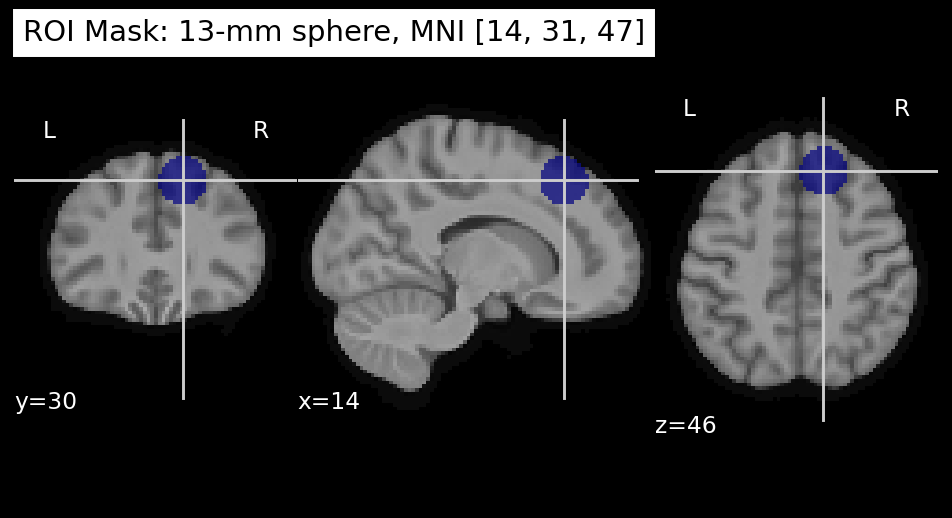

[OK] Saved ROI overlay (ortho): /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/13-mm_sphere_MNI_14_31_47_ROIMaskOverlay_Ortho.jpeg

=== Violin: One-sample t-test vs 0 ===
Contrast key: CorrectUnaligned_gt_IncorrectUnaligned
Contrast label: CorrectIncongruent > IncorrectIncongruent
ROI: 13-mm sphere, MNI [14, 31, 47]
N = 25
Mean = 0.045467 | SD = 0.103514 | SEM = 0.020703
t(24) = 2.196192, p = 0.0379805
Cohen's d = 0.439238
95% CI(mean) = [0.002739, 0.088196]


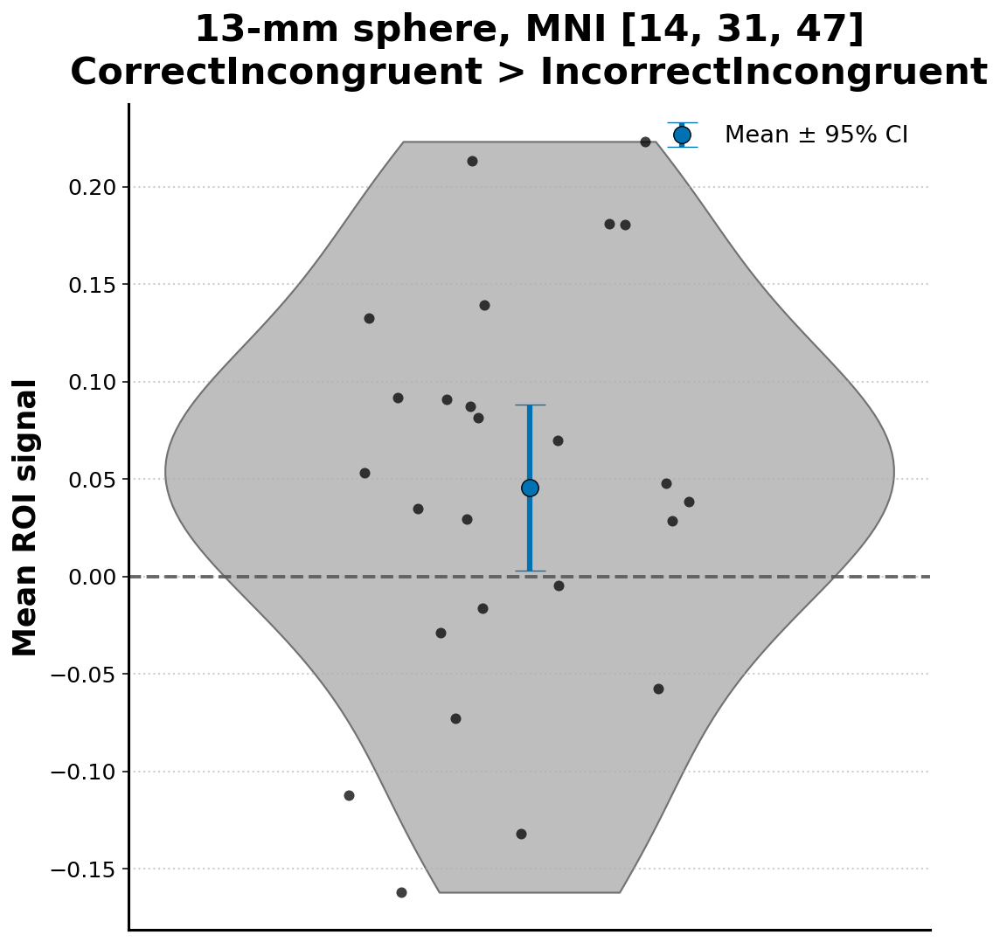

[OK] Saved violin: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/13-mm_sphere_MNI_14_31_47_CorrectIncongruent_gt_IncorrectIncongruent_ViolinPoints_MeanCI.jpeg
[INFO] CorrectUnaligned: 25 subjects, 1166 voxels
[INFO] IncorrectUnaligned: 25 subjects, 1166 voxels
[INFO] CorrectAligned: 25 subjects, 1166 voxels
[INFO] IncorrectAligned: 25 subjects, 1166 voxels

=== Paired t-test (Incongruent) ===
CorrectUnaligned vs IncorrectUnaligned
N = 25
Mean(CorrectUnaligned) = 0.056920
Mean(IncorrectUnaligned) = 0.011455
Mean diff (CorrectUnaligned - IncorrectUnaligned) = 0.045465
95% CI(diff) = [0.002737, 0.088193]
t(24) = 2.196079, p = 0.0379895
d_z = 0.439216

=== Paired t-test (Congruent) ===
CorrectAligned vs IncorrectAligned
N = 25
Mean(CorrectAligned) = 0.040209
Mean(IncorrectAligned) = 0.089811
Mean diff (CorrectAligned - IncorrectAligned) = -0.049602
95% CI(diff) = [-0.115732, 0.016527]
t(24) = -1.548086, p = 0.134688
d_z = -0.309617


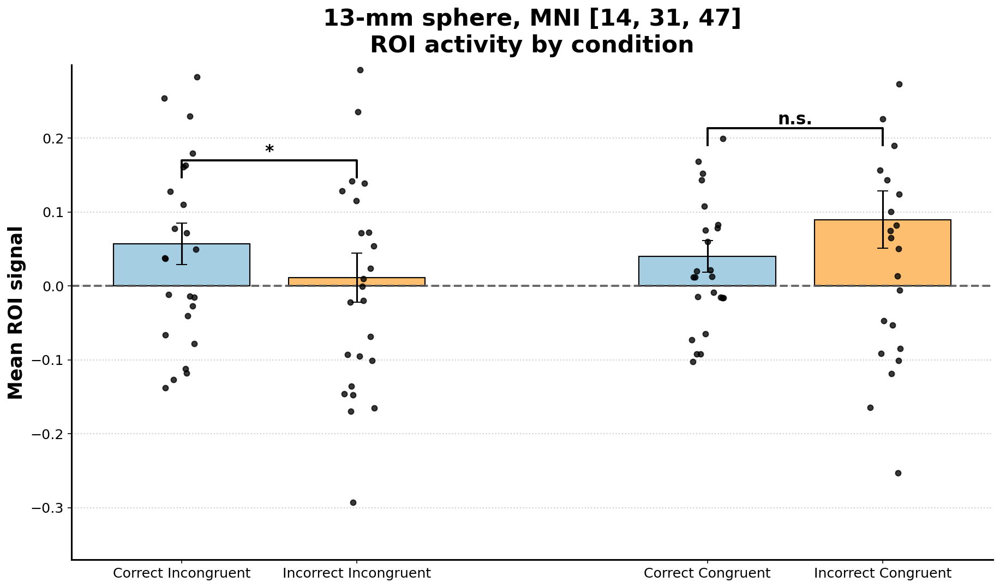

[OK] Saved 2x2 bars: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures/13-mm_sphere_MNI_14_31_47_Combined_2x2BarsPoints_SigStars_DisplayLabels.jpeg


In [42]:
import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
import seaborn as sns
import matplotlib.pyplot as plt

from nilearn import plotting
from nilearn.maskers import NiftiMasker
from scipy import stats


# ============================================================
# Helpers
# ============================================================
def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def condition_display_name(name: str) -> str:
    # Match your earlier nomenclature:
    # CorrectAligned -> Correct Congruent
    # CorrectUnaligned -> Correct Incongruent
    s = name.replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")
    s = "".join((" " + c if c.isupper() and i > 0 and (not s[i-1].isupper()) else c)
                for i, c in enumerate(s))
    return " ".join(s.split())

def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return mean, (mean - half, mean + half)

def mean_ci_paired(diff, confidence=0.95):
    diff = np.asarray(diff, dtype=float)
    diff = diff[~np.isnan(diff)]
    n = diff.size
    m = float(np.mean(diff))
    sem = float(stats.sem(diff))
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df))
    half = tcrit * sem
    return m, (m - half, m + half)

def cohens_d_onesample(x, mu0=0.0):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    return float((np.mean(x) - mu0) / np.std(x, ddof=1))

def p_to_stars(p: float) -> str:
    if p < 1e-4:
        return "****"
    if p < 1e-3:
        return "***"
    if p < 1e-2:
        return "**"
    if p < 5e-2:
        return "*"
    return "n.s."

def add_sig_bracket(ax, x1, x2, y, h, text, lw=2.0, color="black", fontsize=16, fontweight="bold"):
    ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=lw, c=color, clip_on=False)
    ax.text((x1 + x2) / 2, y + h, text, ha="center", va="bottom",
            color=color, fontsize=fontsize, fontweight=fontweight)

def extract_condition_means(masker, img_paths: dict):
    means = {}
    for key, path in img_paths.items():
        img = nib.load(path)
        roi_data = masker.transform(img)  # n_subjects x n_voxels
        means[key] = np.asarray(roi_data.mean(axis=1)).ravel().astype(float)
        print(f"[INFO] {key}: {roi_data.shape[0]} subjects, {roi_data.shape[1]} voxels")
    return means

def paired_test(means_dict, condA, condB, label):
    a = means_dict[condA].astype(float)
    b = means_dict[condB].astype(float)

    n = min(len(a), len(b))
    a = a[:n]
    b = b[:n]

    mask = (~np.isnan(a)) & (~np.isnan(b))
    a = a[mask]
    b = b[mask]
    n = a.size
    df = n - 1

    diff = a - b
    t_stat, p_val = stats.ttest_rel(a, b, nan_policy="omit")
    t_stat = float(t_stat)
    p_val = float(p_val)

    sd_diff = float(np.std(diff, ddof=1))
    dz = float(np.mean(diff) / sd_diff) if sd_diff != 0 else np.nan
    mean_diff, (ci_lo, ci_hi) = mean_ci_paired(diff, confidence=0.95)

    print(f"\n=== Paired t-test ({label}) ===")
    print(f"{condA} vs {condB}")
    print(f"N = {n}")
    print(f"Mean({condA}) = {float(np.mean(a)):.6f}")
    print(f"Mean({condB}) = {float(np.mean(b)):.6f}")
    print(f"Mean diff ({condA} - {condB}) = {mean_diff:.6f}")
    print(f"95% CI(diff) = [{ci_lo:.6f}, {ci_hi:.6f}]")
    print(f"t({df}) = {t_stat:.6f}, p = {p_val:.6g}")
    print(f"d_z = {dz:.6f}")

    return {"condA": condA, "condB": condB, "n": n, "df": df, "t": t_stat, "p": p_val, "dz": dz}


# ============================================================
# Style (bigger/bolder, easier to read)
# ============================================================
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 22,
    "axes.titleweight": "bold",
    "axes.labelsize": 18,
    "axes.labelweight": "bold",
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 14,
    "axes.linewidth": 1.6,
})

MEAN_COLOR = "#0072B2"
ZERO_COLOR = "0.35"
VIOLIN_COLOR = "#BEBEBE"

COND_COLORS = {
    "CorrectUnaligned":   "#A6CEE3",
    "IncorrectUnaligned": "#FDBF6F",
    "CorrectAligned":     "#A6CEE3",
    "IncorrectAligned":   "#FDBF6F",
}


# ============================================================
# User settings (assumes OUTPUT_DIR, mask_img, anat_img exist)
# ============================================================
FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/decoupled/Decoupled_Analysis_Figures"
os.makedirs(FIG_DIR, exist_ok=True)

roi_label = "13-mm sphere, MNI [14, 31, 47]"
roi_slug = safe_filename(roi_label)

contrast_key_a = "CorrectUnaligned_gt_IncorrectUnaligned"
try:
    contrast_label_a = contrast_display_name(contrast_key_a)
except NameError:
    contrast_label_a = contrast_key_a.replace("_gt_", " > ").replace("Unaligned", "Incongruent").replace("Aligned", "Congruent")
contrast_slug_a = safe_filename(contrast_label_a)

functional_img_path_a = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_key_a}_decoupled_test_group_4d.nii.gz")

img_paths_incong = {
    "CorrectUnaligned": os.path.join(str(OUTPUT_DIR), "none_glm_CorrectUnaligned_decoupled_test_group_4d.nii.gz"),
    "IncorrectUnaligned": os.path.join(str(OUTPUT_DIR), "none_glm_IncorrectUnaligned_decoupled_test_group_4d.nii.gz"),
}
img_paths_cong = {
    "CorrectAligned": os.path.join(str(OUTPUT_DIR), "none_glm_CorrectAligned_decoupled_test_group_4d.nii.gz"),
    "IncorrectAligned": os.path.join(str(OUTPUT_DIR), "none_glm_IncorrectAligned_decoupled_test_group_4d.nii.gz"),
}


# ============================================================
# Masker (same behavior as your prior scripts)
# ============================================================
roi_mask_img = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r13mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz"
masker = NiftiMasker(mask_img=roi_mask_img, standardize=False)
masker.fit()


# ============================================================
# 1) ROI MASK OVERLAY: SHOW in output + SAVE sagittal-only
#    - show the figure in notebook output
# ============================================================
# Show in notebook output (3-view crosshair)
roi_display_ortho = plotting.plot_roi(
    roi_mask_img,
    bg_img=anat_img,
    title=f"ROI Mask: {roi_label}",
    colorbar=False,
    draw_cross=True,
)
plotting.show()
roi_overlay_out = os.path.join(FIG_DIR, f"{roi_slug}_ROIMaskOverlay_Ortho.jpeg")
roi_display_ortho.savefig(roi_overlay_out, dpi=600)
print(f"[OK] Saved ROI overlay (ortho): {roi_overlay_out}")
roi_display_ortho.close()

# ============================================================
# Violin data: extract ROI mean per subject from contrast 4D
# ============================================================
functional_img_a = nib.load(functional_img_path_a)
roi_vox_a = masker.transform(functional_img_a)
x = np.asarray(roi_vox_a.mean(axis=1)).ravel().astype(float)
x = x[~np.isnan(x)]

n_a = x.size
df_a = n_a - 1
group_mean_a = float(np.mean(x))
group_sd_a = float(np.std(x, ddof=1))
group_sem_a = float(stats.sem(x))
t_stat_a, p_val_a = stats.ttest_1samp(x, 0.0, nan_policy="omit")
t_stat_a = float(t_stat_a)
p_val_a = float(p_val_a)
d_a = cohens_d_onesample(x, mu0=0.0)
_, (ci_lo_a, ci_hi_a) = mean_ci_t(x, confidence=0.95)

print("\n=== Violin: One-sample t-test vs 0 ===")
print(f"Contrast key: {contrast_key_a}")
print(f"Contrast label: {contrast_label_a}")
print(f"ROI: {roi_label}")
print(f"N = {n_a}")
print(f"Mean = {group_mean_a:.6f} | SD = {group_sd_a:.6f} | SEM = {group_sem_a:.6f}")
print(f"t({df_a}) = {t_stat_a:.6f}, p = {p_val_a:.6g}")
print(f"Cohen's d = {d_a:.6f}")
print(f"95% CI(mean) = [{ci_lo_a:.6f}, {ci_hi_a:.6f}]")


# ============================================================
# 2) VIOLIN FIGURE (with individual subject points)
# ============================================================
figV, axV = plt.subplots(figsize=(7.8, 7.8))

sns.violinplot(
    y=x,
    ax=axV,
    color=VIOLIN_COLOR,
    inner=None,
    cut=0,
    linewidth=1.1
)

sns.stripplot(
    y=x,
    ax=axV,
    color="black",
    alpha=0.75,
    jitter=0.20,
    size=6.2,
    zorder=4
)

axV.errorbar(
    x=0,
    y=group_mean_a,
    yerr=np.array([[group_mean_a - ci_lo_a], [ci_hi_a - group_mean_a]]),
    fmt="o",
    color=MEAN_COLOR,
    ecolor=MEAN_COLOR,
    elinewidth=3.2,
    capsize=9,
    markersize=10,
    markeredgecolor="black",
    markeredgewidth=0.7,
    zorder=5,
    label="Mean ± 95% CI"
)

axV.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=2.0, alpha=0.9)
axV.set_xticks([])
axV.set_xlabel("")
axV.set_ylabel("Mean ROI signal")
axV.set_title(f"{roi_label}\n{contrast_label_a}", pad=12)

axV.spines["top"].set_visible(False)
axV.spines["right"].set_visible(False)
axV.grid(True, axis="y", linestyle=":", linewidth=1.1, alpha=0.6)
axV.legend(frameon=False, loc="upper right")

plt.tight_layout()
violin_out = os.path.join(FIG_DIR, f"{roi_slug}_{contrast_slug_a}_ViolinPoints_MeanCI.jpeg")
figV.savefig(violin_out, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved violin: {violin_out}")


# ============================================================
# 3) 2x2 BARPLOT FIGURE (combined; gap; points; display labels)
# ============================================================
means_incong = extract_condition_means(masker, img_paths_incong)
means_cong = extract_condition_means(masker, img_paths_cong)

res_incong = paired_test(means_incong, "CorrectUnaligned", "IncorrectUnaligned", label="Incongruent")
res_cong = paired_test(means_cong, "CorrectAligned", "IncorrectAligned", label="Congruent")

def make_long(means_dict, condA, condB, block):
    a = means_dict[condA].astype(float)
    b = means_dict[condB].astype(float)
    n = min(len(a), len(b))
    a = a[:n]
    b = b[:n]
    mask = (~np.isnan(a)) & (~np.isnan(b))
    a = a[mask]
    b = b[mask]
    n = a.size
    df = pd.DataFrame({"Subject": np.arange(1, n + 1), condA: a, condB: b})
    df_long = df.melt(id_vars="Subject", value_vars=[condA, condB],
                      var_name="Condition", value_name="Mean ROI Signal")
    df_long["Block"] = block
    df_long["ConditionLabel"] = df_long["Condition"].map(condition_display_name)
    return df_long

dfB = pd.concat([
    make_long(means_incong, "CorrectUnaligned", "IncorrectUnaligned", "Incongruent"),
    make_long(means_cong, "CorrectAligned", "IncorrectAligned", "Congruent"),
], ignore_index=True)

xpos = {
    "CorrectUnaligned": 0.0,
    "IncorrectUnaligned": 1.0,
    "CorrectAligned": 3.0,
    "IncorrectAligned": 4.0,
}
dfB["xpos"] = dfB["Condition"].map(xpos)

g = (
    dfB.groupby("Condition")["Mean ROI Signal"]
       .agg(["mean", "count", "std"])
       .reset_index()
)
g["se"] = g["std"] / np.sqrt(g["count"])
g["xpos"] = g["Condition"].map(xpos)

figB, axB = plt.subplots(figsize=(13.2, 7.8))

bar_width = 0.78
for _, row in g.iterrows():
    cond = row["Condition"]
    axB.bar(
        row["xpos"], row["mean"],
        width=bar_width,
        color=COND_COLORS.get(cond, "0.8"),
        edgecolor="black",
        linewidth=1.1,
        zorder=2
    )
    axB.errorbar(
        row["xpos"], row["mean"],
        yerr=row["se"],
        color="black",
        linewidth=1.6,
        capsize=5,
        zorder=3
    )

rng = np.random.default_rng(0)
jitter = 0.10
axB.scatter(
    dfB["xpos"].to_numpy() + rng.uniform(-jitter, jitter, size=len(dfB)),
    dfB["Mean ROI Signal"].to_numpy(),
    color="black",
    alpha=0.78,
    s=26,
    zorder=4
)

axB.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=2.0, alpha=0.9)
axB.set_ylabel("Mean ROI signal")
axB.set_xlabel("")
axB.set_title(f"{roi_label}\nROI activity by condition", pad=12)

tick_order = ["CorrectUnaligned", "IncorrectUnaligned", "CorrectAligned", "IncorrectAligned"]
axB.set_xticks([xpos[k] for k in tick_order])
axB.set_xticklabels([condition_display_name(k) for k in tick_order], rotation=0)

axB.spines["top"].set_visible(False)
axB.spines["right"].set_visible(False)
axB.grid(True, axis="y", linestyle=":", linewidth=1.1, alpha=0.6)

# Significance brackets
yvals = dfB["Mean ROI Signal"].to_numpy()
ymin, ymax = np.nanmin(yvals), np.nanmax(yvals)
yr = (ymax - ymin) if (ymax > ymin) else 1.0

def top_for_pair(cond1, cond2):
    y1 = g.loc[g["Condition"] == cond1, "mean"].values[0]
    y2 = g.loc[g["Condition"] == cond2, "mean"].values[0]
    se1 = g.loc[g["Condition"] == cond1, "se"].values[0]
    se2 = g.loc[g["Condition"] == cond2, "se"].values[0]
    return max(y1 + se1, y2 + se2)

x1i, x2i = xpos["CorrectUnaligned"], xpos["IncorrectUnaligned"]
yi = top_for_pair("CorrectUnaligned", "IncorrectUnaligned") + 0.08 * yr
add_sig_bracket(axB, x1i, x2i, y=yi, h=0.03 * yr, text=p_to_stars(res_incong["p"]))

x1c, x2c = xpos["CorrectAligned"], xpos["IncorrectAligned"]
yc = top_for_pair("CorrectAligned", "IncorrectAligned") + 0.08 * yr
add_sig_bracket(axB, x1c, x2c, y=yc, h=0.03 * yr, text=p_to_stars(res_cong["p"]))

axB.set_ylim(bottom=min(0, ymin - 0.1 * yr), top=max(yi, yc) + 0.14 * yr)

plt.tight_layout()
bar_out = os.path.join(FIG_DIR, f"{roi_slug}_Combined_2x2BarsPoints_SigStars_DisplayLabels.jpeg")
figB.savefig(bar_out, format="jpeg", dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved 2x2 bars: {bar_out}")

Loading images...
  ROI   shape : (97, 115, 97)  | voxel size: (np.float32(2.0), np.float32(2.0), np.float32(2.0))
  Atlas shape : (91, 109, 91) | voxel size: (np.float32(2.0), np.float32(2.0), np.float32(2.0))
Shapes / affines differ — resampling ROI to atlas space.
  Resampling ROI to atlas space...

ROI–Atlas Overlap Report
ROI file   : /nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r13mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz
Atlas file : /nfs/roberts/pi/pi_il77/shared/Neurosynth Parcellation_0.nii.gz
Total ROI voxels       : 1166
Overlapping ROI voxels : 985

File value   Region name                                  Voxels   % of ROI
---------------------------------------------------------------------------
3            DMPFC                                           508     43.57%
24           Anterior Fronto-Parietal (DLPFC, dACC)          346     29.67%
15           White Matter                                     76      6.52%
1            

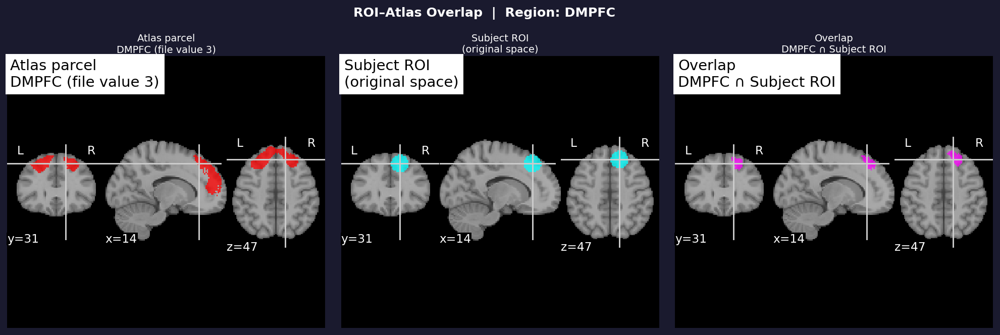

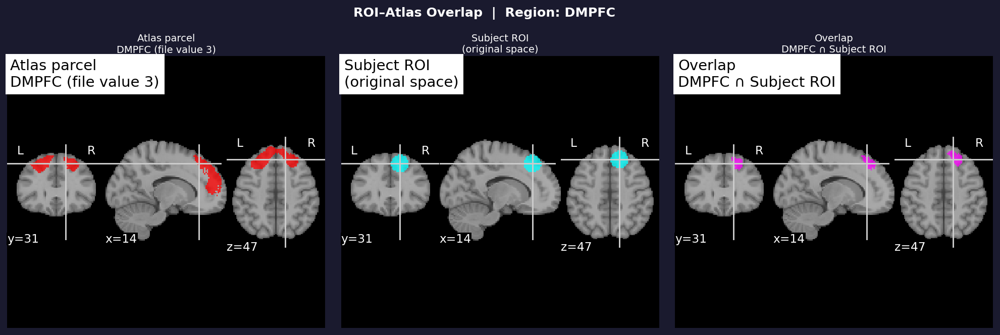

In [140]:
"""
ROI-Atlas Overlap Script v2
============================
Finds overlap between a subject ROI and the Neurosynth parcellation atlas,
identifies the named region, saves a labeled overlap NIfTI, and plots
the subject ROI alongside the full atlas parcel side by side.

Dependencies: nibabel, numpy, nilearn
Install: pip install nibabel numpy nilearn
"""

import os
import numpy as np
import nibabel as nib
from nilearn.image import resample_to_img
from nilearn import plotting

# ── Paths ─────────────────────────────────────────────────────────────────────
ROI_PATH = os.path.join(OUTPUT_DIR, 'ROI', 'sphere_r13mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz') #from spherical ROI

ATLAS_PATH = "/nfs/roberts/pi/pi_il77/shared/Neurosynth Parcellation_0.nii.gz"

# Anatomical background for plots (set to None to use MNI152 template)
ANAT_PATH = None  # e.g. "/path/to/mean_epi.nii.gz"

OUT_DIR    = os.path.dirname(ROI_PATH)
OUT_NII    = os.path.join(OUT_DIR, 'roi_51_SPHERE_atlas_overlap.nii.gz')
OUT_REPORT = os.path.join(OUT_DIR, 'roi_51_SPHERE_atlas_overlap_report.txt')
OUT_PLOT   = os.path.join(OUT_DIR, 'roi_51_SPHERE_atlas_overlap_plot.png')

# ── Neurosynth parcellation label mapping ─────────────────────────────────────
# Keys are the raw file values (label_id + 1 in the 0-based convention).
REGION_LABELS = {
    1:  "Anterior MPFC",
    2:  "Fusiform/Parahippocampus",
    3:  "DMPFC",
    4:  "Sensorimotor/Postcentral Gyrus",
    5:  "V1",
    6:  "TPJ Posterior SMG/Angular Gyrus",
    7:  "PCC/Precuneus",
    8:  "Thalamus",
    9:  "SMA",
    10: "Precentral Gyrus",
    11: "Cerebellum (VI)",
    12: "Temporal Occipital Fusiform",
    13: "Amygdala",
    14: "Superior Temporal Gyrus",
    15: "White Matter",
    16: "TPJ Anterior SMG/Parietal Operculum",
    17: "Mid Insula",
    18: "Putamen",
    19: "Dorsal Anterior Insula",
    20: "PCC/Superior LOC",
    21: "Lateral Occipital/Temporal Occipital (V2)",
    23: "dACC",
    24: "Anterior Fronto-Parietal (DLPFC, dACC)",
    25: "Intracalcarine Cortex",
    26: "Anterior VLPFC",
    28: "Left IFG",
    29: "Hippocampus",
    30: "Dorsal Caudate",
    31: "Unknown",
    33: "vmPFC",
    35: "NAcc",
    36: "Primary Auditory",
    38: "Ventral Anterior Insula",
    40: "Superior LOC",
    43: "Cerebellum (Crus)",
    45: "DLPFC",
    46: "Right IFG/VLPFC",
    47: "Inferior LOC",
    50: "STS",
}

# ── Helpers ───────────────────────────────────────────────────────────────────

def get_region_name(file_value):
    """Return human-readable label for a raw atlas file value."""
    return REGION_LABELS.get(int(file_value), f"Region_{int(file_value)}")


def resample_roi_to_atlas(roi_img, atlas_img):
    """Resample ROI to atlas space using nearest-neighbour interpolation."""
    print("  Resampling ROI to atlas space...")
    return resample_to_img(
        roi_img, atlas_img,
        interpolation='nearest',
        force_resample=True,
        copy_header=True,
    )


def make_atlas_parcel_mask(atlas_img, file_value):
    """Return a binary NIfTI of a single atlas parcel (by raw file value)."""
    data = np.round(atlas_img.get_fdata()).astype(np.int32)
    mask = (data == int(file_value)).astype(np.int8)
    return nib.Nifti1Image(mask, atlas_img.affine, atlas_img.header)


def get_roi_centroid_mni(roi_img):
    """Return the MNI centroid of a binary (non-zero) ROI image."""
    data = roi_img.get_fdata()
    voxels = np.argwhere(data != 0)
    if voxels.size == 0:
        return None
    centroid_vox = voxels.mean(axis=0)
    return nib.affines.apply_affine(roi_img.affine, centroid_vox)


def plot_side_by_side(roi_img, parcel_img, subject_roi_img,
                      region_name, file_value, cut_coords, anat):
    """
    Three-panel figure:
      Left  — full atlas parcel
      Centre — subject ROI (in atlas space)
      Right  — overlap (parcel mask * subject ROI)
    """
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec

    # Build overlap mask: voxels that are in BOTH the parcel and the subject ROI
    parcel_data  = parcel_img.get_fdata()
    subject_data = roi_img.get_fdata()   # already in atlas space
    overlap_data = ((parcel_data > 0) & (subject_data != 0)).astype(np.int8)
    overlap_img  = nib.Nifti1Image(overlap_data, parcel_img.affine)

    fig = plt.figure(figsize=(18, 5))
    fig.patch.set_facecolor('#1a1a2e')
    gs  = gridspec.GridSpec(1, 3, figure=fig, wspace=0.05)

    panels = [
        (gs[0], parcel_img,   f"Atlas parcel\n{region_name} (file value {file_value})", "autumn"),
        (gs[1], subject_roi_img, "Subject ROI\n(original space)",                       "cool"),
        (gs[2], overlap_img,  f"Overlap\n{region_name} ∩ Subject ROI",                  "spring"),
    ]

    for spec, img, title, cmap in panels:
        ax = fig.add_subplot(spec)
        display = plotting.plot_roi(
            img,
            bg_img=anat,
            display_mode='ortho',
            cut_coords=cut_coords,
            cmap=cmap,
            alpha=0.75,
            title=title,
            axes=ax,
            colorbar=False,
        )
        # Style the title
        ax.set_title(title, color='white', fontsize=10, pad=4)

    plt.suptitle(
        f"ROI–Atlas Overlap  |  Region: {region_name}",
        color='white', fontsize=13, fontweight='bold', y=1.02
    )
    return fig


# ── Main ──────────────────────────────────────────────────────────────────────

def main():
    print("Loading images...")
    roi_img   = nib.load(ROI_PATH)
    atlas_img = nib.load(ATLAS_PATH)

    print(f"  ROI   shape : {roi_img.shape}  | voxel size: {roi_img.header.get_zooms()}")
    print(f"  Atlas shape : {atlas_img.shape} | voxel size: {atlas_img.header.get_zooms()}")

    # Keep the original subject ROI for plotting in its own space
    subject_roi_img = roi_img

    # ── Align to atlas space ──────────────────────────────────────────────────
    if roi_img.shape != atlas_img.shape or not np.allclose(
            roi_img.affine, atlas_img.affine, atol=1e-3):
        print("Shapes / affines differ — resampling ROI to atlas space.")
        roi_img_r = resample_roi_to_atlas(roi_img, atlas_img)
        roi_data  = roi_img_r.get_fdata()
    else:
        print("Shapes match — no resampling needed.")
        roi_img_r = roi_img
        roi_data  = roi_img.get_fdata()

    # Use rounded integer atlas data to avoid float comparison issues
    atlas_data = np.round(atlas_img.get_fdata()).astype(np.int32)

    # ── Find overlapping atlas regions ───────────────────────────────────────
    roi_mask            = roi_data != 0
    overlap_atlas_vals  = atlas_data[roi_mask]
    overlap_atlas_vals  = overlap_atlas_vals[overlap_atlas_vals != 0]

    if overlap_atlas_vals.size == 0:
        print("\n⚠  No overlap found between the ROI and any atlas region.")
        return

    unique_regions, counts = np.unique(overlap_atlas_vals, return_counts=True)

    # ── Report ────────────────────────────────────────────────────────────────
    total_roi_vox = int(roi_mask.sum())
    lines = []
    lines.append("=" * 65)
    lines.append("ROI–Atlas Overlap Report")
    lines.append("=" * 65)
    lines.append(f"ROI file   : {ROI_PATH}")
    lines.append(f"Atlas file : {ATLAS_PATH}")
    lines.append(f"Total ROI voxels       : {total_roi_vox}")
    lines.append(f"Overlapping ROI voxels : {int(overlap_atlas_vals.size)}")
    lines.append("")
    lines.append(f"{'File value':<12} {'Region name':<42} {'Voxels':>8}  {'% of ROI':>9}")
    lines.append("-" * 75)

    for fv, cnt in sorted(zip(unique_regions, counts), key=lambda x: -x[1]):
        name = get_region_name(fv)
        pct  = 100.0 * cnt / total_roi_vox
        lines.append(f"{int(fv):<12} {name:<42} {int(cnt):>8}  {pct:>8.2f}%")

    lines.append("=" * 65)
    report_text = "\n".join(lines)
    print("\n" + report_text)

    with open(OUT_REPORT, 'w') as f:
        f.write(report_text + "\n")
    print(f"\nReport saved → {OUT_REPORT}")

    # ── Save overlap NIfTI ────────────────────────────────────────────────────
    overlap_vol = np.zeros(atlas_data.shape, dtype=np.int32)
    overlap_vol[roi_mask] = atlas_data[roi_mask]

    region_summary = ", ".join(get_region_name(fv) for fv in unique_regions)
    overlap_img    = nib.Nifti1Image(overlap_vol, atlas_img.affine, atlas_img.header)
    overlap_img.header['descrip'] = f"Overlap: {region_summary}"[:79].encode()

    nib.save(overlap_img, OUT_NII)
    print(f"Overlap NIfTI saved → {OUT_NII}")
    print(f"  Regions: {region_summary}")

    # ── Visualisation ─────────────────────────────────────────────────────────
    # Use the centroid of the subject ROI as the cut-coord anchor
    centroid = get_roi_centroid_mni(subject_roi_img)
    if centroid is None:
        centroid = (0, 0, 0)
    cut_coords = tuple(centroid.round(0).astype(int))
    print(f"\nPlotting with cut_coords (MNI): {cut_coords}")

    # Background: use provided anat, or fall back to MNI152 template
    if ANAT_PATH and os.path.isfile(ANAT_PATH):
        anat = nib.load(ANAT_PATH)
    else:
        from nilearn.datasets import load_mni152_template
        anat = load_mni152_template(resolution=2)

    # Dominant overlapping parcel (most voxels)
    dominant_fv   = unique_regions[np.argmax(counts)]
    dominant_name = get_region_name(dominant_fv)
    parcel_img    = make_atlas_parcel_mask(atlas_img, dominant_fv)

    fig = plot_side_by_side(
        roi_img_r,         # subject ROI in atlas space (for overlap calc)
        parcel_img,        # full atlas parcel
        subject_roi_img,   # original subject ROI (for middle panel)
        dominant_name,
        int(dominant_fv),
        cut_coords,
        anat,
    )

    fig.savefig(OUT_PLOT, dpi=150, bbox_inches='tight',
                facecolor='#1a1a2e')
    print(f"Plot saved → {OUT_PLOT}")

    # Also display inline if running in a notebook
    try:
        get_ipython  # noqa: F821
        from IPython.display import display
        display(fig)
    except NameError:
        import matplotlib.pyplot as plt
        plt.show()


if __name__ == "__main__":
    main()

# full sample (check inputs!): Start Group comparison, BES correlation, and BMI correlation in the extracted sphere (13mm) - exploratory

Example SUBJECT_ORDER entries (digits): ['002', '003', '004', '005', '006', '007', '008', '010', '011', '012']
N in SUBJECT_ORDER: 50
[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/sphere_r13mm_x14_y31_z47_ROIMaskOverlay.jpeg
[NiftiMasker.wrapped] Resampling images
[INFO] Kept subjects: Congruent-start N=25, Incongruent-start N=25
Contrast: CorrectUnaligned_gt_IncorrectUnaligned
ROI: sphere_r13mm_x14_y31_z47
------------------------------------------------------------
Congruent-start:   N=25, mean=0.0086, 95% CI [-0.0395, 0.0568], t=0.371, p=0.7142
Incongruent-start: N=25, mean=0.0218, 95% CI [-0.0291, 0.0727], t=0.885, p=0.3852
------------------------------------------------------------
Between-group (Welch): t=-0.388, p=0.7
Between-group (MWU):   U=299.000, p=0.8009
Effect size: Hedges g = -0.108


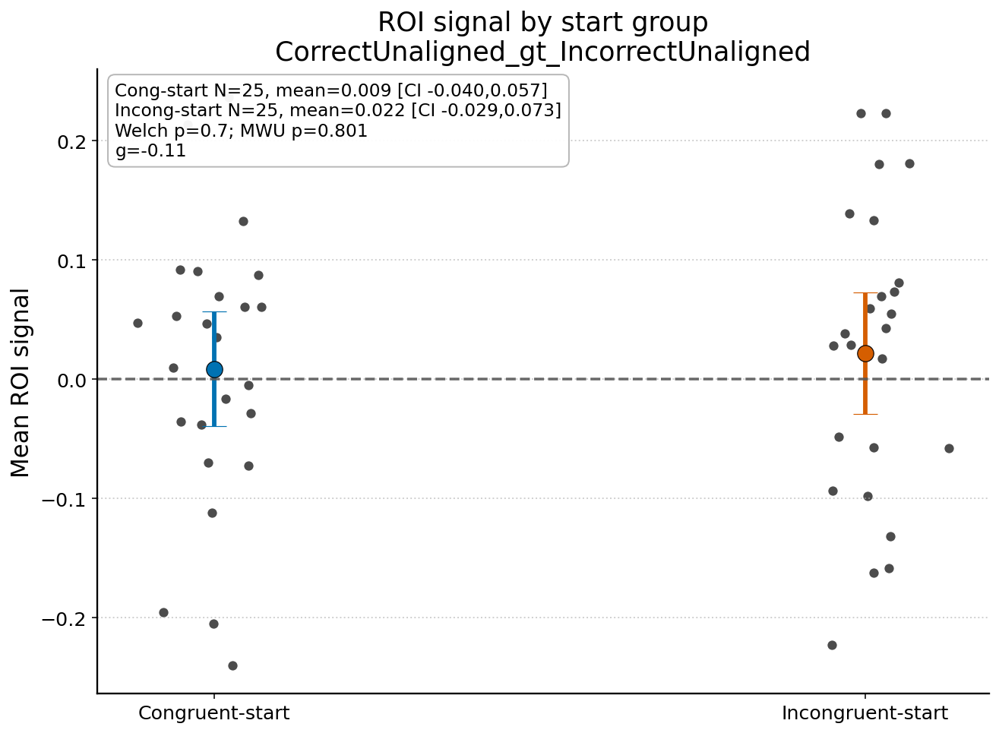

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/sphere_r13mm_x14_y31_z47_CorrectUnaligned_gt_IncorrectUnaligned_StartGroups_Dots_MeanCI.jpeg


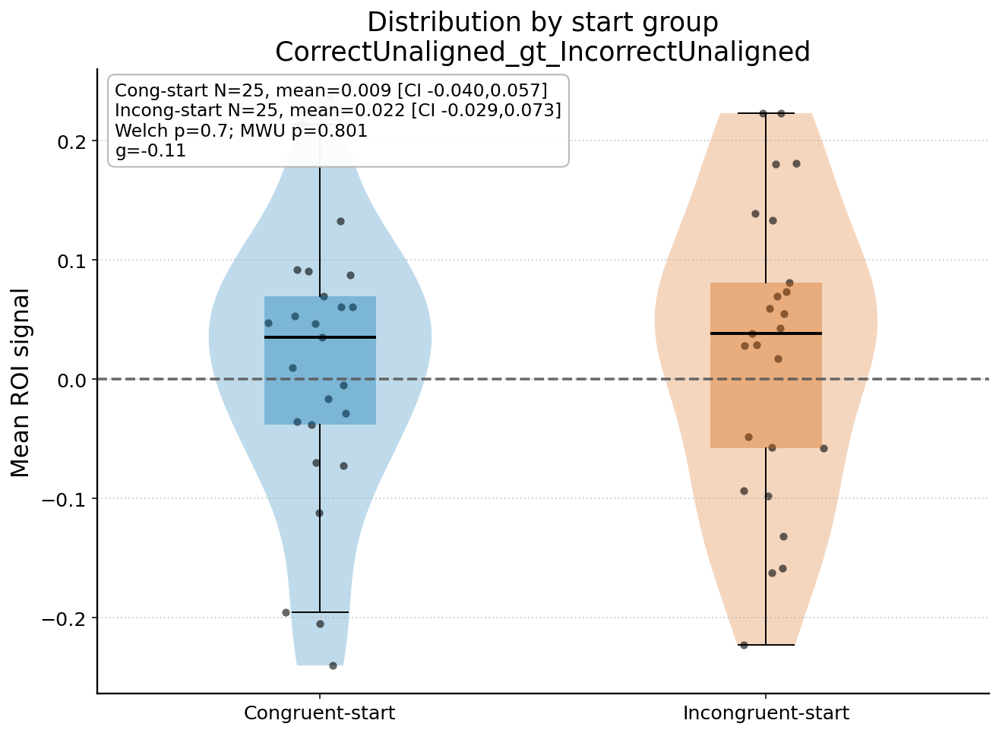

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/Atlas_Analyses_Figures/sphere_r13mm_x14_y31_z47_CorrectUnaligned_gt_IncorrectUnaligned_StartGroups_ViolinBox.jpeg


In [88]:
import os
import re
import numpy as np
import nibabel as nib
from nilearn import input_data, plotting
from scipy import stats
import matplotlib.pyplot as plt

# ============================================================
# SUBJECT IDs by start group (numeric-only)
# ============================================================
CONGRUENT_START_IDS = [
    "004","005","010","011","012","017","020","022","025","027","028","029",
    "102","104","108","110","112","114","204","209","212","213","215","220","221"
]
INCONGRUENT_START_IDS = [
    "002","003","006","007","008","013","016","019","021","023","024","026","030",
    "101","116","117","119","121","124","201","205","207","211","214","219"
]

def normalize_to_digits3(s: str) -> str:
    """
    Returns a 3-digit subject code as a string (e.g., '002').
    Handles: 'FVsub-002', 'sub-FV002', 'FV002', '002', etc.
    """
    s = str(s).strip()
    m = re.search(r"\b(\d{3})\b", s)
    if m:
        return m.group(1)
    m = re.search(r"(\d+)", s)
    if not m:
        raise ValueError(f"Could not extract digits from subject id: {s}")
    digits = m.group(1)
    return digits[-3:].zfill(3)

def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def mean_ci_t(x, confidence=0.95):
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = x.size
    mean = float(np.mean(x))
    sem = float(stats.sem(x)) if n > 1 else np.nan
    df = n - 1
    tcrit = float(stats.t.ppf((1 + confidence) / 2, df)) if n > 1 else np.nan
    half = tcrit * sem if n > 1 else np.nan
    return mean, (mean - half, mean + half)

def hedges_g(x1, x2):
    x1 = np.asarray(x1, dtype=float); x2 = np.asarray(x2, dtype=float)
    x1 = x1[~np.isnan(x1)]; x2 = x2[~np.isnan(x2)]
    n1, n2 = x1.size, x2.size
    if n1 < 2 or n2 < 2:
        return np.nan
    s1 = np.var(x1, ddof=1); s2 = np.var(x2, ddof=1)
    sp = np.sqrt(((n1 - 1)*s1 + (n2 - 1)*s2) / (n1 + n2 - 2))
    d = (np.mean(x1) - np.mean(x2)) / sp
    J = 1 - (3 / (4*(n1 + n2) - 9))
    return float(J * d)

# ============================================================
# SETTINGS: MUST match how you wrote the 4D file
# ============================================================
contrast_name = "CorrectUnaligned_gt_IncorrectUnaligned"  # <-- set correctly
roi_label = "sphere_r13mm_x14_y31_z47"

FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample"
os.makedirs(FIG_DIR, exist_ok=True)

plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 18,
    "axes.labelsize": 16,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 12,
})

MEAN_COLOR_A = "#0072B2"   # blue
MEAN_COLOR_B = "#D55E00"   # orange
ZERO_COLOR = "0.35"

roi_slug = safe_filename(roi_label)
contrast_slug = safe_filename(contrast_name)

# ============================================================
# LOAD 4D + numeric subject order saved by builder script
# ============================================================
functional_img_path = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_name}_all_sub_4d.nii.gz")
subject_order_path = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_name}_all_sub_4d_subject_order.txt")

functional_img = nib.load(functional_img_path)

with open(subject_order_path, "r") as f:
    SUBJECT_ORDER = [normalize_to_digits3(line.strip()) for line in f if line.strip()]

print("Example SUBJECT_ORDER entries (digits):", SUBJECT_ORDER[:10])
print("N in SUBJECT_ORDER:", len(SUBJECT_ORDER))

if functional_img.shape[3] != len(SUBJECT_ORDER):
    raise ValueError(
        f"Mismatch: 4D has {functional_img.shape[3]} volumes but SUBJECT_ORDER has {len(SUBJECT_ORDER)} IDs."
    )

# ============================================================
# ROI overlay (optional)
# ============================================================
roi_mask_img = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r13mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz"
display = plotting.plot_roi(roi_mask_img, anat_img, title=f"ROI Mask: {roi_label}", colorbar=False)
#roi_out = os.path.join(FIG_DIR, f"{roi_slug}_ROIMaskOverlay.jpeg")
#display.savefig(roi_out, dpi=600)
#display.close()
#print(f"[OK] Saved: {roi_out}")

# ============================================================
# Extract ROI means per subject (reduce resampling overhead)
# ============================================================
masker = input_data.NiftiMasker(
    mask_img=roi_mask_img,
    standardize=False,
    target_affine=functional_img.affine,
    target_shape=functional_img.shape[:3],
)
roi_vox = masker.fit_transform(functional_img)  # n_sub x n_vox
mean_signal = roi_vox.mean(axis=1)              # n_sub

# ============================================================
# Match groups to SUBJECT_ORDER (digits-only)
# ============================================================
sub_to_idx = {s: i for i, s in enumerate(SUBJECT_ORDER)}

cong_ids = [normalize_to_digits3(s) for s in CONGRUENT_START_IDS]
incong_ids = [normalize_to_digits3(s) for s in INCONGRUENT_START_IDS]

missing_cong = [s for s in cong_ids if s not in sub_to_idx]
missing_incong = [s for s in incong_ids if s not in sub_to_idx]
if missing_cong or missing_incong:
    print("[WARN] Some subjects were not present in the 4D file (excluded):")
    if missing_cong: print("  Missing congruent-start:", missing_cong)
    if missing_incong: print("  Missing incongruent-start:", missing_incong)

cong_idx = [sub_to_idx[s] for s in cong_ids if s in sub_to_idx]
incong_idx = [sub_to_idx[s] for s in incong_ids if s in sub_to_idx]

x_cong = np.asarray(mean_signal)[cong_idx].astype(float)
x_incong = np.asarray(mean_signal)[incong_idx].astype(float)

print(f"[INFO] Kept subjects: Congruent-start N={x_cong.size}, Incongruent-start N={x_incong.size}")

if x_cong.size == 0 or x_incong.size == 0:
    raise RuntimeError(
        "Empty group after matching. "
        "Check that you rebuilt the 4D + subject_order using the updated builder script, "
        "and that contrast_name matches."
    )

# ============================================================
# Stats: within-group vs 0 + between-group
# ============================================================
n1, n2 = x_cong.size, x_incong.size
m1, (ci1_lo, ci1_hi) = mean_ci_t(x_cong, 0.95)
m2, (ci2_lo, ci2_hi) = mean_ci_t(x_incong, 0.95)

t1, p1 = stats.ttest_1samp(x_cong, 0.0, nan_policy="omit")
t2, p2 = stats.ttest_1samp(x_incong, 0.0, nan_policy="omit")

t_welch, p_welch = stats.ttest_ind(x_cong, x_incong, equal_var=False, nan_policy="omit")
u_stat, p_u = stats.mannwhitneyu(x_cong, x_incong, alternative="two-sided")

g = hedges_g(x_cong, x_incong)

print("============================================================")
print(f"Contrast: {contrast_name}")
print(f"ROI: {roi_label}")
print("------------------------------------------------------------")
print(f"Congruent-start:   N={n1}, mean={m1:.4f}, 95% CI [{ci1_lo:.4f}, {ci1_hi:.4f}], t={float(t1):.3f}, p={float(p1):.4g}")
print(f"Incongruent-start: N={n2}, mean={m2:.4f}, 95% CI [{ci2_lo:.4f}, {ci2_hi:.4f}], t={float(t2):.3f}, p={float(p2):.4g}")
print("------------------------------------------------------------")
print(f"Between-group (Welch): t={float(t_welch):.3f}, p={float(p_welch):.4g}")
print(f"Between-group (MWU):   U={float(u_stat):.3f}, p={float(p_u):.4g}")
print(f"Effect size: Hedges g = {g:.3f}")
print("============================================================")

stats_text = (
    f"Cong-start N={n1}, mean={m1:.3f} [CI {ci1_lo:.3f},{ci1_hi:.3f}]\n"
    f"Incong-start N={n2}, mean={m2:.3f} [CI {ci2_lo:.3f},{ci2_hi:.3f}]\n"
    f"Welch p={float(p_welch):.3g}; MWU p={float(p_u):.3g}\n"
    f"g={g:.2f}"
)

# ============================================================
# Plot 1: jitter points + mean ± 95% CI
# ============================================================
fig1, ax1 = plt.subplots(figsize=(9.5, 7))
rng = np.random.default_rng(42)
xpos1 = 0 + rng.normal(0, 0.06, size=n1)
xpos2 = 1 + rng.normal(0, 0.06, size=n2)

ax1.scatter(xpos1, x_cong, color="black", alpha=0.7, s=40, linewidths=0)
ax1.scatter(xpos2, x_incong, color="black", alpha=0.7, s=40, linewidths=0)

ax1.errorbar(0, m1, yerr=[[m1 - ci1_lo],[ci1_hi - m1]], fmt="o",
             color=MEAN_COLOR_A, ecolor=MEAN_COLOR_A, elinewidth=3, capsize=8,
             markersize=11, markeredgecolor="black", markeredgewidth=0.6)
ax1.errorbar(1, m2, yerr=[[m2 - ci2_lo],[ci2_hi - m2]], fmt="o",
             color=MEAN_COLOR_B, ecolor=MEAN_COLOR_B, elinewidth=3, capsize=8,
             markersize=11, markeredgecolor="black", markeredgewidth=0.6)

ax1.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax1.set_xticks([0, 1])
ax1.set_xticklabels(["Congruent-start", "Incongruent-start"])
ax1.set_ylabel("Mean ROI signal")
ax1.set_title(f"ROI signal by start group\n{contrast_name}")

ax1.text(0.02, 0.98, stats_text, transform=ax1.transAxes,
         va="top", ha="left", fontsize=12,
         bbox=dict(boxstyle="round,pad=0.4", facecolor="white", edgecolor="0.7", alpha=0.95))

ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

plt.tight_layout()
out1 = os.path.join(FIG_DIR, f"{roi_slug}_{contrast_slug}_StartGroups_Dots_MeanCI.jpeg")
fig1.savefig(out1, dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out1}")

# ============================================================
# Plot 2: violin + box + points (distribution)
# ============================================================
# Guard: violinplot fails if any group is empty (we already error above),
# but keep a defensive check anyway.
fig2, ax2 = plt.subplots(figsize=(9.5, 7))
data = [x_cong, x_incong]

vp = ax2.violinplot(data, positions=[0, 1], showmeans=False, showextrema=False, showmedians=False)
for i, body in enumerate(vp["bodies"]):
    body.set_facecolor(MEAN_COLOR_A if i == 0 else MEAN_COLOR_B)
    body.set_edgecolor("none")
    body.set_alpha(0.25)

bp = ax2.boxplot(data, positions=[0, 1], widths=0.25, patch_artist=True, showfliers=False,
                 medianprops=dict(color="black", linewidth=2.0))
bp["boxes"][0].set(facecolor=MEAN_COLOR_A, alpha=0.35, edgecolor="none")
bp["boxes"][1].set(facecolor=MEAN_COLOR_B, alpha=0.35, edgecolor="none")

ax2.scatter(xpos1, x_cong, color="black", alpha=0.6, s=28, linewidths=0)
ax2.scatter(xpos2, x_incong, color="black", alpha=0.6, s=28, linewidths=0)

ax2.axhline(0, color=ZERO_COLOR, linestyle="--", linewidth=1.8, alpha=0.9)
ax2.set_xticks([0, 1])
ax2.set_xticklabels(["Congruent-start", "Incongruent-start"])
ax2.set_ylabel("Mean ROI signal")
ax2.set_title(f"Distribution by start group\n{contrast_name}")

ax2.text(0.02, 0.98, stats_text, transform=ax2.transAxes,
         va="top", ha="left", fontsize=12,
         bbox=dict(boxstyle="round,pad=0.4", facecolor="white", edgecolor="0.7", alpha=0.95))

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

plt.tight_layout()
out2 = os.path.join(FIG_DIR, f"{roi_slug}_{contrast_slug}_StartGroups_ViolinBox.jpeg")
fig2.savefig(out2, dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out2}")

[NiftiMasker.wrapped] Resampling images
[INFO] ROI data: N=50 subjects in 4D after dropping NaNs
[INFO] Survey bes_GLOBAL: N=49 subjects with numeric values
[INFO] Overlap ROI x bes_GLOBAL: N=47

Correlation results:
Pearson:  r = 0.023, p = 0.8769
Spearman: ρ = 0.127, p = 0.396


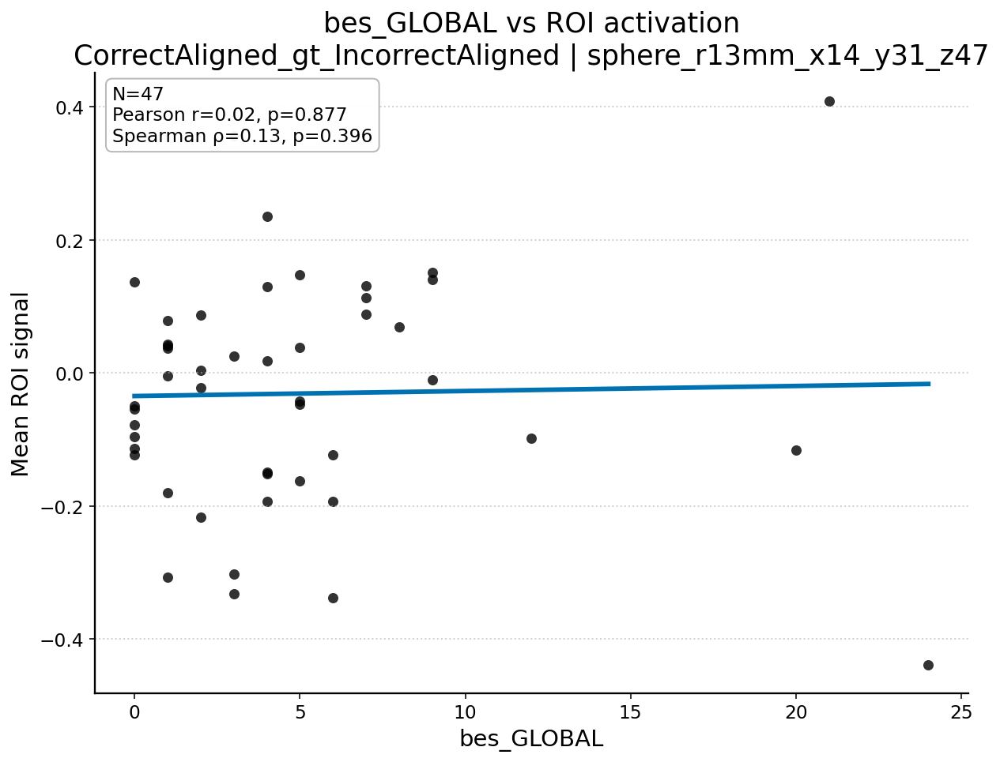

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/sphere_r13mm_x14_y31_z47_CorrectAligned_gt_IncorrectAligned_besGLOBAL_correlation.jpeg
[OK] Saved merged data table: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/sphere_r13mm_x14_y31_z47_CorrectAligned_gt_IncorrectAligned_besGLOBAL_roi_merged.csv


In [91]:
import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
from nilearn import input_data
from scipy import stats
import matplotlib.pyplot as plt

# ============================================================
# Helpers
# ============================================================
def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def normalize_to_digits3(s: str) -> str:
    """
    Canonical subject code: '002', '010', '221', etc.
    Works for: 2, '2', '002', 'FV002', 'sub-002', 'FVsub-002', etc.
    """
    s = str(s).strip()
    # Prefer exactly 3 digits if present
    m = re.search(r"\b(\d{3})\b", s)
    if m:
        return m.group(1)
    # Otherwise take digits, pad/clip to 3
    m = re.search(r"(\d+)", s)
    if not m:
        raise ValueError(f"Could not extract digits from subject id: {s}")
    digits = m.group(1)
    return digits[-3:].zfill(3)

# ============================================================
# SETTINGS
# ============================================================
contrast_key = "CorrectAligned_gt_IncorrectAligned"
roi_label = "sphere_r13mm_x14_y31_z47"

FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample"
os.makedirs(FIG_DIR, exist_ok=True)

# Survey file
survey_csv = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/data/survey_responses.csv"
survey_row_name = "bes_GLOBAL"   # row to use from the survey table

# Optional (recommended): subject order file if you have it.
# If you created the 4D with the builder that saves order, set this path.
subject_order_path = os.path.join(
    str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d_subject_order.txt"
)

# ============================================================
# 1) Extract mean ROI signal per subject
# ============================================================
functional_img_path = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d.nii.gz")
functional_img = nib.load(functional_img_path)

# Use your existing ROI mask object
roi_mask_img = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r13mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz"

# Use target_affine/shape to reduce resampling surprises
masker = input_data.NiftiMasker(
    mask_img=roi_mask_img,
    standardize=False,
    target_affine=functional_img.affine,
    target_shape=functional_img.shape[:3],
)
roi_vox = masker.fit_transform(functional_img)          # (n_sub, n_vox)
roi_mean = np.asarray(roi_vox.mean(axis=1)).ravel()     # (n_sub,)

# Figure out subject IDs for each 4D volume
if os.path.exists(subject_order_path):
    with open(subject_order_path, "r") as f:
        subj_order = [normalize_to_digits3(line.strip()) for line in f if line.strip()]
    if len(subj_order) != functional_img.shape[3]:
        raise ValueError(
            f"Mismatch: 4D has {functional_img.shape[3]} volumes but subject_order has {len(subj_order)} IDs."
        )
else:
    raise FileNotFoundError(
        f"Missing subject order file needed to align ROI values to survey data:\n{subject_order_path}\n"
        "Create it when building the 4D image (recommended) or provide a SUBJECT_ORDER list."
    )

roi_df = pd.DataFrame({
    "subject": subj_order,
    "roi_mean": roi_mean.astype(float),
})
roi_df = roi_df.dropna(subset=["roi_mean"])

print(f"[INFO] ROI data: N={len(roi_df)} subjects in 4D after dropping NaNs")

# ============================================================
# 2) Load survey, pull bes_GLOBAL row, reshape to long (subject, score)
# ============================================================
survey_wide = pd.read_csv(survey_csv, sep=None, engine="python")  # auto-detect delimiter

# Ensure first column is the row labels (e.g., 'subject_ID', 'BMI', 'bes_GLOBAL', ...)
row_label_col = survey_wide.columns[0]
survey_wide = survey_wide.set_index(row_label_col)

if survey_row_name not in survey_wide.index:
    raise KeyError(f"Row '{survey_row_name}' not found in survey file. Available rows include: {survey_wide.index[:20].tolist()} ...")

bes_series = survey_wide.loc[survey_row_name]  # columns are subjects

# Build long DF: subject, bes_GLOBAL
survey_long = (
    bes_series
    .rename("bes_GLOBAL")
    .reset_index()
    .rename(columns={"index": "subject_raw"})
)

survey_long["subject"] = survey_long["subject_raw"].apply(normalize_to_digits3)
survey_long["bes_GLOBAL"] = pd.to_numeric(survey_long["bes_GLOBAL"], errors="coerce")
survey_long = survey_long.dropna(subset=["bes_GLOBAL"])

print(f"[INFO] Survey bes_GLOBAL: N={len(survey_long)} subjects with numeric values")

# ============================================================
# 3) Merge + run correlations
# ============================================================
merged = pd.merge(roi_df, survey_long[["subject", "bes_GLOBAL"]], on="subject", how="inner")
merged = merged.dropna(subset=["roi_mean", "bes_GLOBAL"])

n = len(merged)
print(f"[INFO] Overlap ROI x bes_GLOBAL: N={n}")

if n < 3:
    raise RuntimeError("Not enough overlapping subjects to compute correlation (need at least 3).")

x = merged["bes_GLOBAL"].to_numpy(dtype=float)
y = merged["roi_mean"].to_numpy(dtype=float)

# Pearson (linear association)
r, p_r = stats.pearsonr(x, y)

# Spearman (rank association; robust to outliers / nonlinearity)
rho, p_rho = stats.spearmanr(x, y)

print("\nCorrelation results:")
print(f"Pearson:  r = {r:.3f}, p = {p_r:.4g}")
print(f"Spearman: ρ = {rho:.3f}, p = {p_rho:.4g}")

# ============================================================
# 4) Plot: scatter + least-squares line + save
# ============================================================
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 18,
    "axes.labelsize": 15,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})

fig, ax = plt.subplots(figsize=(9, 7))

ax.scatter(x, y, color="black", alpha=0.8, s=45, linewidths=0)

# Regression line (simple linear fit)
slope, intercept = np.polyfit(x, y, 1)
xx = np.linspace(np.min(x), np.max(x), 200)
yy = slope * xx + intercept
ax.plot(xx, yy, color="#0072B2", linewidth=3)

ax.set_xlabel("bes_GLOBAL")
ax.set_ylabel("Mean ROI signal")
ax.set_title(f"bes_GLOBAL vs ROI activation\n{contrast_key} | {roi_label}")

stats_text = (
    f"N={n}\n"
    f"Pearson r={r:.2f}, p={p_r:.3g}\n"
    f"Spearman ρ={rho:.2f}, p={p_rho:.3g}"
)
ax.text(
    0.02, 0.98, stats_text,
    transform=ax.transAxes, va="top", ha="left",
    fontsize=12,
    bbox=dict(boxstyle="round,pad=0.35", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

plt.tight_layout()

fname = f"{safe_filename(roi_label)}_{safe_filename(contrast_key)}_besGLOBAL_correlation.jpeg"
out = os.path.join(FIG_DIR, fname)
fig.savefig(out, dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out}")

# Optional: save the merged table used for stats
merged_out = os.path.join(FIG_DIR, f"{safe_filename(roi_label)}_{safe_filename(contrast_key)}_besGLOBAL_roi_merged.csv")
merged.to_csv(merged_out, index=False)
print(f"[OK] Saved merged data table: {merged_out}")

[NiftiMasker.wrapped] Resampling images
[INFO] ROI data: N=50 subjects in 4D after dropping NaNs
[INFO] Survey BMI: N=52 subjects with numeric values
[INFO] Overlap ROI x BMI: N=50

Correlation results (BMI):
Pearson:  r = -0.073, p = 0.6155
Spearman: ρ = -0.178, p = 0.2172


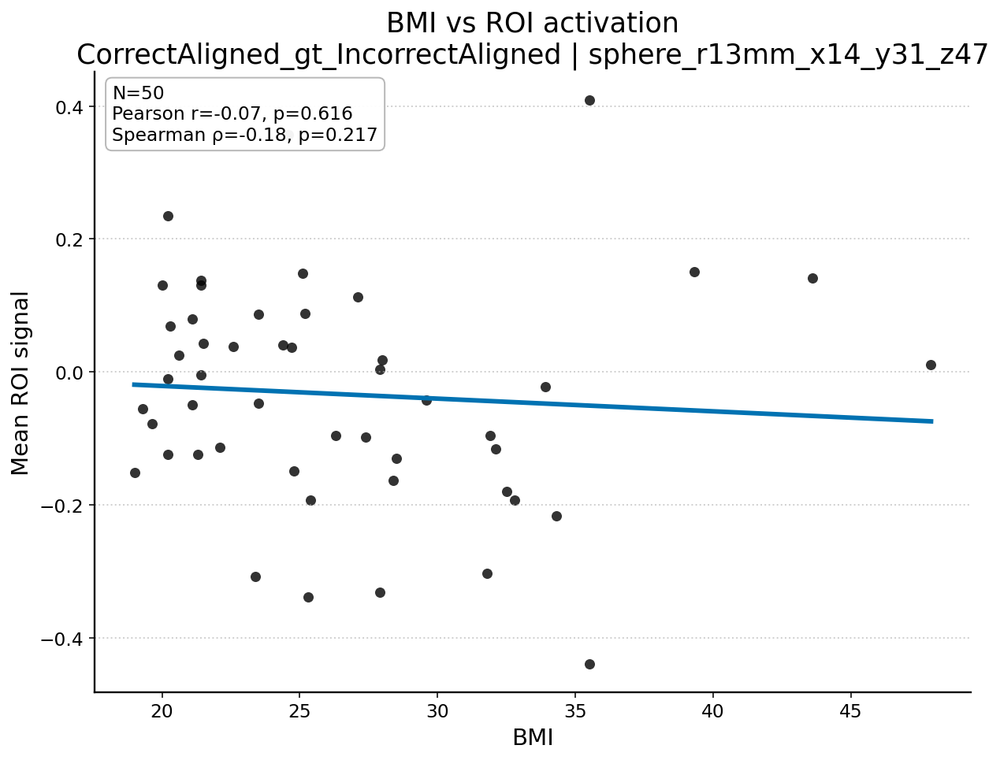

[OK] Saved: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/sphere_r13mm_x14_y31_z47_CorrectAligned_gt_IncorrectAligned_BMI_correlation.jpeg
[OK] Saved merged data table: /nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample/sphere_r13mm_x14_y31_z47_CorrectAligned_gt_IncorrectAligned_BMI_roi_merged.csv


In [92]:
import os
import re
import numpy as np
import pandas as pd
import nibabel as nib
from nilearn import input_data
from scipy import stats
import matplotlib.pyplot as plt

# ============================================================
# Helpers
# ============================================================
def safe_filename(s: str, maxlen: int = 140) -> str:
    s = s.strip()
    s = s.replace(">", "gt").replace("<", "lt")
    s = re.sub(r"\s+", "_", s)
    s = re.sub(r"[^A-Za-z0-9_\-]+", "", s)
    return s[:maxlen]

def normalize_to_digits3(s: str) -> str:
    """
    Canonical subject code: '002', '010', '221', etc.
    Works for: 2, '2', '002', 'FV002', 'sub-002', 'FVsub-002', etc.
    """
    s = str(s).strip()
    m = re.search(r"\b(\d{3})\b", s)
    if m:
        return m.group(1)
    m = re.search(r"(\d+)", s)
    if not m:
        raise ValueError(f"Could not extract digits from subject id: {s}")
    digits = m.group(1)
    return digits[-3:].zfill(3)

# ============================================================
# SETTINGS
# ============================================================
contrast_key = "CorrectAligned_gt_IncorrectAligned"
roi_label = "sphere_r13mm_x14_y31_z47"

FIG_DIR = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/output/BI/fullsample"
os.makedirs(FIG_DIR, exist_ok=True)

# Survey file
survey_csv = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/data/survey_responses.csv"
survey_row_name = "BMI"   # <-- CHANGED from bes_GLOBAL to BMI

# Subject order file for 4D volume alignment
subject_order_path = os.path.join(
    str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d_subject_order.txt"
)

# ============================================================
# 1) Extract mean ROI signal per subject
# ============================================================
functional_img_path = os.path.join(str(OUTPUT_DIR), f"none_glm_{contrast_key}_all_sub_4d.nii.gz")
functional_img = nib.load(functional_img_path)

roi_mask_img = "/nfs/roberts/pi/pi_il77/Alex/foodvaluation/results/nilearn_task_BI/ROI/sphere_r13mm_x14_y31_z47_mask_DECOUPLED_FIRSTHALF.nii.gz"

masker = input_data.NiftiMasker(
    mask_img=roi_mask_img,
    standardize=False,
    target_affine=functional_img.affine,
    target_shape=functional_img.shape[:3],
)
roi_vox = masker.fit_transform(functional_img)
roi_mean = np.asarray(roi_vox.mean(axis=1)).ravel()

# Load subject IDs for each 4D volume
if os.path.exists(subject_order_path):
    with open(subject_order_path, "r") as f:
        subj_order = [normalize_to_digits3(line.strip()) for line in f if line.strip()]
    if len(subj_order) != functional_img.shape[3]:
        raise ValueError(
            f"Mismatch: 4D has {functional_img.shape[3]} volumes but subject_order has {len(subj_order)} IDs."
        )
else:
    raise FileNotFoundError(
        f"Missing subject order file needed to align ROI values to survey data:\n{subject_order_path}\n"
        "Create it when building the 4D image (recommended) or provide a SUBJECT_ORDER list."
    )

roi_df = pd.DataFrame({
    "subject": subj_order,
    "roi_mean": roi_mean.astype(float),
}).dropna(subset=["roi_mean"])

print(f"[INFO] ROI data: N={len(roi_df)} subjects in 4D after dropping NaNs")

# ============================================================
# 2) Load survey, pull BMI row, reshape to long (subject, BMI)
# ============================================================
survey_wide = pd.read_csv(survey_csv, sep=None, engine="python")  # auto-detect delimiter

row_label_col = survey_wide.columns[0]
survey_wide = survey_wide.set_index(row_label_col)

if survey_row_name not in survey_wide.index:
    raise KeyError(
        f"Row '{survey_row_name}' not found in survey file. "
        f"Available rows include: {survey_wide.index[:30].tolist()} ..."
    )

bmi_series = survey_wide.loc[survey_row_name]  # columns are subjects

survey_long = (
    bmi_series
    .rename("BMI")
    .reset_index()
    .rename(columns={"index": "subject_raw"})
)

survey_long["subject"] = survey_long["subject_raw"].apply(normalize_to_digits3)
survey_long["BMI"] = pd.to_numeric(survey_long["BMI"], errors="coerce")
survey_long = survey_long.dropna(subset=["BMI"])

print(f"[INFO] Survey BMI: N={len(survey_long)} subjects with numeric values")

# ============================================================
# 3) Merge + run correlations
# ============================================================
merged = pd.merge(roi_df, survey_long[["subject", "BMI"]], on="subject", how="inner")
merged = merged.dropna(subset=["roi_mean", "BMI"])

n = len(merged)
print(f"[INFO] Overlap ROI x BMI: N={n}")

if n < 3:
    raise RuntimeError("Not enough overlapping subjects to compute correlation (need at least 3).")

x = merged["BMI"].to_numpy(dtype=float)
y = merged["roi_mean"].to_numpy(dtype=float)

r, p_r = stats.pearsonr(x, y)
rho, p_rho = stats.spearmanr(x, y)

print("\nCorrelation results (BMI):")
print(f"Pearson:  r = {r:.3f}, p = {p_r:.4g}")
print(f"Spearman: ρ = {rho:.3f}, p = {p_rho:.4g}")

# ============================================================
# 4) Plot: scatter + least-squares line + save
# ============================================================
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 600,
    "axes.titlesize": 18,
    "axes.labelsize": 15,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})

fig, ax = plt.subplots(figsize=(9, 7))
ax.scatter(x, y, color="black", alpha=0.8, s=45, linewidths=0)

slope, intercept = np.polyfit(x, y, 1)
xx = np.linspace(np.min(x), np.max(x), 200)
yy = slope * xx + intercept
ax.plot(xx, yy, color="#0072B2", linewidth=3)

ax.set_xlabel("BMI")
ax.set_ylabel("Mean ROI signal")
ax.set_title(f"BMI vs ROI activation\n{contrast_key} | {roi_label}")

stats_text = (
    f"N={n}\n"
    f"Pearson r={r:.2f}, p={p_r:.3g}\n"
    f"Spearman ρ={rho:.2f}, p={p_rho:.3g}"
)
ax.text(
    0.02, 0.98, stats_text,
    transform=ax.transAxes, va="top", ha="left",
    fontsize=12,
    bbox=dict(boxstyle="round,pad=0.35", facecolor="white", edgecolor="0.7", alpha=0.95)
)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(True, axis="y", linestyle=":", linewidth=1.0, alpha=0.6)

plt.tight_layout()

fname = f"{safe_filename(roi_label)}_{safe_filename(contrast_key)}_BMI_correlation.jpeg"
out = os.path.join(FIG_DIR, fname)
fig.savefig(out, dpi=600, bbox_inches="tight")
plt.show()
print(f"[OK] Saved: {out}")

# Save merged table used for stats
merged_out = os.path.join(FIG_DIR, f"{safe_filename(roi_label)}_{safe_filename(contrast_key)}_BMI_roi_merged.csv")
merged.to_csv(merged_out, index=False)
print(f"[OK] Saved merged data table: {merged_out}")